# Imports and Functions

In [1]:
#import datetime as dt
import cftime 
import time
import datetime
import datetime as dt
import numpy as np
import math as M
import glob
import os
import re
import xarray as xr
import pandas as pd
import json


import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import ticker
from matplotlib.colors import LinearSegmentedColormap, to_rgb
import matplotlib.patheffects as path_effects
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.transforms as transforms
import matplotlib.patches as patches

#from matplotlib.offsetbox import AnchoredText
import skimage.measure as sm
from scipy import stats
import scipy.interpolate
import scipy.ndimage as ndimage
import scipy.spatial
from scipy.ndimage import gaussian_filter

from metpy import calc as mpcalc
from metpy.units import units
from metpy.plots import Hodograph, SkewT
from metpy.interpolate import interpolate_1d

from subprocess import *
import src.plot_src.ctables as ctables
import colormaps as cmaps


import sys
sys.path.append('src/')
sys.path.append('src/fsrc/')
sys.path.append('fsrc/')
from fpython2 import fstate, addbubbles_box, obs_2_grid3d
from fpython2 import add_smooth_perts
import ens
import state_vector as state


sys.path.append('/work/jessica.mcdonald/CAM_analysis_tools/filter/')
import RaymondFilters

def findnearest(array, value):
    array = np.asarray(array)
    return (np.abs(array-value)).argmin()

#mpl.rcParams.keys()
mpl.rcParams.update({"axes.grid" : False, "grid.color": "0.6",  'grid.linestyle':':',
                    'grid.linewidth':1, 'axes.labelweight':'bold', 'legend.framealpha':1.0, 'lines.solid_capstyle':'butt',
                     'axes.labelsize':13, 'axes.titlesize':18, 'ytick.labelsize':13, 'xtick.labelsize':13, 'axes.titleweight':'bold'})

ens2nr = {'UH_2-5km': {25: 39, 50: 75, 75: 114, 100: 156, 125: 197, 150: 230}, 
               'cdbz': {30: 30, 35: 35, 40: 40, 45: 45, 50: 50, 55: 55}}


def get_mean_var(files, var, height=None, return_dims=False, return_all_dims=False):
    myvar = []
    for f in files:
        cm1 = xr.open_dataset(f, decode_timedelta=True)
        if height != None:
            zi = findnearest(cm1.zh, height)
            myvar.append(cm1[var][0,zi].values)
        else:
            myvar.append(cm1[var][0].values)
    if return_dims:
        z,y,x = cm1.zh.values, cm1.yh.values, cm1.xh.values
        
    cm1.close()
    meanvar = np.mean(myvar, axis=0)
    
    if return_dims:
        if (height==None) | (return_all_dims==True):
            return z,y,x, meanvar
        else:
            return y,x, meanvar
    else:
        return meanvar


def pmm(cm1, var, height,t, return_mean=False):
    ''' height is in km'''

    N = cm1.sizes['ne']-1
    zi = findnearest(cm1.z, height)

    ens_mean = cm1[var][t, -1,zi]
    ranked_ens =sorted(cm1[var][t, :-1, zi].values.ravel())[::N]
    
    x,y = np.meshgrid(cm1.xh, cm1.yh)
    d = {'ens':ens_mean.values.ravel(), 'x':x.ravel(), 'y':y.ravel()}
    df = pd.DataFrame(d)
    
    df_ranked = df.sort_values(by='ens')
    df_ranked['ens'] = ranked_ens
    
    df_pmm = df_ranked.sort_index()

    if return_mean:
    
        return df_pmm['ens'].values.reshape(np.shape(x)), ens_mean
    else:
        return df_pmm['ens'].values.reshape(np.shape(x))

    
def add_scale(ax, xstart=200, xlength=50, y=280, cap_length=200*.04, text_bump =0):

    xend = xstart+xlength
    
    ax.plot([xstart,xend], [y,y], color='k')
    ax.plot([xstart,xstart], [y-cap_length/2,y+cap_length/2], color='k')
    ax.plot([xend, xend], [y-cap_length/2,y+cap_length/2], color='k')
    #ax.text(xstart+xlength/2, y-cap_length/2, '{xlength} km', ha='center', va='top', fontsize=13)
    ax.text(xstart+xlength/2, text_bump+y+cap_length/2, f'{xlength} km', ha='center', va='bottom', fontsize=13)


def raw_probs(field, threshold, ensN):
   
    probs = np.zeros_like(field)
    probs[field >= threshold] = 1
    return probs.sum(axis=0)/ensN

def performance_diagram(ax, axis_labels=True, colorbar_auto=False, cax = None, cbar_fs = 13, return_colorbar_info = True, bias_label_size = 10, version='Full'):

    ax.set_aspect('equal')
    ax.set_xlim(0,1.)
    ax.set_ylim(0,1.)
    
    sr_array = np.linspace(0.001,1,200)
    pod_array = np.linspace(0.001,1,200)
    X,Y = np.meshgrid(sr_array,pod_array)
    csi_vals = (X** -1 + Y ** -1 - 1.) ** -1 
    im = ax.contourf(X,Y,csi_vals,levels=np.arange(0,1.1,0.1),cmap='Greys', alpha=0.3, antialiased=True, zorder=0) #blue_blgra2_r,
    ax.contour(X,Y,csi_vals, levels=[0.2, 0.5, 0.8], colors='0.5', alpha=0.3)

    if version == 'Full':

        fb = Y/X #X/Y
        ax.contour(X,Y,fb,levels=[1],linestyles='--',colors='0.5', linewidths=1)
        bias = ax.contour(X,Y,fb,levels=[0.1,0.5,1,1.5,2,3,5,10],linestyles='--',colors='Grey', linewidths=0.5)
        plt.clabel(bias, inline=True, inline_spacing=2,fmt='%.1f', fontsize=bias_label_size,colors='0.3')

    if colorbar_auto:
        cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
        cbar = fig.colorbar(im, cax=cbar_ax)
        cbar.set_label('Critical Success Index (CSI)', weight='bold', fontsize=cbar_fs)
        [cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]]
    if cax != None:
        cbar = fig.colorbar(im, cax=cax)
        cbar.set_label('Critical Success Index (CSI)', weight='bold', fontsize=cbar_fs)
        [cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]]
        
    if axis_labels:
        ax.set_xlabel('Success Ratio (1-FAR)')
        ax.set_ylabel('POD')

    if return_colorbar_info:
        return im

def open_exp(path, fcst_start=False):
    fpath = os.path.join(path ,'letkf.exp' )
    if os.path.exists(fpath):
        with open(fpath, 'rb') as f: exper = json.load(f)
        if fcst_start: f_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_end_time'],'%Y-%m-%d %H:%M:%S')
    else:
        with open(os.path.join(path, 'fcst.exp' ), 'rb') as f: exper = json.load(f)
        if fcst_start: f_start = dt.datetime.strptime(exper['FORECAST']['start'],'%Y-%m-%d %H:%M:%S')

    if fcst_start:
        return exper, f_start
    else:
        return exper

def calc_csi(X, Y):
    return (X** -1 + Y ** -1 - 1.) ** -1 


def rename(exp, version = 'RAW'):
    '''versions are FUll,FULLX, H, V, CI, or RAW'''
    version = version.upper()
    
    if (exp!= 'Control') & (version !='RAW'):
    
        split = exp.split('_')
        ci = split[0]
        hloc = split[1]
        vloc = split[2]
    
        if hloc=='H07':hloc='H7.5'
        #if hloc==9:hloc='9.0'
        
        extra = ''
        if len(split) > 3:extra = f'-{split[3]}'

        if version=='FULLX': name = f'{ci}-{hloc}-{vloc}.5{extra}'
        if version=='FULL':  name = f'{ci}-{hloc}-{vloc}.5'
        if version=='H':     name = f'{ci}-{hloc}'
        if version=='V':     name = f'{ci}-{vloc}.5'
        if version=='CI':    name = f'{ci}'
            
    else:
        if exp == 'Control': name = 'No DA'
        else: name = exp    
    return name

sys.path.append('src/plot_src/')
from ColorblindFilter import colorblind_filter
import wofs_cbook_nowrf as wofs


import numpy as np
from numba import njit, prange

import netCDF4



def generate_bootstrap_indices(n_vals,max_index, n_boot, seed=0):
    rng = np.random.default_rng(seed)
    return rng.integers(0, max_index, size=(n_boot, n_vals))
    


@njit(parallel=True)
def bootstrap_contigency(hits, misses, false_alarms, indices):
    n_boot, n = indices.shape

    csi_vals  = np.empty(n_boot)
    pod_vals  = np.empty(n_boot)
    far_vals  = np.empty(n_boot)
    bias_vals = np.empty(n_boot)

    for i in prange(n_boot):
        h = 0.0
        m = 0.0
        f = 0.0

        for j in range(n):
            idx = indices[i, j]
            h += hits[idx]
            m += misses[idx]
            f += false_alarms[idx]

        denom_csi = h + m + f
        denom_pod = h + m
        denom_far = h + f

        csi_vals[i] = h / denom_csi        if denom_csi > 0 else np.nan
        pod_vals[i] = h / denom_pod        if denom_pod > 0 else np.nan
        bias_vals[i] = (h + f) / denom_pod if denom_pod > 0 else np.nan
        far_vals[i] = f / denom_far        if denom_far > 0 else np.nan

    return csi_vals, pod_vals, far_vals, bias_vals


@njit(parallel=True)
def bootstrap_contigency_bothfcsts(h1,h2, m1, m2, fa1, fa2, indices):
    n_boot, n = indices.shape

    csi_vals  = np.empty(n_boot)
    pod_vals  = np.empty(n_boot)
    far_vals  = np.empty(n_boot)
    bias_vals = np.empty(n_boot)

    for i in prange(n_boot):
        h = 0.0
        m = 0.0
        f = 0.0

        for j in range(n):
            idx = indices[i, j]
            h += h1[idx] + h2[idx]
            m += m1[idx] + m2[idx]
            f += fa1[idx] + fa2[idx]

        denom_csi = h + m + f
        denom_pod = h + m
        denom_far = h + f

        csi_vals[i] = h / denom_csi        if denom_csi > 0 else np.nan
        pod_vals[i] = h / denom_pod        if denom_pod > 0 else np.nan
        bias_vals[i] = (h + f) / denom_pod if denom_pod > 0 else np.nan
        far_vals[i] = f / denom_far        if denom_far > 0 else np.nan

    return csi_vals, pod_vals, far_vals, bias_vals


@njit(parallel=True)
def bootstrap_singlevar(fss, indices):
    n_boot, n = indices.shape

    fss_vals = np.empty(n_boot)

    for i in prange(n_boot):
        s = 0.0

        for j in range(n):
            idx = indices[i, j]
            s += fss[idx]

        fss_vals[i] = s / n  # mean FSS for this resample

    return fss_vals

@njit(parallel=True)
def bootstrap_singlevar_bothfcsts(fss1,fss2, indices):
    n_boot, n = indices.shape

    fss_vals = np.empty(n_boot)

    for i in prange(n_boot):
        s = 0.0

        for j in range(n):
            idx = indices[i, j]
            s += fss1[idx]+fss2[idx]

        fss_vals[i] = s / (2*n)  # mean FSS for this resample, times 2 because I didn't average both forecasts yet

    return fss_vals


def get_universal_bca(data1, boot_metrics, obs_metrics, data2=None, mode='contingency', operation='single', return_jack=False):
    """
    Calculates 95% BCa confidence intervals for multiple ensemble verification scenarios
    using pre-calculated bootstrap metrics.
    
    Parameters:
    -----------
    data1 : numpy array
        Array of shape (N, 3) for contingency or (N,) for single_var.
    boot_metrics : numpy array
        Pre-calculated bootstrap metrics/differences. Shape (n_iterations, M).
    obs_metrics : numpy array or float
        The observed aggregate metrics/differences. Shape (M,) or float.
    data2 : numpy array, optional
        The second forecast array. Required if operation is 'difference' or 'combined'.
    mode : str
        Either 'contingency' or 'single_var'.
    operation : str
        'single' (evaluates data1)
        'difference' (evaluates data2 - data1)
        'combined' (evaluates aggregate of data1 + data2)
    return_jack : bool
        If True, includes raw jackknife arrays in the output.
        
    Returns:
    --------
    results : dict
        Observed values, bounds, and significance flags (if operation == 'difference').
    """
    n_members = len(data1)
    eps = 1e-10
    
    if operation in ['difference', 'combined'] and data2 is None:
        raise ValueError("data2 must be provided when operation is 'difference' or 'combined'.")
        
    # Standardize array shapes
    boot_metrics = np.array(boot_metrics)
    if boot_metrics.ndim == 1:
        boot_metrics = boot_metrics.reshape(-1, 1)
        
    obs_metrics = np.atleast_1d(obs_metrics)
    n_iterations = len(boot_metrics)

    # --- 1. Universal Aggregation Engine ---
    if mode == 'contingency':
        metric_names = ['POD', 'SR', 'BIAS', 'CSI']
        
        def _get_contingency(counts):
            """Helper to convert [Hits, Misses, FA] into metrics"""
            h, m, fa = counts[0], counts[1], counts[2]
            pod = h / (h + m + eps)
            sr = h / (h + fa + eps) # Success Ratio
            bias = (h + fa) / (h + m + eps)
            csi = h / (h + m + fa + eps)
            return np.array([pod, sr, bias, csi])

        def calc_stat(d1, d2=None):
            if operation == 'single':
                return _get_contingency(np.sum(d1, axis=0))
            elif operation == 'difference':
                m1 = _get_contingency(np.sum(d1, axis=0))
                m2 = _get_contingency(np.sum(d2, axis=0))
                return m2 - m1
            elif operation == 'combined':
                # Sum the raw counts from both forecasts, then calculate metrics
                combined_counts = np.sum(d1, axis=0) + np.sum(d2, axis=0)
                return _get_contingency(combined_counts)

    elif mode == 'single_var':
        metric_names = ['Value'] 
        
        def calc_stat(d1, d2=None):
            if operation == 'single':
                return np.array([np.mean(d1)])
            elif operation == 'difference':
                return np.array([np.mean(d2) - np.mean(d1)])
            elif operation == 'combined':
                # Average across both sets of members
                return np.array([np.mean(np.concatenate([d1, d2]))])
                
    else:
        raise ValueError("Mode must be either 'contingency' or 'single_var'.")

    # --- 2. Jackknife (for Acceleration 'a') ---
    jack_stats = []
    for i in range(n_members):
        d1_temp = np.delete(data1, i, axis=0)
        d2_temp = np.delete(data2, i, axis=0) if data2 is not None else None
        jack_stats.append(calc_stat(d1_temp, d2_temp))
    
    jack_stats = np.array(jack_stats)
    mean_jack = np.mean(jack_stats, axis=0)
    
    # d is the difference between the average jackknife and each specific one
    d = mean_jack - jack_stats
    
    # Acceleration constant (a)
    a_coeffs = np.sum(d**3, axis=0) / (6 * (np.sum(d**2, axis=0)**1.5) + eps)

    # --- 3. Final BCa Intervals ---
    results = {}
    z_alpha = 1.96  # for 95% CI

    for i, name in enumerate(metric_names):
        # Bias Correction (z0)
        p = np.count_nonzero(boot_metrics[:, i] < obs_metrics[i]) / n_iterations
        p = np.clip(p, 0.0001, 0.9999) 
        z0 = scipy.stats.norm.ppf(p)
        
        # Adjusted percentiles
        num_low = z0 - z_alpha
        w_low = z0 + num_low / (1 - a_coeffs[i] * num_low)
        
        num_high = z0 + z_alpha
        w_high = z0 + num_high / (1 - a_coeffs[i] * num_high)
        
        p_low = scipy.stats.norm.cdf(w_low)
        p_high = scipy.stats.norm.cdf(w_high)
        
        # Retrieve bounds from sorted bootstrap distribution
        sorted_boot = np.sort(boot_metrics[:, i])
        
        low_idx = np.clip(int(p_low * n_iterations), 0, n_iterations - 1)
        high_idx = np.clip(int(p_high * n_iterations), 0, n_iterations - 1)
        
        lower_bound = sorted_boot[low_idx]
        upper_bound = sorted_boot[high_idx]
        obs_val = obs_metrics[i]
        
        results[name] = {
            'obs': obs_val,
            'lower_bound': lower_bound,
            'upper_bound': upper_bound
        }
        
        # Apply Significance logic ONLY for differences
        if operation == 'difference':
            if obs_val < lower_bound or obs_val > upper_bound:
                sig = 999
            elif lower_bound > 0:
                sig = 1
            elif upper_bound < 0:
                sig = -1
            else:
                sig = 0
            results[name]['sig'] = sig
            
        if return_jack:
            results[name]['jack_stats'] = jack_stats[:, i]
            
    return results



def get_cont_table(sa,sb,sc):
    '''hits, false alarms, misses'''

    pod = sa/(sa+sc)          #  POD          
    sr = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
    csi = calc_csi(pod,sr)  #  CRITICAL SUCCESS INCDEX
    bias = pod/sr          #  BIAS (POD/ SR)
    
    return {'POD':pod, 'SR': sr, 'CSI':csi, 'BIAS':bias}



def generate_CI_FSS(exp, var, neighborhood=24, fcsts=[''], fcst_diff = False, thresh=None, interval = 95, indices= [], plot_test = False):
    '''if fcst_diff = true, then the fss_val (first returned value) is a list, first value is the mean fss, second value is the key for if the forecasts are significantly different '''

    fcsts = np.atleast_1d(fcsts)

    if (var== 'uh2to5' )& (thresh == None):
        thresh = 100
    elif (var == 'compdz') & (thresh == None):
        thresh = 40
    


    indices = generate_bootstrap_indices(36, 36, 10000, seed=42)
        


    fss = np.zeros([len(fcsts), 36])
    
    for f,fcst in enumerate(fcsts):

        ds = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'fss_{var}.nc' ))
        neighborhoods = ds.SCALES.values*1000
        th_i, n_i = findnearest(ds.FCST_THLDS[0].values, thresh), findnearest(ds.SCALES.values*1000, neighborhood)
        fss[f, :] = np.mean(ds.FSS[:,-13:,n_i, th_i].values, axis=1)
        ds.close()


    if len(fcsts) == 1:
        boot_metrics = bootstrap_singlevar(np.array(fss).flatten(), indices)
        results = get_universal_bca(fss.flatten(), boot_metrics, np.mean(fss), mode='single_var', operation='single')

    if len(fcsts) == 2:
        boot_metrics = bootstrap_singlevar_bothfcsts(np.array(fss[0]).flatten(),np.array(fss[1]).flatten(), indices)
        results = get_universal_bca(fss[0].flatten(), boot_metrics, np.mean(fss), data2=fss[1].flatten(), mode='single_var', operation='combined')

    
    if fcst_diff == False:
        
        return results['Value']['obs'], results['Value']['lower_bound'], results['Value']['upper_bound']

    else:
        indices1 = generate_bootstrap_indices(36, 36, 10000, seed=420)
 

        # fss1 = bootstrap_fss_from_indices(np.array(fss[0]).flatten(), indices1)
        # fss2 = bootstrap_fss_from_indices(np.array(fss[1]).flatten(), indices1)
        # boot_metrics = bootstrap_fss_from_indices(fss2 - fss1, indices)


        fss1 = bootstrap_singlevar(np.array(fss[0]).flatten(), indices1)
        fss2 = bootstrap_singlevar(np.array(fss[1]).flatten(), indices1)
        boot_metrics = bootstrap_singlevar(fss2 - fss1, indices)

        obs_metrics  = np.mean(fss[1,:] - fss[0,:])

        results_diff = get_universal_bca(fss[0].flatten(), boot_metrics, obs_metrics, data2=fss[1].flatten(), mode='single_var', operation='difference')


        return results['Value']['obs'], results['Value']['lower_bound'], results['Value']['upper_bound'], results_diff['Value']['sig']


def generate_CI_contigency(exp, var, fcsts=[''], fcst_diff = False, thresh=None,  plot_test = False):
    ''' if you use fcst_diff == True, then each val_dict variable will be a list, [variable, sig] where sig is a key for whether fcst 2 > fcst 1 (0 is no diff, -1 is worse, 1 is better)'''


    ci_dict = {}
    val_dict = {}

    
    fcsts = np.atleast_1d(fcsts)
    
    # create indices to use
    indices = generate_bootstrap_indices(36, 36, 10000, seed=42)
    
    if (var.upper() == 'UH' )& (thresh == None):
        thresh = 100
    elif (var == 'compdbz') & (thresh == None):
        thresh = 40
    

    # for anything bca related, use the following order = ['POD', 'SR', 'BIAS', 'CSI']

    ### read in data 
    hits,misses,fas = np.zeros(36*len(fcsts)),np.zeros(36*len(fcsts)),np.zeros(36*len(fcsts))
    for f,fcst in enumerate(fcsts):
        perf = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'performance_{var}_{thresh}.nc' ))
    
        ap,bp,cp = perf['hits'][-13:].values, perf['false_alarms'][-13:].values,perf['misses'][-13:].values
        
        hits[0+(36*f): 36+(36*f)]   = np.sum(ap, axis=0) 
        fas[0+(36*f): 36+(36*f)]    = np.sum(bp, axis=0) 
        misses[0+(36*f): 36+(36*f)] = np.sum(cp, axis=0)
        perf.close()
    
    
    ###### SINGLE FORECAST
    if len(fcsts) == 1: 
    
        # bootstrap
        csi_vals, pod_vals, far_vals, bias_vals = bootstrap_contigency(np.array(hits).flatten(),np.array(misses).flatten(),np.array(fas).flatten(),indices)
    
        # prep data and find bounds
        agg_cont = get_cont_table(hits.sum(), fas.sum(), misses.sum())
        obs_metrics = [agg_cont['POD'], agg_cont['SR'], agg_cont['BIAS'], agg_cont['CSI']]
        boot_metrics = np.array(list(zip(pod_vals, 1-far_vals, bias_vals, csi_vals))) 
        
        results = get_universal_bca(np.array(list(zip(hits,misses, fas))), boot_metrics, obs_metrics, mode='contingency', operation='single')
    
        # fill in dictionaries
        for cont_metric in ['POD', 'BIAS', 'SR', 'CSI']: 
            ci_dict[cont_metric] = [results[cont_metric]['lower_bound'], results[cont_metric]['upper_bound']] # now fill the dictionary that I'll return later
            val_dict[cont_metric] = [results[cont_metric]['obs']]
            
    ###### BOTH FORECASTS    
    if len(fcsts) == 2: 
    
        # split data up 
        h1,h2, m1,m2, fa1, fa2  = hits[0:36],hits[36:],  misses[0:36],misses[36:],  fas[0:36],fas[36:]
        f1_counts = np.array(list(zip(h1,m1,fa1)))
        f2_counts = np.array(list(zip(h2,m2,fa2)))
    
        # bootstrap both forecasts
        csi_vals, pod_vals, far_vals, bias_vals = bootstrap_contigency_bothfcsts(h1,h2, m1, m2, fa1, fa2, indices)
    
        # prep data and find bounds
        agg_cont = get_cont_table(hits.sum(), fas.sum(), misses.sum())
        obs_metrics = [agg_cont['POD'], agg_cont['SR'], agg_cont['BIAS'], agg_cont['CSI']]
        boot_metrics = np.array(list(zip(pod_vals, 1-far_vals, bias_vals, csi_vals))) ##### ORDER IS VERY IMPORTANT!
        
        results = get_universal_bca(f1_counts, boot_metrics, obs_metrics, data2=f2_counts, mode='contingency', operation='combined')
    
        # fill in dictionaries
        for cont_metric in ['POD', 'BIAS', 'SR', 'CSI']: 
            ci_dict[cont_metric] = [results[cont_metric]['lower_bound'], results[cont_metric]['upper_bound']] # now fill the dictionary that I'll return later
    
        
        for VAR in ['POD', 'SR', 'BIAS', 'CSI']: val_dict[VAR] =[results[VAR]['obs']]
                
    
    
        if (fcst_diff == True): 
        
            # now find out if the CSI is signficiantly different between the forecasts 
            indices1 = generate_bootstrap_indices(36, 36, 10000, seed=420)
        
        
            # calculate the difference in metrics
            f1cont = get_cont_table(h1.sum(), fa1.sum(), m1.sum())
            f2cont = get_cont_table(h2.sum(), fa2.sum(), m2.sum())
        
            # IMPORTANT ORDER
            obs_metrics = [f2cont['POD']  - f1cont['POD'],
                           f2cont['SR']   - f1cont['SR'],
                           f2cont['BIAS'] - f1cont['BIAS'],
                           f2cont['CSI']  - f1cont['CSI']] 
        
         
            # now find 10000 samples of potential CSI values
            csi_vals1, pod_vals1, far_vals1, bias_vals1 = bootstrap_contigency(np.array(h1).flatten(), np.array(m1).flatten(), np.array(fa1).flatten(),indices1)
            csi_vals2, pod_vals2, far_vals2, bias_vals2= bootstrap_contigency(np.array(h2).flatten(), np.array(m2).flatten(), np.array(fa2).flatten(),indices1)
        
            # IMPORTANT ORDER
            boot_metrics = np.array(list(zip(pod_vals2 - pod_vals1, 
                                        (1-far_vals2) - (1-far_vals1), 
                                        bias_vals2 - bias_vals1, 
                                        csi_vals2 - csi_vals1)))
        
            results = get_universal_bca(f1_counts, boot_metrics, obs_metrics, data2=f2_counts, mode='contingency', operation='difference')
    

            # fill in dictionaries
            for VAR in ['POD', 'SR', 'BIAS', 'CSI']: ci_dict[VAR+'_sig'] = results[VAR]['sig']
        
                
        
            if plot_test:
                
     
                fig, axes = plt.subplots(1,3, figsize=(20, 6))
                axes[0].hist(csi_vals, bins=50);
                axes[0].axvline(ci_dict['CSI'][0], alpha=0.3, lw=3, color='C3')
                axes[0].axvline(ci_dict['CSI'][1], alpha=0.3, lw=3, color='C3')
        
                axes[0].axvline(val_dict['CSI'][0], color='b',  lw=3,)
                axes[0].axvline(np.mean(csi_vals), color='k', alpha=0.3, lw=3, ls='--')
                
                axes[0].set_title(f'{exp}, {var}')
        
                axes[0].set_xlim(0, 1)
        
        
                axes[1].hist(csi_vals1, bins=50, color='C0', alpha=0.4);
                axes[1].hist(csi_vals2, bins=50, color='C2', alpha=0.4);
                axes[1].axvline(csi_vals1.mean(),color='C0', alpha=0.3, lw=3, ls='--')
                axes[1].axvline(csi_vals2.mean(),color='C2', alpha=0.3, lw=3, ls='--')
        
                axes[1].axvline(f1cont['CSI'],color='C0', alpha=0.3, lw=3)
                axes[1].axvline(f2cont['CSI'],color='C2', alpha=0.3, lw=3)
        
                axes[1].set_xlim(0,1)
        
        
                axes[2].hist(boot_metrics[:,-1], bins=50)
                axes[2].axvline(obs_metrics[-1], color='b', lw=3)
                axes[2].axvline(np.mean(boot_metrics[:,-1]), color='k', lw=3, alpha=0.3, ls='--')
                
                axes[2].axvline(0, lw = 4, color='k', ls='--')
                axes[2].axvline(results['CSI']['lower_bound'], alpha=0.8, lw=3, color='C3')
                axes[2].axvline(results['CSI']['upper_bound'], alpha=0.8, lw=3, color='C3')
        
                axes[2].set_title(f"{exp}, {var}, {results['CSI']['sig']}")
        
                #[axes[2].axvline(ctemp, color='C0' , lw=0.5, alpha=0.5) for ctemp in jack_diffs]
    
                plt.show()
        
           
    return val_dict, ci_dict 




def centered_on_axes(axes, ai, version='inbetween'):
    ''' if version is inbetween, returns the location directly in between two axes objects for text placement, ai is the index of the top axis.
    otherwise, if version is on, then it gives the cetner of the given index'''

    if version == 'inbetween':
        bbox1 = axes[ai, -1].get_position()
        bbox2 = axes[ai+1, -1].get_position()
        
        bot = bbox1.y0
        top = bbox2.y0 + bbox2.height
        xloc = bbox2.x0 + bbox2.width
    
        return xloc, (bot+top)/2
    else:
        bbox1 = axes[ai, -1].get_position()
        xloc = bbox1.x0 + bbox1.width
    
        return xloc, bbox1.y0 + (bbox1.height/2)















# # def generate_bootstrap_indices(n, n_boot, seed=0):
# #     rng = np.random.default_rng(seed)
# #     return rng.integers(0, n, size=(n_boot, n))


# # def compute_ci_perc(arr, int2):
# #     return np.percentile(arr, ((100-int2) / 2. + int2)) - np.percentile(arr, ((100-int2) / 2.))

# def compute_ci_perc(arr, int2):
#     return np.percentile(arr, ((100-int2) / 2.)), np.percentile(arr, ((100-int2) / 2. + int2))  


# @njit(parallel=True)
# def bootstrap_from_indices(hits, misses, false_alarms, indices):
#     n_boot, n = indices.shape

#     csi_vals  = np.empty(n_boot)
#     pod_vals  = np.empty(n_boot)
#     far_vals  = np.empty(n_boot)
#     bias_vals = np.empty(n_boot)

#     for i in prange(n_boot):
#         h = 0.0
#         m = 0.0
#         f = 0.0

#         for j in range(n):
#             idx = indices[i, j]
#             h += hits[idx]
#             m += misses[idx]
#             f += false_alarms[idx]

#         denom_csi = h + m + f
#         denom_pod = h + m
#         denom_far = h + f

#         csi_vals[i] = h / denom_csi        if denom_csi > 0 else np.nan
#         pod_vals[i] = h / denom_pod        if denom_pod > 0 else np.nan
#         bias_vals[i] = (h + f) / denom_pod if denom_pod > 0 else np.nan
#         far_vals[i] = f / denom_far        if denom_far > 0 else np.nan

#     return csi_vals, pod_vals, far_vals, bias_vals



# # samples = 10000
# # interval = 95

# n = 36 #* 13 # number of ensemble members, timesteps
# max_val = 36
# n_boot = 10000
# indices = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

# n = 36 #* 13 # number of ensemble members, timesteps
# max_val = 36*2
# n_boot = 10000
# indices_both_fcsts = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

# interval = 95

# #import numpy as np
# from numba import njit, prange

# @njit(parallel=True)
# def bootstrap_fss_from_indices(fss, indices):
#     n_boot, n = indices.shape

#     fss_vals = np.empty(n_boot)

#     for i in prange(n_boot):
#         s = 0.0

#         for j in range(n):
#             idx = indices[i, j]
#             s += fss[idx]

#         fss_vals[i] = s / n  # mean FSS for this resample

#     return fss_vals
    

# # def generate_CI_contigency(exp, var, fcsts=[''], fcst_split = False, thresh=None, interval = 95, indices= []):
# #     ''' if you use fcst_split = true, the values returned will each have lenght 3, [fcst1, fcst2, mean]. if the difference between fcst 1 and fcst 2 is greater than the corresponding 
# #     ci, then you have statistically significant differences'''

# #     fcsts = np.atleast_1d(fcsts)

# #     if (var.upper() == 'UH' )& (thresh == None):
# #         thresh = 100
# #     elif (var == 'compdbz') & (thresh == None):
# #         thresh = 40
    

# #     if len(indices) == 0:
# #         indices = generate_bootstrap_indices(36, 36*len(fcsts), 10000, seed=42)
        


# #     fulla, fullb, fullc = np.zeros(36*len(fcsts)),np.zeros(36*len(fcsts)),np.zeros(36*len(fcsts))
# #     ci_dict = {}
# #     val_dict = {}
    
# #     for f,fcst in enumerate(fcsts):
    
        
# #         perf = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'performance_{var}_{thresh}.nc' ))
    
# #         ap,bp,cp = perf['hits'][-13:].values, perf['false_alarms'][-13:].values,perf['misses'][-13:].values
# #         perf.close()
# #         fulla[0+(36*f): 36+(36*f)] += np.sum(ap, axis=0) 
# #         fullb[0+(36*f): 36+(36*f)] += np.sum(bp, axis=0) 
# #         fullc[0+(36*f): 36+(36*f)] += np.sum(cp, axis=0)



# #     csi_vals, pod_vals, far_vals, bias_vals = bootstrap_from_indices(np.array(fulla).flatten(),np.array(fullc).flatten(),np.array(fullb).flatten(),indices)

# #     ci_dict['POD'] = compute_ci_perc(pod_vals , interval)
# #     ci_dict['SR']  = compute_ci_perc(far_vals , interval) # you can use these for SRATIO just fine
# #     ci_dict['CSI'] = compute_ci_perc(csi_vals , interval)
# #     ci_dict['BIAS']= compute_ci_perc(bias_vals, interval)
    
# #     if fcst_split: 

# #         # forecast 1
# #         sa, sb, sc = np.sum(fulla[0:36]), np.sum(fullb[0:36]), np.sum(fullc[0:36])
# #         pod1 = sa/(sa+sc)          #  POD          
# #         sr1 = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
# #         csi1 = calc_csi(pod1,sr1)  #  CRITICAL SUCCESS INCDEX
# #         bias1 = pod1/sr1           #  BIAS (POD/ SR)
    
# #         # forecast 2
# #         sa, sb, sc = np.sum(fulla[36:]), np.sum(fullb[36:]), np.sum(fullc[36:])
# #         pod2 = sa/(sa+sc)          #  POD          
# #         sr2 = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
# #         csi2 = calc_csi(pod2,sr2)  #  CRITICAL SUCCESS INCDEX
# #         bias2 = pod2/sr2          #  BIAS (POD/ SR)

# #         # mean
# #         sa, sb, sc = np.sum(fulla), np.sum(fullb), np.sum(fullc)
# #         pod3 = sa/(sa+sc)          #  POD          
# #         sr3 = 1-(sb/(sa+sb))       #  SUCCESS RATIO (1-FAR)
# #         csi3 = calc_csi(pod3,sr3)  #  CRITICAL SUCCESS INCDEX
# #         bias3 = pod3/sr3          #  BIAS (POD/ SR)
    
    
# #         val_dict['POD'] = [pod1, pod2, pod3]   
# #         val_dict['SR']  = [sr1, sr2, sr3]     
# #         val_dict['CSI'] = [csi1, csi2, csi3]   
# #         val_dict['BIAS']= [bias1, bias2, bias3] 
    
# #     else:
    
# #         sa, sb, sc = np.sum(fulla), np.sum(fullb), np.sum(fullc)
    
# #         val_dict['POD'] = sa/(sa+sc)                               #  POD          
# #         val_dict['SR']  = 1-(sb/(sa+sb))                           #  SUCCESS RATIO (1-FAR)
# #         val_dict['CSI'] = calc_csi(val_dict['POD'],val_dict['SR']) #  CRITICAL SUCCESS INCDEX
# #         val_dict['BIAS']= val_dict['POD']/val_dict['SR']           #  BIAS (POD/ SR)

# #     return val_dict, ci_dict 


# # def generate_CI_FSS(exp, var, neighborhood=24, fcsts=[''], fcst_split = False, thresh=None, interval = 95, indices= []):
# #     ''' if you use fcst_split = true, the values returned will each have lenght 3, [fcst1, fcst2, mean]. if the difference between fcst 1 and fcst 2 is greater than the corresponding 
# #     ci, then you have statistically significant differences'''

# #     fcsts = np.atleast_1d(fcsts)

# #     if (var== 'uh2to5' )& (thresh == None):
# #         thresh = 100
# #     elif (var == 'compdz') & (thresh == None):
# #         thresh = 40
    

# #     if len(indices) == 0:
# #         indices = generate_bootstrap_indices(36, 36*len(fcsts), 10000, seed=42)
        


# #     fss = np.zeros([len(fcsts), 36])
    
# #     for f,fcst in enumerate(fcsts):

# #         ds = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'fss_{var}.nc' ))
# #         neighborhoods = ds.SCALES.values*1000
# #         th_i, n_i = findnearest(ds.FCST_THLDS[0].values, thresh), findnearest(ds.SCALES.values*1000, neighborhood)
# #         fss[f, :] = np.mean(ds.FSS[:,-13:,n_i, th_i].values, axis=1)
# #         ds.close()

# #     cit, cib =  compute_ci_perc(bootstrap_fss_from_indices(np.array(fss).flatten(), indices), interval)

    
# #     if fcst_split: 

# #         fss_val = [np.nanmean(fss[0]), np.nanmean(fss[1]),  np.nanmean(fss)]
    
# #     else:
    
# #         fss_val = [np.nanmean(fss)]

# #     return fss_val, cit, cib

# ############ this is the correct form!!!!!!!!
# # def generate_CI_FSS(exp, var, neighborhood=24, fcsts=[''], fcst_diff = False, thresh=None, interval = 95, indices= []):
# #     '''if fcst_diff = true, then the fss_val (first returned value) is a list, first value is the mean fss, second value is the key for if the forecasts are significantly different '''

# #     fcsts = np.atleast_1d(fcsts)

# #     if (var== 'uh2to5' )& (thresh == None):
# #         thresh = 100
# #     elif (var == 'compdz') & (thresh == None):
# #         thresh = 40
    

# #     if len(indices) == 0:
# #         indices = generate_bootstrap_indices(36, 36*len(fcsts), 10000, seed=42)
        


# #     fss = np.zeros([len(fcsts), 36])
    
# #     for f,fcst in enumerate(fcsts):

# #         ds = xr.open_dataset(os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst, f'fss_{var}.nc' ))
# #         neighborhoods = ds.SCALES.values*1000
# #         th_i, n_i = findnearest(ds.FCST_THLDS[0].values, thresh), findnearest(ds.SCALES.values*1000, neighborhood)
# #         fss[f, :] = np.mean(ds.FSS[:,-13:,n_i, th_i].values, axis=1)
# #         ds.close()

# #     cit, cib =  compute_ci_perc(bootstrap_fss_from_indices(np.array(fss).flatten(), indices), interval)

    
# #     if fcst_diff: 

# #         indices = generate_bootstrap_indices(36, 36, 10000, seed=42)

# #         cit_diff, cib_diff =  compute_ci_perc(bootstrap_fss_from_indices(fss[1] - fss[0], indices), interval)

# #         # if both values are negative, then the second forecast is significantly smaller
# #         # if both values are positive, then the second forecast is signifanctly higher
# #         # if 0 is contained, then they aren't significantly different 

# #         sig = 0
# #         if (cit_diff < 0) &  (cib_diff < 0): sig = -1
# #         if (cit_diff > 0) &  (cib_diff > 0): sig =  1
            

# #         fss_val = [np.nanmean(fss), sig]
    
# #     else:
    
# #         fss_val = [np.nanmean(fss)]

# #     return fss_val, cit, cib


# # def get_stat_difference(f1, f2, ci):

# #     temp = np.zeros_like(f1)
# #     #print(np.shape(temp))
    
# #     for vi in np.arange(np.shape(temp)[1]):
# #         for hi in np.arange(np.shape(temp)[0]):
# #             if abs(f1[hi, vi] - f2[hi, vi]) <= ci[hi, vi]: # no statistical difference
# #                 temp[hi,vi] = 0
# #             if f2[hi, vi] > (f1[hi, vi] + ci[hi, vi]): #statistically better
# #                 temp[hi,vi] = 1
# #             if f2[hi, vi] < (f1[hi, vi] - ci[hi, vi]): # statistically worse
# #                 temp[hi,vi] = -1
# #     return temp


# # def get_stat_difference_1val(f1, f2, ci):

# #     if abs(f1 - f2) <= ci: # no statistical difference
# #         if f2 > f1:
# #             return 0.5
# #         else:
# #             return 0
# #     if f2 > (f1 + ci): #statistically better
# #         return 1
# #     if f2 < (f1 - ci): # statistically worse
# #         return -1


import colorsys

def darken_rgba_color(r, g, b, a, factor=0.1):
    """
    Darkens an RGBA color by a specified factor (0.0 to 1.0).

    Args:
        r, g, b, a (float): The original color components in the range [0.0, 1.0].
        factor (float): The amount to darken the color (e.g., 0.1 for 10% darker).

    Returns:
        tuple: The new darkened RGBA color (r, g, b, a) in the range [0.0, 1.0].
    """
    # Convert RGB to HLS
    h, l, s = colorsys.rgb_to_hls(r, g, b)

    # Decrease the lightness, ensuring it stays within [0.0, 1.0]
    # The new lightness is the original lightness times (1 - factor)
    l = max(0.0, min(1.0, l * (1.0 - factor)))

    # Convert back to RGB
    new_r, new_g, new_b = colorsys.hls_to_rgb(h, l, s)

    return new_r, new_g, new_b, a

# # Example Usage:
# # Define the original color as a tuple of floats (0.0 to 1.0)
# original_color_rgba = (0.2, 0.6, 0.8, 0.7) # A shade of blue with some transparency

# # Darken the color by 20%
# darkened_color = darken_rgba_color(*original_color_rgba, factor=0.2)

# print(f"Original color: {original_color_rgba}")
# print(f"Darkened color: {darkened_color}")



# Soundings plot

In [ ]:


import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature

states_provinces = NaturalEarthFeature( category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
counties = pd.read_csv('USCOUNTIES.txt', skip_blank_lines=False)

# set up your projected plot and transform

ax.plot(counties.x,counties.y, linewidth=0.1,color='k',transform=crs.PlateCarree())
ax.add_feature(states_provinces, edgecolor='k', alpha=1, linewidth=.8,zorder=1)


In [2]:
def ll_to_index(lats, lons, latitude, longitude):
    slat = lats.ravel()
    slon = lons.ravel()
    loc = np.argmin(abs(slat-latitude) + abs(slon-longitude))
    xlen=np.shape(lats)[1]
    x = loc % xlen
    y = int(loc/xlen)
    return x,y

def get_box(buffer, lats, lons, latitude, longitude):
    ''' buffer should be index units which = km'''
    x,y = ll_to_index(lats, lons, latitude, longitude)
    return x-buffer, x+buffer, y-buffer, y+buffer


import cartopy.crs as crs
from cartopy.feature import NaturalEarthFeature
water = "#abc0c7"

states_provinces = NaturalEarthFeature( category='cultural', name='admin_1_states_provinces_lakes', scale='10m', facecolor='none')
lakes_50m        = NaturalEarthFeature('physical', 'lakes', '50m', edgecolor='face',facecolor=water)
rivers_50m       = NaturalEarthFeature('physical', 'rivers_lake_centerlines', '50m', facecolor='none', edgecolor='#86a5b0')
ocean_50m        = NaturalEarthFeature('physical', 'ocean', '50m', edgecolor='face', facecolor=water)
counties = pd.read_csv('/home/jessica.mcdonald/pythonscripts/USCOUNTIES.txt', skip_blank_lines=False)


import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

import linecache

def get_sounding(fname):

    names = ['z','theta', 'qv','u','v']
    
    df = pd.read_csv(fname,skiprows=1,header=None,
                    names=names,sep='\s+')
        
    z= df['z'].values*units.meter
    theta = df['theta'].values*units.kelvin
    qv = df['qv'].values*units.gram/units.kilogram
    u = df['u'].values*units.meters/units.seconds
    v = df['v'].values*units.meters/units.seconds
    
    # get values from the header - from MY CODE
    header_text = linecache.getline(fname,1)[:-1]
    split=header_text.split('\t')
    vals =[]
    for txt in split:
        vals.append(float(txt))
            
    sfc_p = vals[0]*units.hectopascal
    sfc_theta = vals[1]*units.kelvin
    sfc_qv = vals[2]*units.gram/units.kilogram
    
    # get pressure
    p = []
    for h in z:
        p.append(mpcalc.add_height_to_pressure(sfc_p, h).magnitude)
    p = p*units.hectopascal
    
    # calculate other variables
    T = mpcalc.temperature_from_potential_temperature(p, theta)
    rh = mpcalc.relative_humidity_from_mixing_ratio(p, T,qv)
    Td = mpcalc.dewpoint_from_relative_humidity(T, rh)

    return T, Td, p, u, v, z

In [214]:
%%time

files = {'5min':'/work2/wof/realtime/nature_run/15-03Z_5min/'}

files = {'1min':'/work2/wof/realtime/nature_run/20240508/18-21Z_1min/'}

ftype = '1min'
time = dt.datetime(2024, 5, 8, 20, 00) #1830-2230
ds = xr.open_dataset(files[ftype]+time.strftime('wrfnr_d01_%Y-%m-%d_%H_%M_00'))
lats, lons = ds.XLAT[0].values, ds.XLONG[0].values


# latitude = 37.5
# longitude = -94.0
# radius = 220

# latitude = 37
# longitude = -93.5
# radius=180

# latitude = 37
# longitude = -93.5
# radius=300


latitude = 37
longitude = -93.5
radius=400

x1,x2,y1,y2= get_box(radius, lats, lons, latitude, longitude)

sub = ds.sel(south_north=slice(y1,y2), west_east=slice(x1,x2), 
             south_north_stag=slice(y1, y2+1), west_east_stag=slice(x1,x2+1))

z_stag = ((sub.PH[0] + sub.PHB[0])/ 9.81) - sub.HGT[0]				#convert Geopotential to height MSL on staggered grid
height = 0.5 *(z_stag[:-1,:,:]+z_stag[1:,:,:]) 		#convert to centered grid
dz = z_stag[1:,:,:] - z_stag[:-1,:,:]

compref = sub.REFL_10CM[0].max(axis=0)
slat, slon = sub.XLAT[0].values, sub.XLONG[0].values

# # Get the cartopy mapping object
cart_proj = crs.LambertConformal(central_longitude=-97.0, central_latitude=37.7500114440918, standard_parallels=[30.0, 60.0])


# look at environment 
th =sub.T[0].values + 300 #note: in wrf python, T_BASE is added to pert theta, and it's defined as 300 k
p = (sub.P[0].values +sub.PB[0].values)/100 # hpa
qv= sub.QVAPOR[0].values #kg/kg

T = wofs.calc_t(th, p)-273.15 # C
vp = mpcalc.vapor_pressure(p*units('hPa'), qv*units('kg/kg'))
Td = mpcalc.dewpoint(vp).m #C

the = mpcalc.equivalent_potential_temperature(p*units('hPa'), T*units('degC'), Td*units('degC')).m #L

lcl_P, lcl_T = mpcalc.lcl(p[0]*units('hPa'), T[0]*units('degC'), Td[0]*units('degC')) #Hpa, C
t_parcel = wofs.calc_parcel_dj(p, the[0], T[0]+273.15, p[0])
CAPE = wofs.calc_cape(T+273.15, t_parcel, p, lcl_P.m, dz)
#CIN = wofs.calc_cin(T+273.15, t_parcel, p, lcl_P.m, dz)

# cape colormap
clist=[mpl.colors.to_rgba('#ffffff')]
clist.extend(list(cmaps.brwnyl(np.linspace(0,1,7))))
color_list = [mpl.colors.to_rgba('#ffffff')].extend(cmaps.matter(np.linspace(0,1,20)))
ucmap = LinearSegmentedColormap.from_list('c', clist, N=11)

CPU times: user 3.73 s, sys: 2.63 s, total: 6.36 s
Wall time: 6.39 s


In [5]:
nT, nTd, nP, nu, nv, nz = get_sounding(f'/work/jessica.mcdonald/scratch_link/extra_NR_500m_may8/input_sounding')

for i in range(1,37):
    #if i == 13:
    # if i % 6 == 0:
        
    #     c = colors[count]
    #     count+=1

    #fname = f'/home/jessica.mcdonald/LETKF_Nature_Run/run_soundings/Run{i:02d}Sounding.txt'
    fname = f'/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run{i:02d}Sounding.txt'
    T, Td, p, u, v, z = get_sounding(fname)

    if np.all(T[0:15] == nT[0:15] ) & np.all(nu[0:15] == u[0:15]):
        print(fname, 'is a match!!!')

/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run13Sounding.txt is a match!!!


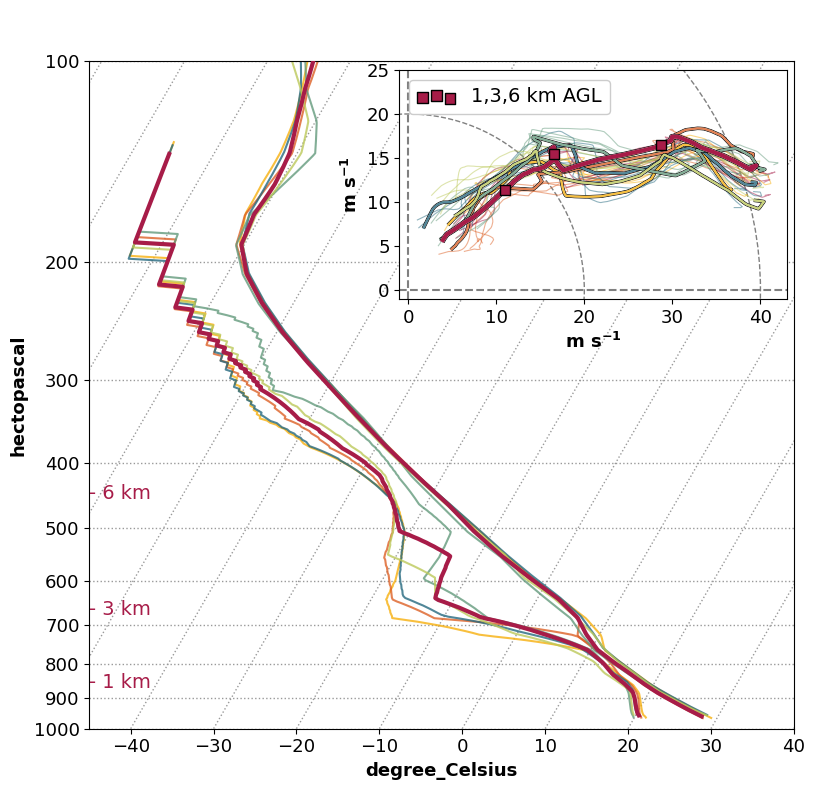

In [82]:
# set up skewT
fig=plt.figure(figsize=(20,10))

ax1 = fig.add_subplot(1,2,1)
rect = ax1.get_position().bounds
ax1.axis('off')
skew = SkewT(fig, rect=rect)

skew.ax.set_ylim(1000, 100)
skew.ax.set_xlim(-45,40)




    
colors=cmaps.pride(np.linspace(.2, .8, 6))#['C0', 'C1', 'C2', 'C3' ,'C4', 'C5']

colors = [colors[i] for i in [-3, -2, -1, 0, 1, 2, 3, 4]]



ax_hod = inset_axes(skew.ax, '55%', '60%',  bbox_to_anchor=(0, 0, 1, 1.18),
                      bbox_transform=skew.ax.transAxes)
h = Hodograph(ax_hod, component_range=80.)
h.add_grid(increment=20)
h.ax.set_xlim(-1,43)
h.ax.set_ylim(-1,25)
h.ax.set_xlabel(r'm s$\mathbf{^{-1}}$')
h.ax.set_ylabel(r'm s$\mathbf{^{-1}}$')

count = 0

for i in range(1,37):

    if (i-1) % 6 == 0: c = colors[count]; count+=1

    fname = f'/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run{i:02d}Sounding.txt'
    #print(fname)
    T, Td, p, u, v, z = get_sounding(fname)
    z12 = findnearest(z.m, 12000)

    

    if (i-1) % 6 == 0:

        skew.ax.plot(T,p,          color=c, alpha=0.8, linewidth=2-.5)
        skew.ax.plot(Td,p,         color=c, alpha=0.8, linewidth=2-.5)
        
        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=3-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=2-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=.8, linewidth=2-.5, zorder=300)
     
    h.ax.plot(u[:z12],v[:z12], color=c, alpha=0.5, linewidth=0.8)

    if i == 13:

        z1, z3, z6 = findnearest(z.m, 1000),findnearest(z.m, 3000),findnearest(z.m, 6000)
        
        skew.ax.plot(T,p,          color=c, alpha=1, linewidth=3, zorder=300)
        skew.ax.plot(Td,p,         color=c, alpha=1, linewidth=3, zorder=300)

        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=4, zorder=400)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=3, zorder=400)
        
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=1, linewidth=3, zorder=400)
        h.ax.scatter([u[z1],u[z3],u[z6]],[v[z1],v[z3],v[z6]], marker='s', zorder=401, color=c, edgecolor='k', s=60, label='1,3,6 km AGL')


        # heights
        for hi in [1000,3000,6000]:
            hz = findnearest(z.m, hi)
            height = int(hi/1000)
            pres   = p[hz]
            trans, _, _ = skew.ax.get_yaxis_text1_transform(0);
            skew.ax.text(0.0, pres, '- {} km'.format( height),
                         transform=trans, color=c, fontsize=14, va='center');

h.ax.legend(loc=2, scatterpoints=3, fontsize=14, markerscale=1)

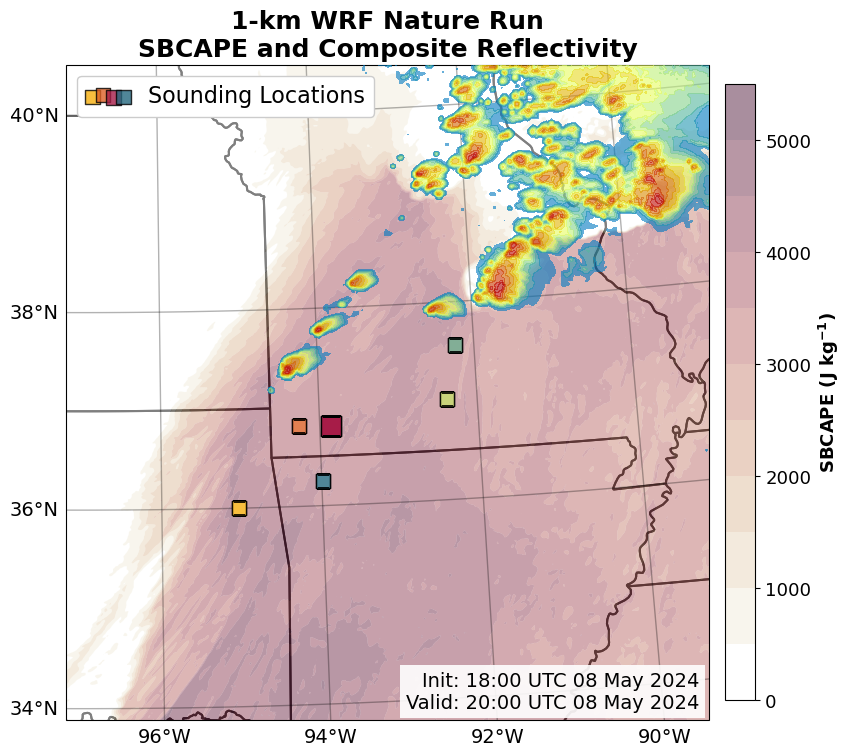

In [138]:
# Create a figure
fig = plt.figure(figsize=(10,10))
ax2 = plt.axes(projection=cart_proj)
ax2.add_feature(states_provinces, edgecolor='k', alpha=1.0, linewidth=1.5,zorder=1)#, zorder=31)
ax2.set_extent([slon.min()+1,slon.max()-1, slat.min()+.8,slat.max()-0.5], crs = crs.PlateCarree())

#quickCAPE = np.where(CAPE <500, np.nan, CAPE)
im=ax2.contourf(slon,slat, CAPE, levels=np.arange(0, 6000,500), cmap=ucmap, alpha=0.5, transform=crs.PlateCarree(), antialiased = True)
im2 = ax2.contourf(slon,slat, compref, np.arange(5, 75, 5), cmap =ctables.REF_default,transform=crs.PlateCarree(), zorder=300, alpha=1)


# Add a color bar
plt.colorbar(im,ax=ax2, shrink=.8, pad=0.02,label=r'SBCAPE (J kg$\mathbf{^{-1}}$)', extend='max')# label='Composite Reflectivity (dBZ)')

# Add the gridlines
ax2.gridlines(draw_labels=['left', 'bottom'], auto_inline=False, rotate_labels=False, color="k", linestyle="solid", alpha=0.3, linewidth=1,
            xlabel_style={'size':14},ylabel_style={'size':14}, xlocs=[-98, -96, -94, -92, -90], ylocs=[34, 36, 38, 40])


# plot sounding locations - 3rd location (2nd in indexing) is the nature run sounding location
sound_lons = [-95.04465,-94.2605,-93.85828,-93.98767,-92.235565,-92.38037]
sound_lats = [35.99853,36.808258,36.79642,36.24793,37.563087,37.015755]


for plot_count, (yi, xi) in enumerate(zip(sound_lats, sound_lons)):
    alpha=0.8;size=150-40
    if plot_count==2: alpha=1; size=240-50
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color='w', edgecolor='k', linewidth=1, s=size, marker='s', zorder=399)
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color=colors[plot_count], alpha=alpha, edgecolor='k', linewidth=1, s=size, marker='s', zorder=400, label='Sounding Locations')
    # if plot_count == 0:
    #     ax2.text(xi+.2, yi-0.21, 'Sounding Locations', weight='bold', fontsize=16,transform=crs.PlateCarree(),
    #              path_effects =[path_effects.Stroke(linewidth=3, foreground='white'),path_effects.Normal()])
  

#print(count)
fig.canvas.draw()
left, bottom, width, height = ax2.get_position().bounds


time_str = f'Init: { dt.datetime.strptime(ds.START_DATE, "%Y-%m-%d_%H:%M:%S").strftime("%H:%M UTC %d %b %Y") }\nValid: {time.strftime("%H:%M UTC %d %b %Y")}'
ax2.text(left+width-.01, bottom+.008, time_str, fontsize=14, weight='normal', ha='right', va='bottom', transform=fig.transFigure, bbox=dict(facecolor='white', alpha=0.9, edgecolor='none'))


ax2.set_title('1-km WRF Nature Run\nSBCAPE and Composite Reflectivity')#, ha='left',va='bottom', x=left, y=bottom+height+0, weight='bold', fontsize=18)


handles, labels =ax2.get_legend_handles_labels()
leg = ax2.legend([handles[0]],[ labels[0]], loc=2,scatterpoints=4, fontsize=16, markerscale=1)
leg.legend_handles[0].set_facecolors(colors)
plt.show()


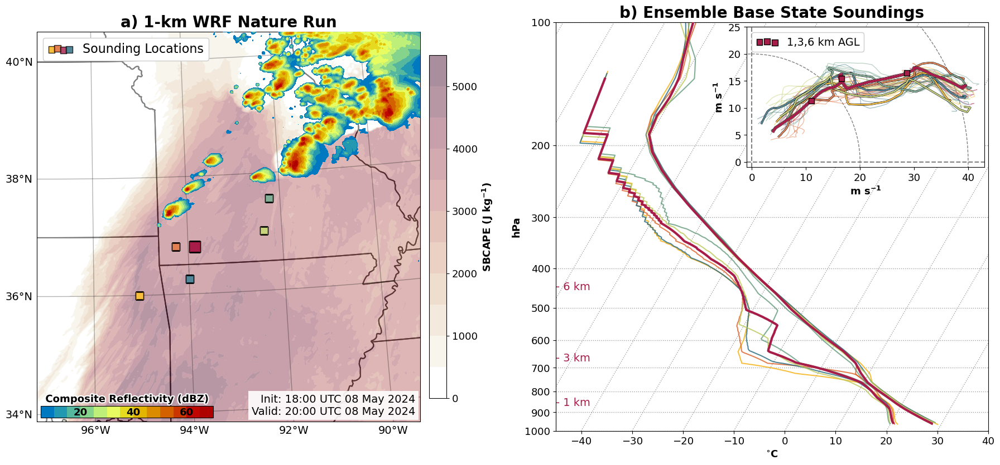

In [230]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Create the figure
fig = plt.figure(figsize=(22, 10))

# Left subplot: normal Matplotlib axes
ax2 = fig.add_subplot(1, 2, 1, projection=cart_proj)
ax1 = fig.add_subplot(1, 2, 2)


#################################################

rect = ax1.get_position().bounds
ax1.axis('off')
skew = SkewT(fig, rect=rect)

skew.ax.set_ylim(1000, 100)
skew.ax.set_xlim(-45,40)
skew.ax.set_ylabel('hPa', weight='bold')
skew.ax.set_xlabel(r'$\mathbf{^{\circ}}$C', weight='bold')
    
colors=cmaps.pride(np.linspace(.2, .8, 6))
colors = [colors[i] for i in [-3, -2, -1, 0, 1, 2, 3, 4]]

ax_hod = inset_axes(skew.ax, '55%', '60%',  bbox_to_anchor=(0, 0, 1, 1.18),
                      bbox_transform=skew.ax.transAxes)
h = Hodograph(ax_hod, component_range=80.)
h.add_grid(increment=20)
h.ax.set_xlim(-1,43)
h.ax.set_ylim(-1,25)
h.ax.set_xlabel(r'm s$\mathbf{^{-1}}$')
h.ax.set_ylabel(r'm s$\mathbf{^{-1}}$')

count = 0

for i in range(1,37):

    if (i-1) % 6 == 0: c = colors[count]; count+=1

    fname = f'/work/jessica.mcdonald/CM1_LETKF_2025/run/soundings/Run{i:02d}Sounding.txt'
    T, Td, p, u, v, z = get_sounding(fname)
    z12 = findnearest(z.m, 12000)

    if (i-1) % 6 == 0:

        skew.ax.plot(T,p,          color=c, alpha=0.8, linewidth=2-.5)
        skew.ax.plot(Td,p,         color=c, alpha=0.8, linewidth=2-.5)
        
        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=3-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=2-.5, zorder=300)
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=.8, linewidth=2-.5, zorder=300)
     
    h.ax.plot(u[:z12],v[:z12], color=c, alpha=0.5, linewidth=0.8)

    if i == 13:

        z1, z3, z6 = findnearest(z.m, 1000),findnearest(z.m, 3000),findnearest(z.m, 6000)
        
        skew.ax.plot(T,p,          color=c, alpha=1, linewidth=3, zorder=300)
        skew.ax.plot(Td,p,         color=c, alpha=1, linewidth=3, zorder=300)

        h.ax.plot(u[:z12],v[:z12], color='k', alpha=1, linewidth=4, zorder=400)
        h.ax.plot(u[:z12],v[:z12], color='w', alpha=1, linewidth=3, zorder=400)
        
        h.ax.plot(u[:z12],v[:z12], color=c, alpha=1, linewidth=3, zorder=400)
        h.ax.scatter([u[z1],u[z3],u[z6]],[v[z1],v[z3],v[z6]], marker='s', zorder=401, color=c, edgecolor='k', s=60, label='1,3,6 km AGL')


        # heights
        for hi in [1000,3000,6000]:
            hz = findnearest(z.m, hi)
            height = int(hi/1000)
            pres   = p[hz]
            trans, _, _ = skew.ax.get_yaxis_text1_transform(0);
            skew.ax.text(0.0, pres, '- {} km'.format( height),
                         transform=trans, color=c, fontsize=14, va='center');

h.ax.legend(loc=2, scatterpoints=3, fontsize=14, markerscale=1)
skew.ax.set_title('b) Ensemble Base State Soundings', fontsize=20)

#################################################


ax2.add_feature(states_provinces, edgecolor='k', alpha=1.0, linewidth=1.5,zorder=1)#, zorder=31)
ax2.set_extent([slon.min()+1,slon.max()-1, slat.min()+.8,slat.max()-0.5], crs = crs.PlateCarree())

# #quickCAPE = np.where(CAPE <500, np.nan, CAPE)
im=ax2.contourf(slon,slat, CAPE, levels=np.arange(0, 6000,500), cmap=ucmap, alpha=0.5, transform=crs.PlateCarree(), antialiased = True)
im2 = ax2.contourf(slon,slat, compref, np.arange(5, 75, 5), cmap =ctables.REF_default,transform=crs.PlateCarree(), zorder=3, alpha=1)


# Add a color bar
plt.colorbar(im,ax=ax2, shrink=.8, pad=0.02,label=r'SBCAPE (J kg$\mathbf{^{-1}}$)', extend='max')# label='Composite Reflectivity (dBZ)')

# Add the gridlines
ax2.gridlines(draw_labels=['left', 'bottom'], auto_inline=False, rotate_labels=False, color="k", linestyle="solid", alpha=0.3, linewidth=1,
            xlabel_style={'size':14},ylabel_style={'size':14}, xlocs=[-98, -96, -94, -92, -90], ylocs=[34, 36, 38, 40])


# plot sounding locations - 3rd location (2nd in indexing) is the nature run sounding location
sound_lons = [-95.04465,-94.2605,-93.85828,-93.98767,-92.235565,-92.38037]
sound_lats = [35.99853,36.808258,36.79642,36.24793,37.563087,37.015755]


for plot_count, (yi, xi) in enumerate(zip(sound_lats, sound_lons)):
    alpha=0.8;size=150-40
    if plot_count==2: alpha=1; size=240-50
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color='w', edgecolor='k', linewidth=1, s=size, marker='s', zorder=399)
    ax2.scatter(xi,yi,transform=crs.PlateCarree(), color=colors[plot_count], alpha=alpha, edgecolor='k', linewidth=1, s=size, marker='s', zorder=400, label='Sounding Locations')

plt.subplots_adjust(wspace=.06)
fig.canvas.draw()
left, bottom, width, height = ax2.get_position().bounds

time_str = f'Init: { dt.datetime.strptime(ds.START_DATE, "%Y-%m-%d_%H:%M:%S").strftime("%H:%M UTC %d %b %Y") }\nValid: {time.strftime("%H:%M UTC %d %b %Y")}'
ax2.text(left+width-.004, bottom+.008, time_str, fontsize=14, weight='normal', ha='right', va='bottom', transform=fig.transFigure, bbox=dict(facecolor='white', alpha=0.9, edgecolor='none'))

handles, labels =ax2.get_legend_handles_labels()
leg = ax2.legend([handles[0]],[ labels[0]], loc=2,scatterpoints=4, fontsize=16, markerscale=.8)
leg.legend_handles[0].set_facecolors(colors)
ax2.set_title('a) 1-km WRF Nature Run', fontsize=20)


axin2 = ax2.inset_axes([0.01, 0.01, 0.45, 0.03])
cb=plt.colorbar(im2, cax=axin2, orientation='horizontal', label= 'Composite Reflectivity (dBZ)', ticks=[ 20, 40, 60])
cax = cb.ax
#axin2.axis('off')
cax.set_xlabel('Composite Reflectivity (dBZ)', labelpad=-30, fontsize=13, path_effects =[path_effects.Stroke(linewidth=3, foreground='white'),path_effects.Normal()])
#cax.xaxis.set_ticks_position('top')
#cax.set_xticklabels([ 20, 40, 60],labelpad=-10)

cb.ax.xaxis.set_ticks_position("bottom")
cb.ax.tick_params(axis="x", direction="in", length=0,pad=-13, colors="k")
for label in cb.ax.get_xticklabels():
    label.set_fontweight("bold")


for spine in ax.spines.values():
    spine.set_zorder(500)

FIGNAME = 'BaseStateSoundings'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG_{FIGNAME}.png', dpi=300, bbox_inches='tight')


# Nature Run Plot

In [185]:
def top_colorbar(ax, c, label, ticks=[]):
    pos=ax.get_position()

    cbar_left   = pos.x0 +.008
    cbar_bottom = pos.y1 + 0.008       # slightly above the axes
    cbar_width  = (pos.x1 - pos.x0) - 0.008*2 # span full width of both
    cbar_height = 0.008  
    cax = fig.add_axes([cbar_left, cbar_bottom, cbar_width, cbar_height])
    cbar =plt.colorbar(c, ax=ax, cax=cax,orientation='horizontal')
    cbar.set_label(label, labelpad=10, fontsize=16)
    cbar.ax.xaxis.set_ticks_position("top")
    cbar.ax.xaxis.set_label_position("top")
    if len(ticks)>0:
        cbar.set_ticks(ticks)
        cbar.set_ticklabels(ticks, fontsize=16)

def plot_radar(ax, rx, ry):

    ax.scatter(rx,ry, color='k', marker='P', s=100)# label=f'Radar Location (X={rx} km, Y={ry} km)',

    for r in [20,60,100]:
        ax.add_patch(plt.Circle((rx,ry), r, fill=False, edgecolor='k', alpha=0.2))


ds = xr.open_dataset('/scratch/home/jessica.mcdonald/extra_NR_500m_may8/Full_Verification_variables.nc')
xh,yh = np.meshgrid(ds.xh, ds.yh)

myds = xr.open_dataset(f'/work/jessica.mcdonald/NR_radar_obs/5km_superobs_multi.nc')
xhr, yhr = np.meshgrid((myds.xh+160000.0)/1000,( myds.yh+115000.0)/1000)

t =109
time = 90 # minutes

ti = time-11

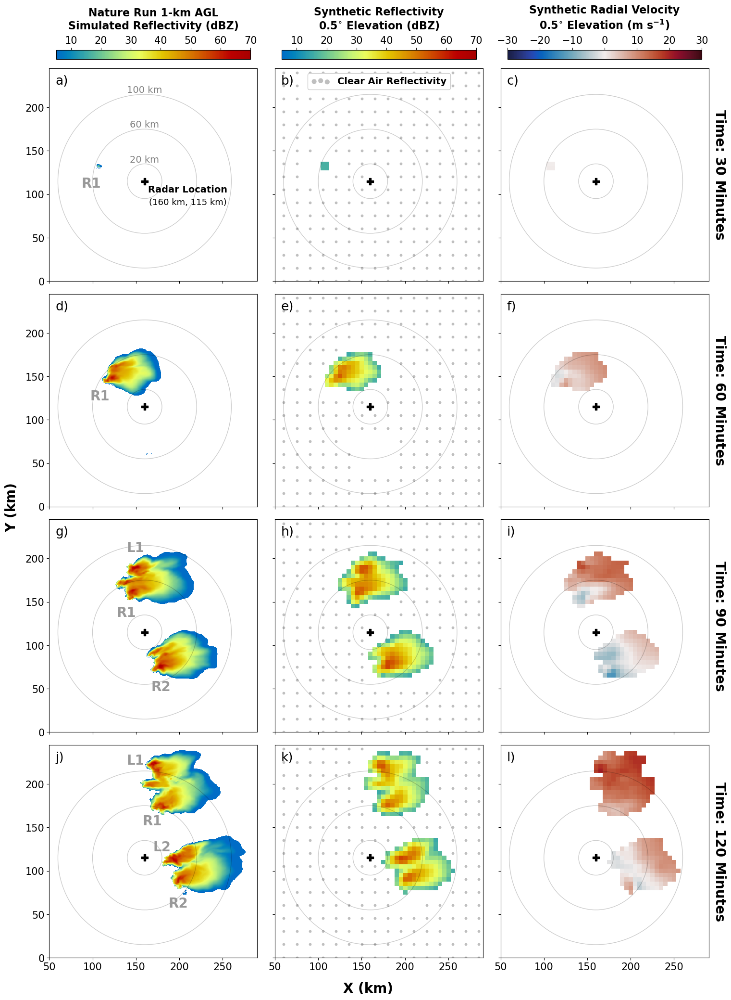

In [218]:
mpl.rcParams.update({'ytick.labelsize':15, 'xtick.labelsize':15})

fig, axes = plt.subplots(4,3, sharex=True, sharey=True, subplot_kw={'aspect':'equal'}, figsize=(18, 24))
plt.subplots_adjust(hspace = 0.06, wspace=0.03)

for i,time in enumerate([30, 60, 90, 120]):
    t = time-10
    cref = np.where(ds.dbz[t,findnearest(ds.zh, 1),:,:] == 0, np.nan, ds.dbz[t,0,:,:])

    dbz = axes[i,0].pcolormesh(xh, yh, cref, vmin=5, vmax=70, cmap=ctables.REF_default)

    ref = np.where(myds.REF[t, 0]== 0 , np.nan, myds.REF[t, 0])
    sdbz=axes[i,1].pcolormesh(xhr, yhr, ref, vmin=5, vmax=70, cmap=ctables.REF_default)
    
    ref0 = myds.REF0[t,0,:,:].values#.flatten()
    mask = (np.isnan(ref0)==False)
    rx = xhr[mask]
    ry = yhr[mask]
    s1 = axes[i,1].scatter(rx,ry,  s=10, marker='o',facecolor='0.75', label='Clear Air Reflectivity')
    
    
    svr = axes[i,2].pcolormesh(xhr, yhr, myds.VR[t, 0], vmin=-30, vmax=30, cmap=cmaps.balance)

    axes[i,2].text(1.02, 0.5, f'Time: {time} Minutes', rotation=-90, ha='left', va='center', transform=axes[i,2].transAxes, fontsize=20, weight='bold')

for ax in axes.flatten():
    plot_radar(ax, 160, 115)
    ax.set_ylim(0, 245)
    ax.set_xlim(50, 290)

axes[0,0].text(164, 111, 'Radar Location', weight='bold', va='top', fontsize=14)
axes[0,0].text(164+1 ,111-15, '(160 km, 115 km)', va='top', fontsize=13)
for r in [20, 60, 100]:
    axes[0,0].text(160, 115+r+2, f'{r} km', color='k', alpha=0.5, fontsize=14, ha='center')

axes[0,1].legend(fontsize=14, loc='upper center', markerscale=2, scatterpoints=3, prop={'weight': 'bold', 'size':14})

top_colorbar(axes[0,0], dbz, 'Nature Run 1-km AGL\nSimulated Reflectivity (dBZ)')
top_colorbar(axes[0,1], sdbz, 'Synthetic Reflectivity\n0.5'+r'$\mathbf{^{\circ}}$ Elevation (dBZ)')
top_colorbar(axes[0,2], svr, 'Synthetic Radial Velocity\n0.5'+r'$\mathbf{^{\circ}}$ Elevation (m s$\mathbf{^{-1}}$)')


fig.text(0.5, .08, 'X (km)', weight='bold', fontsize=20, ha='center');
fig.text(0.08, .5, 'Y (km)', weight='bold', fontsize=20, va='center', rotation=90);

for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=19, transform=ax.transAxes )

plt.draw()
mpl.rcParams.update({'ytick.labelsize':13, 'xtick.labelsize':13})


### row 1
axes[0,0].text(110, 120, 'R1', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )
### row 2
axes[1,0].text(120, 135, 'R1', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )

### row 3
axes[2,0].text(160, 220, 'L1', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )
axes[2,0].text(150, 145, 'R1', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )
axes[2,0].text(190, 60, 'R2', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )

### row 4
axes[3,0].text(160, 235, 'L1', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )
axes[3,0].text(180, 165, 'R1', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )
axes[3,0].text(190, 135, 'L2', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )
axes[3,0].text(210, 70, 'R2', weight='bold', color='0.6', fontsize=20, ha='right', va='top' )



# FIGNAME = 'SyntheticRadar'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG_{FIGNAME}.png', dpi=300, bbox_inches='tight')


# Nature Run Processing

In [2]:
ds = xr.open_dataset('/work/jessica.mcdonald/scratch_link/extra_NR_500m_may8/Full_Verification_variables.nc')

zi = findnearest(ds.zh,1)
ti = 140

x,y,z = ds.xh.values, ds.yh.values, ds.zh
w = ds['wa'][ti,zi,:,:].values
dbz = ds['dbz'][ti,zi,:,:].values

print(ds.dates[ti].values)


ds = xr.open_dataset('/work/jessica.mcdonald/scratch_link/extra_NR_500m_may8/Processed_VerificationVars.nc')
zi = findnearest(ds.zh,1)
#ti = 140
print(ds.dates[ti].values)

xg,yg,zg = ds.xh.values, ds.yh.values,ds.zh.values

filtered_regridded_w = ds['wa'][ti,zi,:,:].values
filtered_regridded_dbz = ds['dbz'][ti,zi,:,:].values
#filtered_regridded_UH= ds['UH2-5km'][ti,:,:].values


dx_NR = 500
dx_filter = 3000 # this is the scale that everything smaller than will be filtered out
dx = int(dx_filter/dx_NR)
response_amp = 0.02
npass=1

eps = RaymondFilters.inverseRaymondResponse(response_amp, dx, npass=npass)
print(eps)

filtered_w = RaymondFilters.RaymondFilter6F(w.T, eps, npass=npass)
filtered_dbz = RaymondFilters.RaymondFilter6F(dbz.T, eps, npass=npass)

mem = 6
ens = xr.open_dataset(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C03_H09_V4/member{mem:03d}/cm1rst_000038.nc', decode_timedelta=False) #15 19 31
ens_w = ens.wa[0, findnearest(ens.zf, 1000),:,:].values

ens_dbz = ens.dbz[0, findnearest(ens.zf, 1000),:,:].values
print(dt.datetime(2024,5,8,19,30) + dt.timedelta(minutes =int(ens.time.values[0]/60 )))

xi,yi = np.meshgrid(x, y)

finterp = scipy.interpolate.RegularGridInterpolator((ens.yh.values/1000, ens.xh.values/1000), ens_w, bounds_error=False) #give it the filtered 500 m data
temp = np.transpose(finterp((yi.flatten(),xi.flatten())).reshape((len(y), len(x)), order='F'))#, axes=[0,2,1])

dinterp = scipy.interpolate.RegularGridInterpolator((ens.yh.values/1000, ens.xh.values/1000), ens_dbz, bounds_error=False) #give it the filtered 500 m data
tempdbz = np.transpose(dinterp((yi.flatten(),xi.flatten())).reshape((len(y), len(x)), order='F'))#, axes=[0,2,1])
    

2024-05-08T22:00:00.000000000
2024-05-08T22:00:00.000000000
1323.0000000000007
NPass Loop for 2D array took 0.0286 seconds

NPass Loop for 2D array took 0.0296 seconds

2024-05-08 22:00:00


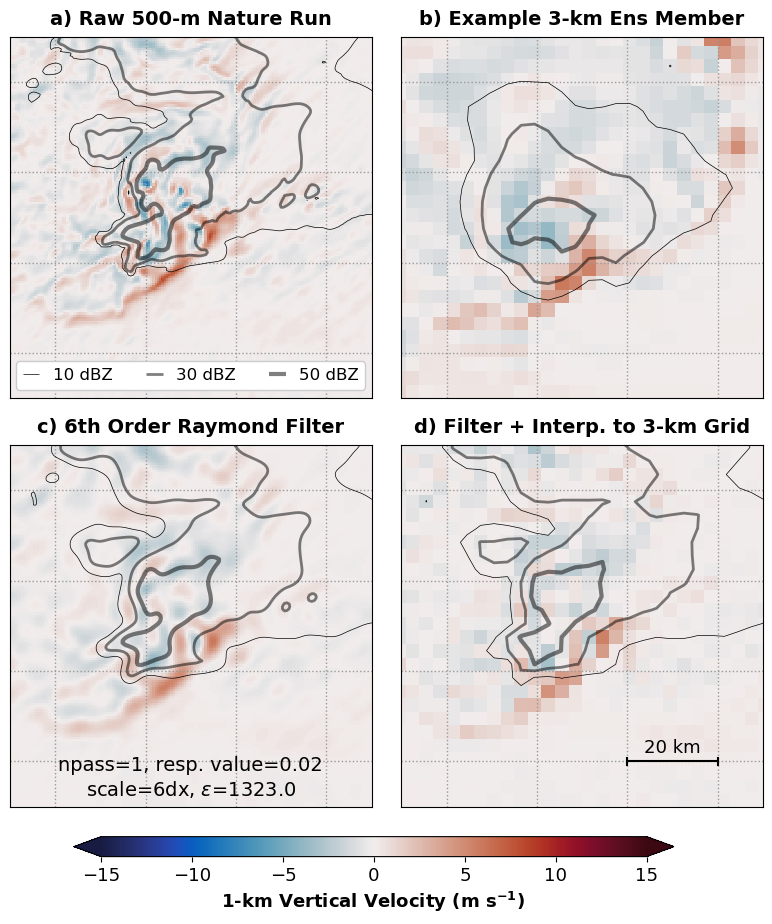

In [4]:

def plot_dbz(ax,x,y, dbz):

    ax.contour(x,y,dbz,  levels=[10], colors='k', linewidths=0.5)
    ax.contour(x,y,dbz,  levels=[30], colors='k', linewidths=2, alpha=0.5)
    ax.contour(x,y,dbz,  levels=[50], colors='k', linewidths=3, alpha=0.5)

    
fig, axes = plt.subplots(2,2, figsize=(10,10), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})

ref_levs = [10, 30, 50]

for ax, var, var2 in zip([axes[0,0], axes[1,0]], [w, filtered_w], [dbz, filtered_dbz]):

    im=ax.pcolormesh(x,y,var,  vmin=-15, vmax=15,cmap=cmaps.balance)
    plot_dbz(ax, x, y, var2)

    ax.set_xticks(np.arange(110,300,20))
    ax.set_yticks(np.arange(10,300,20))

    ax.set_xlim(200,280)
    ax.set_ylim(60,140)

axes[0,1].pcolormesh(xg,yg,ens_w,  vmin=-10, vmax=10,cmap=cmaps.balance)
plot_dbz(axes[0,1], xg,yg,ens_dbz)

axes[1,1].pcolormesh(xg,yg,filtered_regridded_w,  vmin=-15, vmax=15,cmap=cmaps.balance)
plot_dbz(axes[1,1], xg,yg,filtered_regridded_dbz)



axes[0,0].set_title(f'a) Raw 500-m Nature Run', fontsize=14, weight='bold', y=1.01)
axes[0,1].set_title(f'b) Example 3-km Ens Member', fontsize=14, weight='bold', y=1.01)
axes[1,0].set_title(f'c) 6th Order Raymond Filter', fontsize=14, weight='bold', y=1.01);
axes[1,1].set_title(f'd) Filter + Interp. to 3-km Grid', fontsize=14, weight='bold', y=1.01);


txt = r'$\epsilon$'
axes[1,0].text(0.5, 0.02, f'npass={npass}, resp. value={response_amp}\nscale={dx}dx, {txt}={eps:.1f}', fontsize=14, ha='center', va='bottom', transform=axes[1,0].transAxes)

add_scale(axes[1,1], xstart=250, xlength=20, y= 70, cap_length=2)


for ax in axes.flatten():
    ax.tick_params(axis='both',  which='both', length=0,labelbottom=False,labelleft=False)
    ax.grid()

plt.subplots_adjust(wspace=0.02, hspace=.13)   

l10 = mpl.lines.Line2D([0], [0], label='10 dBZ', color='k',  linewidth=0.5)
l30 = mpl.lines.Line2D([0], [0], label='30 dBZ', color='k',  linewidth=2, alpha=0.5)
l50 = mpl.lines.Line2D([0], [0], label='50 dBZ', color='k',  linewidth=3, alpha=0.5)
axes[0,0].legend(handles=[l10,l30,l50], labels=['10 dBZ', '30 dBZ', '50 dBZ'], ncols=3, loc='lower center', handlelength=1, fontsize=12)

#cbar_ax = fig.add_axes([0.92, 0.2, 0.015, 0.6])
cbar_ax = fig.add_axes([0.2, 0.06, .6, 0.02])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal', extend='both')
cbar.set_label(r"1-km Vertical Velocity (m s$\mathbf{{^{-1}}}$) ", weight='bold')
#plt.show()

FIGNAME = 'NatureRunFiltering'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG_{FIGNAME}.png', dpi=300, bbox_inches='tight')


# Cold Pool Plot

C03_H18_V6
C03_H18_V6_fine
C03_H09_V2
C03_H09_V2_fine


Text(340, 130, 'R2')

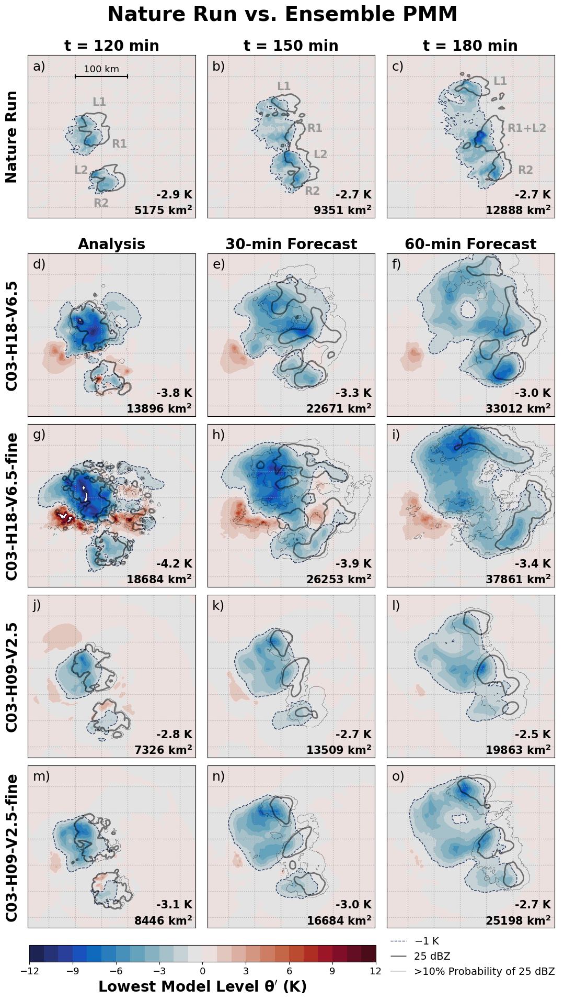

In [2]:
##############################################################################



exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]]+['C03_H09_V2']#['Control']
version = 'CI'
#version='H'

#exps = ['C03_H18_V6', 'C03_H12_V4','C03_H09_V2']
version = 'Fullx'


# exps = ['C03_H09_V2','C03_H09_V2_noAI','C03_H18_V2','C03_H18_V2_noAI']
# version='fullx'

# exps = ['C03_H09_V2_fine']+[f'C{h:02d}_H09_V2' for h in [3,1,10]]
# version = 'fullx'

exps = ['C15_H18_V6', 'C15_H18_V6_fine', 'C15_H09_V2', 'C15_H09_V2_fine']

exps = ['C03_H18_V6', 'C03_H18_V6_fine', 'C03_H09_V2', 'C03_H09_V2_fine']


##############################################################################

if len(exps)==6:
    fig, axes = plt.subplots(7,3, figsize=(12, 23), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
    
if len(exps)==5:
    fig, axes = plt.subplots(6,3, figsize=(12, 23), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
if len(exps)==4:
    fig, axes = plt.subplots(5,3, figsize=(13, 21), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})
if len(exps)==3:
    fig, axes = plt.subplots(4,3, figsize=(13, 16.5), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})#, facecolor='none')
if len(exps)==2:
    fig, axes = plt.subplots(3,3, figsize=(13, 13), sharex=True, sharey=True, subplot_kw={'aspect':'equal'})


# get info for nature run
with open(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exps[0]}/letkf.exp', 'rb') as f: exper = json.load(f)
start = dt.datetime.strptime(exper['date_time'], '%Y-%m-%d %H:%M:%S')
fcst_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_end_time'], '%Y-%m-%d %H:%M:%S')

fcst_lens = [0,30,60]

times = [fcst_start + dt.timedelta(minutes=tt) for tt in fcst_lens]

# read in nature run 

NR = xr.open_dataset(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc', decode_timedelta=True)
NRdates = [pd.to_datetime(NRt) for NRt in NR.dates.values]

for ni, exp in enumerate(exps):
    print(exp)

    
    #fpath = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/FORECAST*/full_ens_fcst.nc")[0]
    fpath = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/full_ens_fcst.nc")[0]
    cm1 = xr.open_dataset(fpath, decode_timedelta=True)
    
    cm1t = [pd.Timestamp(t) for t in cm1.time.values]
    xh, yh, z, ensN = cm1.xh.values, cm1.yh.values, cm1.z.values, int(cm1.ne.max()) 
    dx = np.mean(xh[1:]-xh[:-1])

    
    # name of experiment
    axes[ni+1, 0].set_ylabel(rename(exp, version=version), fontsize=20)

    for ti,time in enumerate(times):
        
        cti = findnearest(cm1t, time)
        ens_pmm = pmm(cm1, 'th', 0, cti)
        thp = (ens_pmm - ens_pmm[:,-1].mean())
    
        axes[ ni+1, ti].contourf(xh, yh, thp,  cmap=cmaps.balance, levels=np.arange(-12, 12.1, 1))
        tim = axes[ ni+1, ti].contour(xh, yh, thp, colors='#25395e',linestyles='--', levels=[-1], linewidths=1)


        #now add probability of prcip
        probs = raw_probs(cm1['dbz'][cti, :-1,0].values, 25, ensN)
        pim = axes[ ni+1, ti].contour(xh, yh, probs*100,  colors='k',linewidths=0.25, levels=[10])

        dbz_pmm = pmm(cm1, 'dbz', 0, cti)
        dim = axes[ ni+1 ,ti].contour(xh, yh, dbz_pmm, colors='k', levels=[25], linewidths=2, alpha=0.5)

        # cold pool stats
        mean_temp = np.mean(thp[thp <= -1])
        cp_size = np.count_nonzero(thp <= -1)*(dx*dx)

        axes[ ni+1, ti].text(0.98, 0.02, f"{cp_size:.0f} km"+r'$\mathbf{^2}$', ha='right',fontsize=15, weight='bold', transform=axes[ ni+1, ti].transAxes)
        axes[ ni+1, ti].text(0.98, 0.12, f"{mean_temp:.1f} K", ha='right',fontsize=15, weight='bold', transform=axes[ ni+1, ti].transAxes)


        #axes[ ni+1, ti].text(0.98, 0.98, f"{tname[ti]}", ha='right', va='top',fontsize=15, weight='bold', transform=axes[ ni+1, ti].transAxes)

        
        fcst_len = int((time - fcst_start).seconds/60)
        if ni == 0:
            axes[ni+1, ti].set_title(f'{fcst_len}-min Forecast', weight='bold', fontsize=20)
        axes[1, 0].set_title(f'Analysis', weight='bold', fontsize=20)
            
        cm1.close()

for ti,time in enumerate(times):

    thp = NR.th[findnearest(NRdates, time),0].values -  NR.th[findnearest(NRdates, time),0,:,-1].values.mean(axis=0)

    xh, yh = NR.xh, NR.yh
    
    im=axes[0, ti].contourf(xh, yh, thp,  cmap=cmaps.balance, levels=np.arange(-12, 12.1, 1))
    axes[0, ti].contour(xh, yh, thp, colors='#25395e',linestyles='--', levels=[ -1], linewidths=1)
   
    mean_temp = np.mean(thp[thp <= -1])
    cp_size = np.count_nonzero(thp <= -1)*(3*3)#(.5*.5)
    
    axes[0, ti].text(0.98, 0.12, f"{mean_temp:.1f} K", ha='right',fontsize=15, weight='bold', transform=axes[ 0, ti].transAxes)
    axes[0, ti].text(0.98, 0.02,f"{cp_size:.0f} km"+r'$\mathbf{^2}$', ha='right',fontsize=15, weight='bold', transform=axes[ 0, ti].transAxes)
   
    NR.close()

    ptime = int((pd.to_datetime(time) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60)

    for ax in [axes[0, ti]]:
        ax.contour(xh, yh, NR.dbz[findnearest(NRdates, time),0], colors='k', levels=[25], linewidths=2, alpha=0.5)
        ax.set_title(f't = {ptime} min', weight='bold', fontsize=20)
        
    
axes[0,0].set_ylabel('Nature Run', fontsize=20)


for ax in axes.flatten():
    ax.set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(left=False, bottom=False)

# add in length scale
add_scale(axes[0,0], xstart=150, xlength=100, y=300)

if len(exps) == 6:
    cbar_box = [0.127, 0.073, 0.51, 0.02]
    wspace, hspace = 0.07, 0.01
    legend_bbox = (.78, 0.05)
    title_y=0.94

if len(exps) == 5:
    cbar_box = [0.127, 0.081, 0.51, 0.02]
    wspace, hspace = 0.07, 0.03
    legend_bbox = (.79, 0.06)
    title_y=0.94

if len(exps) == 4:
    cbar_box = [0.127, 0.08, 0.51, 0.015]
    wspace, hspace = 0.07, 0.04
    legend_bbox = (.78, 0.058)
    title_y= 0.93

if (len(exps) == 3) |( (len(exps)==2)):
    cbar_box = [0.127, 0.073, 0.51, 0.02]
    wspace, hspace = 0.09, 0.04
    legend_bbox = (.78, 0.042)
    title_y=0.94

if (len(exps)==2):
    legend_bbox = (.78, 0.039)
    title_y=0.94

cbar_ax = fig.add_axes(cbar_box)
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.set_label(r'Lowest Model Level $\mathbf{\theta^{\prime}}$ (K)', weight='bold', fontsize=20)

h0, _ = tim.legend_elements()
h1, _ = dim.legend_elements()
h2, _ = pim.legend_elements()

fig.legend(h0+h1+h2, [r'${-}$1 K', '25 dBZ', '>10% Probability of 25 dBZ'], fontsize=14, loc='lower center', 
           bbox_to_anchor = legend_bbox, handlelength=1.5, frameon=False) #bbox_to_anchor = (.78, 0.058)

# set limits and adjust plot

axes[0,0].set_xlim(60, 380)
axes[0,0].set_ylim(30, 340)


plt.subplots_adjust(hspace=hspace, wspace=wspace)

for ax in axes[0,:]:
    pos = ax.get_position()
    pos.y0 = pos.y0 +.025
    pos.y1 = pos.y1 +.025
    ax.set_position(pos)
fig.canvas.draw()

title_y = .95

fig.suptitle('Nature Run vs. Ensemble PMM', y=title_y, fontsize=28, weight='bold');

for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=18, transform=ax.transAxes )


axes[0,0].text(210, 260, 'L1', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,0].text(250, 180, 'R1', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,0].text(175, 130, 'L2', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,0].text(215, 68,  'R2', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )

axes[0,1].text(220, 290, 'L1', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,1].text(280, 210, 'R1', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,1].text(290, 160, 'L2', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,1].text(275, 90,  'R2', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )


axes[0,2].text(290, 300, 'L1', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,2].text(365, 210, 'R1+L2', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )
axes[0,2].text(340, 130,  'R2', weight='bold', color='0.6', fontsize=15, ha='right', va='top' )


# FIGNAME = 'ColdPools'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')



# UH Probability Swaths

In [2]:
import numpy as np
from numba import njit, prange

def get_1d_gaussian_kernel(sigma, truncate=4.0):
    """Generates a 1D Gaussian kernel matching Scipy's default truncation."""
    if sigma <= 0:
        return np.array([1.0])
    radius = int(truncate * sigma + 0.5)
    x = np.arange(-radius, radius + 1)
    kernel = np.exp(-0.5 * (x / sigma) ** 2)
    kernel /= np.sum(kernel) # Normalize
    return kernel

@njit(parallel=True, fastmath=True)
def fast_4d_gaussian_filter(data, kernel):
    """
    Applies a separable 2D Gaussian filter to a 4D array (time, member, y, x).
    Parallelized across the time dimension.
    """
    nt, nmem, ny, nx = data.shape
    radius = len(kernel) // 2
    
    # Pre-allocate temporary and output arrays
    temp = np.empty_like(data)
    out = np.empty_like(data)
    
    # --- Pass 1: X-direction (Horizontal smoothing) ---
    for t in prange(nt):
        for m in range(nmem):
            for y in range(ny):
                for x in range(nx):
                    val = 0.0
                    for k in range(-radius, radius + 1):
                        ix = x + k
                        
                        # Boundary handling: 'reflect' (mirror)
                        if ix < 0:
                            ix = -ix
                        elif ix >= nx:
                            ix = 2 * nx - 2 - ix
                            
                        val += data[t, m, y, ix] * kernel[k + radius]
                    temp[t, m, y, x] = val
                    
    # --- Pass 2: Y-direction (Vertical smoothing) ---
    for t in prange(nt):
        for m in range(nmem):
            for y in range(ny):
                for x in range(nx):
                    val = 0.0
                    for k in range(-radius, radius + 1):
                        iy = y + k
                        
                        # Boundary handling: 'reflect' (mirror)
                        if iy < 0:
                            iy = -iy
                        elif iy >= ny:
                            iy = 2 * ny - 2 - iy
                            
                        val += temp[t, m, iy, x] * kernel[k + radius]
                    out[t, m, y, x] = val
                    
    return out

# import numpy as np
# from numba import njit, prange

@njit(parallel=True, fastmath=True)
def fast_4d_max_filter_3x3(data):
    """
    Applies a 3x3 maximum filter (grey dilation) to the spatial dimensions (y, x)
    of a 4D array (time, member, y, x). Parallelized across the time dimension.
    """
    nt, nmem, ny, nx = data.shape
    out = np.empty_like(data)
    
    # --- Loop over time (parallelized) and members ---
    for t in prange(nt):
        for m in range(nmem):
            
            # --- Loop over spatial grid ---
            for y in range(ny):
                for x in range(nx):
                    
                    # Initialize the max value with the center pixel
                    max_val = data[t, m, y, x]
                    
                    # Search the 3x3 box (dy and dx range from -1 to 1)
                    for dy in range(-1, 2):
                        for dx in range(-1, 2):
                            
                            # Skip the center pixel since we already initialized with it
                            if dy == 0 and dx == 0:
                                continue
                                
                            iy = y + dy
                            ix = x + dx
                            
                            # Boundary handling: 'reflect' (mirror) to match Scipy defaults
                            if iy < 0:
                                iy = -iy
                            elif iy >= ny:
                                iy = 2 * ny - 2 - iy
                                
                            if ix < 0:
                                ix = -ix
                            elif ix >= nx:
                                ix = 2 * nx - 2 - ix
                                
                            # Update max_val if a larger value is found
                            val = data[t, m, iy, ix]
                            if val > max_val:
                                max_val = val
                                
                    # Assign the absolute local maximum to the output array
                    out[t, m, y, x] = max_val
                    
    return out


@njit(parallel=True, fastmath=True)
def fast_swath_probability(data, threshold, divisor):
    """
    Calculates the ensemble probability of exceeding a threshold at any point in time.
    data shape: (time, member, y, x)
    """
    nt, nmem, ny, nx = data.shape
    
    # Pre-allocate just the final 2D output array (y, x)
    out = np.empty((ny, nx), dtype=np.float32)
    
    # Parallelize across the Y-axis
    for y in prange(ny):
        for x in range(nx):
            exceed_count = 0
            
            for m in range(nmem):
                # Check if this member exceeded the threshold at ANY time
                for t in range(nt):
                    if data[t, m, y, x] >= threshold:
                        exceed_count += 1
                        break  # Short-circuit! Move immediately to the next member
                        
            # Calculate the final percentage for this grid point
            out[y, x] = 100.0 * exceed_count / divisor
            
    return out

100 156
0 C15_H18_V4
1 C10_H18_V4
2 C03_H18_V4
3 C03_H09_V2


Text(200, 90, 'R2')

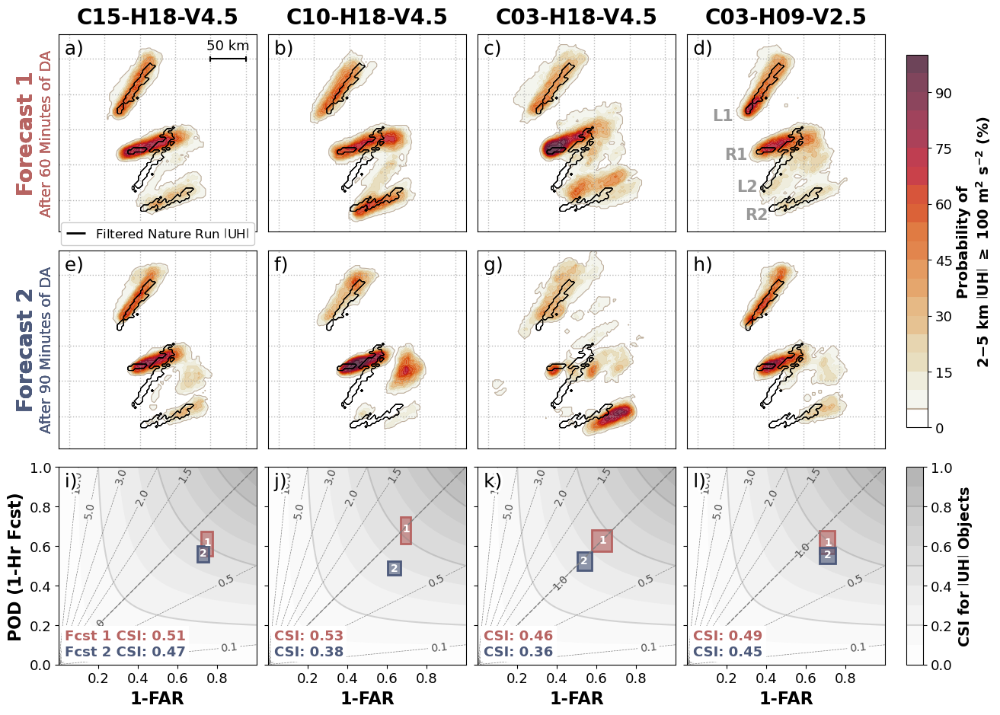

In [4]:

exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]]+['C03_H09_V2']
version = 'CI'


version='FULL'

#exps=['C03_H09_V2']

if len(exps) == 9:
    fig, axes = plt.subplots(3, len(exps), figsize=(30, 9), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.01

# if len(exps) == 7:
#     fig, axes = plt.subplots(3, len(exps), figsize=(26, 15), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
#     cbar_width = 0.01


if len(exps) == 6:
    fig, axes = plt.subplots(3, len(exps), figsize=(23, 12), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.02

if len(exps) == 5:
    fig, axes = plt.subplots(3, len(exps), figsize=(20, 12), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.015
    plt.subplots_adjust(hspace=0.01, wspace=0.04)
    

if len(exps) == 4:
    fig, axes = plt.subplots(3, len(exps), figsize=(14, 11), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})
    cbar_width = 0.02

if len(exps) == 3:
    cbar_width = 0.02
    fig, axes = plt.subplots(3, len(exps), figsize=(12, 12), sharex='row', sharey='row', subplot_kw={'aspect':'equal'})#, facecolor='none')



fcsts = ['FORECAST_20240508_2100', '']
ftime = [60,90]
axes[len(fcsts),0].set_xlim(0,1)
axes[len(fcsts),0].set_ylim(0,1)


NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
times_NR = [pd.to_datetime(t) for t in NR.dates.values[50:]] # don't need to read in the start 
NR_UH = abs(NR['UH_2-5km'][50:].values) # don't need to read in the start 
xh, yh = NR.xh.values, NR.yh.values
NR.close()



ens_threshold=100
NR_threshold = ens2nr['UH_2-5km'][ens_threshold]
print(ens_threshold, NR_threshold)

# make colormap
cmap_b = cmaps.sunburst_r.cut(.2, 'right')
clist = [to_rgb('#ffffff')]
clist.extend(cmap_b(np.linspace(0,1,49)))
cmap1 = LinearSegmentedColormap.from_list("CR", clist, 30)

colors = cmaps.lipari(np.linspace(.24,  0.545, len(fcsts)))[::-1]

tlab=['Forecast 1', 'Forecast 2']

for i,exp in enumerate(exps):
    print(i, exp)

    axes[0, i].set_title(rename(exp, version=version.upper()), y=1.02, weight='bold', fontsize=20)

    path = f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/"


    for row, fcst in zip(range(3), fcsts):

        ### read in experiment files and get metadata
        #try:
     
        exper, fcst_start = open_exp(os.path.join(path, fcst), fcst_start=True)
        fcst_start_lock = dt.datetime(2024,5,8,21,30)
        da_start = dt.datetime.strptime(exper['DA_PARAMS']['DA_start_time'],'%Y-%m-%d %H:%M:%S')
        flen = 1 + int(60*60/exper['forecast_freq'])


        ######## now plot swaths - ensemble ########################
        
        cm1 = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/full_ens_fcst.nc", decode_timedelta=True)
  
        uh = abs(cm1['UH_2-5km'][-13:,:-1].values)
        max_3x3 = fast_4d_max_filter_3x3(uh)
        kernel_1d = get_1d_gaussian_kernel(2.0, truncate=4.0) #! i kinda messed up here, I think sigma should be 2 to match old code but I'm not certain
                                                              #! old code used sigma = 0.5 and radius of [0,0,2,2] with scipy.gaussian filter 
        smooth= fast_4d_gaussian_filter(max_3x3, kernel_1d)
        probs = fast_swath_probability(smooth, ens_threshold, 36)
        
        cm1.close()

        im1=axes[row, i].contourf(xh, yh, probs,  cmap=cmap1, levels=np.arange(0, 105, 5), alpha=0.8)
        axes[row, i].contour(xh, yh, probs,  colors='#bdad9b', levels=[5], linewidths=0.8)

        y_center = 0.5    # Center of the Y-axis in normalized coordinates
        x_pos = -0.1   # Horizontal position far left of the axes (normalized)
        
        # Line 1: "Forecast 1" (Larger, Bold)
        axes[row, 0].text(x_pos- 0.06, y_center , tlab[row],                             transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=20,fontweight='bold', color=colors[row])
        axes[row, 0].text(x_pos+ 0.04, y_center , f'After {60+ row*(30)} Minutes of DA', transform=axes[row, 0].transAxes, rotation=90,ha='center',va='center',fontsize=14, color=colors[row])


        ######## now plot swaths - nature run ######################
        
        NR_ti = findnearest(times_NR, fcst_start_lock)
        NR_tf = findnearest(times_NR, dt.datetime(2024,5,8,22,30))+1
        NR_swath = np.clip(np.where(NR_UH[NR_ti:NR_tf] >= NR_threshold, 1, 0).sum(axis=0), 0, 1)
        for ax in axes[row, :]:
            imnr=ax.contour(xh, yh, NR_swath, levels=[0.5], colors='k', linewidths=0.75)

        ######## wild card - now add performance diagram ###########

        perf = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/performance_UH_{ens_threshold}.nc", decode_timedelta=True)  

        val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=fcst)

        # y0 = ci_dct['POD'][0]
        # height = ci_dct['POD'][1] - ci_dct['POD'][0]
        
        # x0 = ci_dct['SR'][0]
        # width = ci_dct['SR'][1] - ci_dct['SR'][0]
        
        y0, y1 = ci_dct['POD'][0],ci_dct['POD'][1]
        x0, x1 = ci_dct['SR'][0] ,ci_dct['SR'][1]
        corners = [(x0, y0), (x1, y0), (x1, y1), (x0, y1)]
        rect = patches.Polygon(corners, facecolor=np.concatenate((colors[row][0:-1], np.array([0.6]))),edgecolor=np.concatenate((colors[row][0:-1], np.array([1]))), linewidth=2)
        axes[len(fcsts), i].add_patch(rect)

        axes[len(fcsts), i].text(val_dct['SR'][0], val_dct['POD'][0], str(row+1), color='w', ha='center', va='center', weight='bold', zorder=101)

        add=''
        if (i == 0) & (fcst != '') : add = 'Fcst 1 '
        if (i == 0) & (fcst == '') : add = 'Fcst 2 '

        bbox = dict(facecolor='white', alpha=1.0, edgecolor='none', pad=3)

        if fcst != '':
            axes[len(fcsts), i].text(0.03, 0.16+.02, f"{add}CSI: {val_dct['CSI'][0]:.2f}", color=colors[row], ha='left', va='top', weight='bold', zorder=101, fontsize=13,bbox=bbox )
        else:
            axes[len(fcsts), i].text(0.03, 0.08+.02, f"{add}CSI: {val_dct['CSI'][0]:.2f}", color=colors[row], ha='left', va='top', weight='bold', zorder=101, fontsize=13,bbox=bbox )

        # except:
        #     print('not done')


####### performance diagram stuff

for ax in axes[len(fcsts), :]:
    im = performance_diagram(ax, axis_labels=False)
    ax.set_xticks([.2, .4, .6, .8])
    ax.set_xlabel('1-FAR', fontsize=16)

    # if version == 'CI':

    #     val_dct, ci_dct = generate_CI_contigency('Control','UH', fcsts=fcst)
    #     ax.errorbar(val_dct['SR'], val_dct['POD'], xerr=ci_dct['SR'], yerr=ci_dct['POD'], color='gray',elinewidth=3,capsize=0, alpha=0.4)#lw=3, alpha=0.5 )
    #     ax.scatter(val_dct['SR'], val_dct['POD'], color='0.7', edgecolor='k', s=200, zorder=100, alpha=1, label='No DA')
    #     perf.close()

#axes[len(fcsts),0].legend(fontsize=13, markerscale = 0.8, loc='lower left')
axes[len(fcsts), 0].set_ylabel('POD (1-Hr Fcst)', fontsize=16)

#### probability stuff

for ax in axes[:len(fcsts), :].flatten():
    ax.set_yticks(np.arange(50, 400, 50))
    ax.set_xticks(np.arange(50, 400, 50))
    ax.grid(ls=':', alpha=0.7)
    ax.xaxis.set_major_formatter(ticker.NullFormatter())
    ax.yaxis.set_major_formatter(ticker.NullFormatter())
    ax.tick_params(axis='both', length=0) 

    buf = 15
    ax.set_xlim(70+buf, 380-buf)
    ax.set_ylim(40+buf, 350-buf)


if len(exps) == 3: plt.subplots_adjust(hspace=0.06, wspace=0.04)
if len(exps) == 4: plt.subplots_adjust(hspace=0.02, wspace=0.06)
if len(exps) == 5: plt.subplots_adjust(hspace=0.015, wspace=0.04)
if len(exps) == 7: plt.subplots_adjust(hspace=0.02, wspace=0.06)

# need to do this after subplot adjustments 
# UH colorbar
bbox1 = axes[0, len(exps)-1].get_position()  
bbox2 = axes[len(fcsts)-1, len(exps)-1].get_position()  
height = bbox1.y1 - bbox2.y0
cbar_ax1 = fig.add_axes([bbox1.x1+cbar_width, bbox2.y0+height*.05, cbar_width, height*.9])

cbar1 = fig.colorbar(im1, cax=cbar_ax1)
ge = r"$\mathbf{\geq}$"
cbar1.set_label('Probability of\n'+r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'+f' {ge} {ens_threshold} '+ r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$ (%)', weight='bold', fontsize=14)
cbar1.ax.axhline(5,color='#bdad9b' )

# performance diagram colorbar
bbox = axes[len(fcsts), len(exps)-1].get_position()    
cbar_ax = fig.add_axes([bbox.x1+cbar_width,bbox.y0, cbar_width*.8, bbox.y1-bbox.y0])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label(r'CSI for $\mathbf{\left| {UH} \right|}$ Objects', weight='bold', fontsize=14)
[cbar.ax.axhline(l, color='0.5', alpha=0.3)  for l in [0.2, 0.5, 0.8]];

add_scale(axes[0,0], xstart=300,y=300, text_bump=5)


for i,ax in enumerate(axes.flatten()):
    ax.text(0.03, 0.97,  chr(ord('`')+i+1)+')', va='top', fontsize=18, transform=ax.transAxes, path_effects=[path_effects.Stroke(linewidth=5, foreground='white'),
                           path_effects.Normal()], zorder=500)

h, _ = imnr.legend_elements()
l = [r'Filtered Nature Run $\left| \mathrm{UH} \right|$']
leg=axes[0,0].legend(h, l, loc='lower center', fontsize=12, handlelength=1.5, bbox_to_anchor=(0.5,-0.1))
for line in leg.get_lines():
    line.set_linewidth(2.0)

axes[0,-1].text(160-10, 230, 'L1', weight='bold', color='0.6', fontsize=15, ha='right', va='top')
axes[0,-1].text(180-10, 175, 'R1', weight='bold', color='0.6', fontsize=15, ha='right', va='top')
axes[0,-1].text(185, 130,    'L2', weight='bold', color='0.6', fontsize=15, ha='right', va='top')
axes[0,-1].text(200, 90,     'R2', weight='bold', color='0.6', fontsize=15, ha='right', va='top')


# FIGNAME = 'ProbSwaths'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C15_H18_V6,C15_H15_V6,C15_H12_V6,C15_H09_V6,C15_H07_V6,C15_H18_V4,C15_H15_V4,C15_H12_V4,C15_H09_V4,C15_H07_V4,C15_H18_V2,C15_H15_V2,C15_H12_V2,C15_H09_V2,C15_H07_V2,C03_H18_V6,C03_H15_V6,C03_H12_V6,C03_H09_V6,C03_H07_V6,C03_H18_V4,C03_H15_V4,C03_H12_V4,C03_H09_V4,C03_H07_V4,C03_H18_V2,C03_H15_V2,C03_H12_V2,C03_H09_V2,C03_H07_V2,

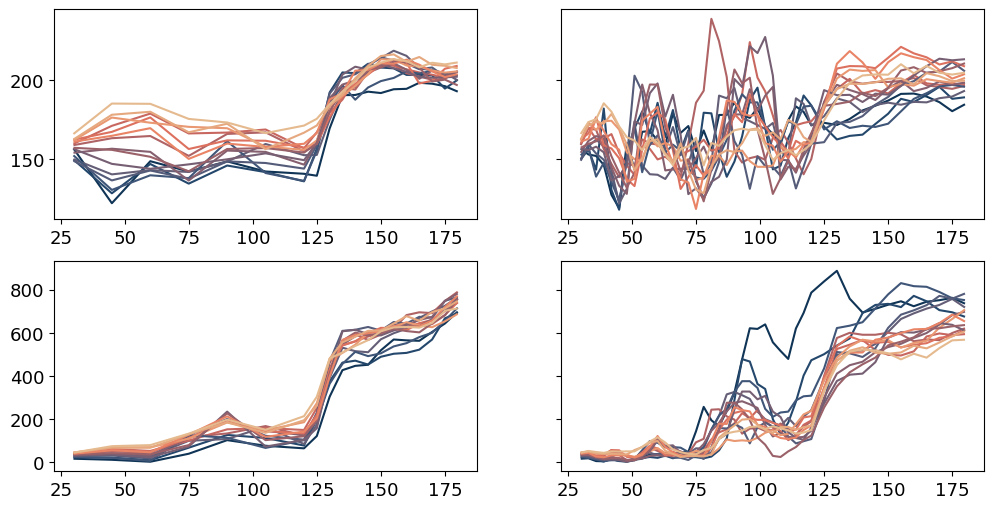

In [81]:
def plot_distribution(ax, var, **kwargs):
    hist, bins = np.histogram(var, bins=50)
    bins = (bins[1:]+bins[:-1])/2.0
    ax.semilogy(bins, hist ,**kwargs)

colors = cmaps.lipari(np.linspace(0.1,.85,15))#[::-1]
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822][::-1]


fig, axes = plt.subplots(2,2, figsize=(12, 6), sharey='row')
#ax1 = ax.twinx()

exps = [f'C03_H{h:02d}_V6' for h in [18,15,12,9,7]]+[f'C03_H{h:02d}_V4' for h in [18,15,12,9,7]]+[f'C03_H{h:02d}_V2' for h in [18,15,12,9,7]]
exps1 = [f'C15_H{h:02d}_V6' for h in [18,15,12,9,7]]+[f'C15_H{h:02d}_V4' for h in [18,15,12,9,7]]+[f'C15_H{h:02d}_V2' for h in [18,15,12,9,7]]


hloc = [18, 15, 12, 9, 7]#[0:1]
vloc = [6,4,2]#[0:1]

freq=[15, 3]
           


for ci,c in enumerate(freq):
    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):
            exp =  f"C{c:02d}_H{h:02d}_V{v}"
            print(exp, end=',')
   

            #ax.set_title(rename(exp, version=version.upper()), y=.98, weight='bold', fontsize=14)
            fcst = ''
            fpath = os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)
        
            files = [fpath+'full_ens_analysis.nc', fpath+'full_ens_fcst.nc']
        
        
           # path = f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/"
            
        
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])
            color_i = colors[findnearest(vols, (4/3)*np.pi*vr*hr*hr)]
            position = findnearest(vols, (4/3)*np.pi*vr*hr*hr)
        
        
            ######## now plot swaths - ensemble ########################
            #fcst = ''
            #cm1 = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/full_ens_fcst.nc", decode_timedelta=True)
            #cm1 = xr.open_dataset(f"{os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)}/full_ens_analysis.nc", decode_timedelta=True)
        
            cm1 = xr.open_mfdataset( files, preprocess=swap_time_dim,  combine="by_coords")#, preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))
         
        
            start = dt.datetime(2024,5,8,19,30)
            cm1t = [(pd.Timestamp(t)-start).seconds/60 for t in cm1.time.values]
        
            #uh = abs(cm1['UH_2-5km'][-13:,:-1].values)
            uh = abs(cm1['UH_2-5km'][:,:-1].values)
            #pval = np.percentile(uh.flatten(), 99.75)
            # mask = (uh > 100)
            # data = uh[mask].flatten()
            # size = len(data)
        
            # print(i, exp, pval)
        
            #uh_ts = np.percentile(uh, 99.75, axis=(1,2,3)) #np.nanmean(uh, axis=(1,2,3))
            mask = (uh < 100)
            uh[mask] = np.nan
            uh_ts = np.nanmean(uh, axis=(1,2,3))
        
            axes[0,ci].plot(cm1t, uh_ts, color=color_i) 
            axes[1,ci].plot(cm1t, np.sum(~mask, axis=(1,2,3)), color=color_i)

    #plot_distribution(ax, uh, label=rename(exp, version=version), color=color_i, lw=2, alpha=0.8)


    # 

    
    # ax1.scatter(position, size, marker = 'o', color='k', edgecolor='r', s=100)

    #ax.text(position, 1200, size)


    
    # bp1 = ax.boxplot(data, positions = [position], patch_artist=True)#, showfliers=False)

    # for item in ['boxes', 'whiskers', 'medians', 'caps']:
    #     plt.setp(bp1[item], color='k')
     
    # # for b,(box,fly) in enumerate(zip(bp1['boxes'],bp1['fliers'])):
    # #     box.set(facecolor=color_i)
    # #     fly.set_markeredgecolor(color_i)
    # for b,box in enumerate(bp1['boxes']):
    #     box.set(facecolor=color_i)
  

In [93]:

def swap_time_dim(ds):
    """
    Preprocess function to swap the arbitrary 't' dimension 
    for the actual 'time' timestamps before combining.
    """
    # Swap the dimension 't' for 'time'
    ds = ds.swap_dims({'t': 'time'})
    
    # Optional: If you want to completely get rid of the old 't' index
    # ds = ds.drop_vars('t')
    
    return ds

vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]
hloc = [18,15,12,9,7]
vloc = [6, 4, 2]


df15 = pd.DataFrame()
df03 = pd.DataFrame()

for freq in [15, 3]:

    volume = []
    uhmean   = []
    uhcount  = []
    time     = []

    
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

            
            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            print(exp, end=',')
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            fpath = os.path.join('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/',exp, fcst)
            files = [fpath+'full_ens_analysis.nc', fpath+'full_ens_fcst.nc']
        
         
            cm1 = xr.open_mfdataset( files, preprocess=swap_time_dim,  combine="by_coords")#, preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))
            start = dt.datetime(2024,5,8,19,30)
            cm1t = [(pd.Timestamp(t)-start).seconds/60 for t in cm1.time.values]


            uh = abs(cm1['UH_2-5km'][:,:-1].values)
            mask = (uh < 100)
            uh[mask] = np.nan
            uh_ts = np.nanmean(uh, axis=(1,2,3))
            count = np.sum(~mask, axis=(1,2,3))

            volume.extend([int(np.round((4/3)*np.pi*vr*hr*hr,0))]*len(cm1t))
            uhmean.extend(uh_ts)
            uhcount.extend(count)
            time.extend(cm1t)

            cm1.close()
         
        
   # df = pd.DataFrame( data = {'p': wtg.divc.values[:stop].mean(axis=1)/100}, index = [dt.timedelta(minutes =t) for t in wtg.time.values[:stop]])
    #res = df.resample(dt.timedelta(seconds=int(exp.split('_')[0][1:])*60), label='right', closed='right').mean()

        #plt.scatter(np.mean(ds.inflation.values), np.mean(wtg.divc.values[:stop])/100, color=colors[ei])
    
            # wtg.close()
            # ds.close()
    if freq == 15:
        df15[f'vols'] = volume
        df15[f'uhmean'] = uhmean
        df15[f'count'] = uhcount
        df15[f'time'] = time

    if freq == 3:
        df03[f'vols'] = volume
        df03[f'uhmean'] = uhmean
        df03[f'count'] = uhcount
        df03[f'time'] = time



The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.C15_H18_V6,
C15_H18_V4,C15_H18_V2,C15_H15_V6,C15_H15_V4,C15_H15_V2,C15_H12_V6,C15_H12_V4,C15_H12_V2,C15_H09_V6,C15_H09_V4,C15_H09_V2,C15_H07_V6,C15_H07_V4,C15_H07_V2,C03_H18_V6,C03_H18_V4,C03_H18_V2,C03_H15_V6,C03_H15_V4,C03_H15_V2,C03_H12_V6,C03_H12_V4,C03_H12_V2,C03_H09_V6,C03_H09_V4,C03_H09_V2,C03_H07_V6,C03_H07_V4,C03_H07_V2,

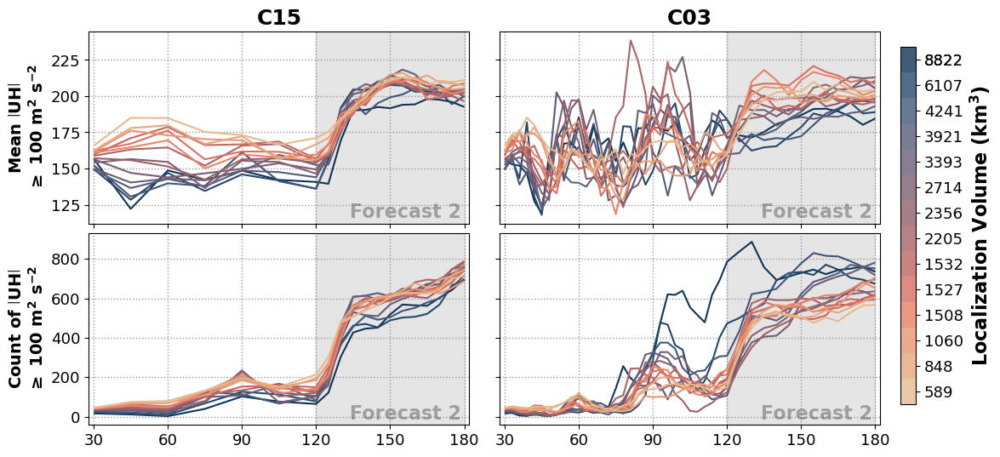

In [142]:
def plot_distribution(ax, var, **kwargs):
    hist, bins = np.histogram(var, bins=50)
    bins = (bins[1:]+bins[:-1])/2.0
    ax.semilogy(bins, hist ,**kwargs)

colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


fig, axes = plt.subplots(2,2, figsize=(12, 6), sharey='row', sharex=True)
#ax1 = ax.twinx()

exps = [f'C03_H{h:02d}_V6' for h in [18,15,12,9,7]]+[f'C03_H{h:02d}_V4' for h in [18,15,12,9,7]]+[f'C03_H{h:02d}_V2' for h in [18,15,12,9,7]]
exps1 = [f'C15_H{h:02d}_V6' for h in [18,15,12,9,7]]+[f'C15_H{h:02d}_V4' for h in [18,15,12,9,7]]+[f'C15_H{h:02d}_V2' for h in [18,15,12,9,7]]


hloc = [18, 15, 12, 9, 7]#[0:1]
vloc = [6,4,2]#[0:1]

freq=[15, 3]
           

for v in vols[::-1]:

    color_i = colors[findnearest(vols,v)]


    temp = df15.loc[df15.vols == v]
    axes[0,0].plot(temp.time, temp.uhmean, color=color_i) 
    axes[1,0].plot(temp.time, temp['count'],  color=color_i)


    temp = df03.loc[df03.vols == v]
    axes[0,1].plot(temp.time, temp.uhmean, color=color_i) 
    axes[1,1].plot(temp.time, temp['count'],  color=color_i)

#plot_distribution(ax, uh, label=rename(exp, version=version), color=color_i, lw=2, alpha=0.8)


    # 

    
    # ax1.scatter(position, size, marker = 'o', color='k', edgecolor='r', s=100)

    #ax.text(position, 1200, size)


    
    # bp1 = ax.boxplot(data, positions = [position], patch_artist=True)#, showfliers=False)

    # for item in ['boxes', 'whiskers', 'medians', 'caps']:
    #     plt.setp(bp1[item], color='k')
     
    # # for b,(box,fly) in enumerate(zip(bp1['boxes'],bp1['fliers'])):
    # #     box.set(facecolor=color_i)
    # #     fly.set_markeredgecolor(color_i)
    # for b,box in enumerate(bp1['boxes']):
    #     box.set(facecolor=color_i)


# NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
# NR = NR.rename({'UH2-5km':"UH_2-5km"})
# times_NR = [(pd.to_datetime(t)-dt.datetime(2024,5,8,19,30)).seconds/60 for t in NR.dates.values[:]] # don't need to read in the start 
# NR_UH = abs(NR['UH_2-5km'][:].values) # don't need to read in the start 
# mask = NR_UH < 156
# NR_UH[mask] = np.nan
# nr_uh = np.nanmean(NR_UH, axis=(1,2))-56
# count = np.sum(~mask, axis=(1,2))*3

# for ax in axes[0,:].flatten(): ax.plot(times_NR, nr_uh, color='k')
# for ax in axes[1,:].flatten(): ax.plot(times_NR, count, color='k')
    
for ax in axes.flatten():
    ax.axvspan(120, 180, color='k', alpha=0.1, zorder=0)
    ax.set_xlim(28,182)
    ax.set_xticks(np.arange(30, 183,30))
    ax.grid()
    ax.text(0.98, 0.03, f'Forecast 2', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)


axes[0,0].set_title('C15')
axes[0,1].set_title('C03')

ge = r"$\mathbf{\geq}$"
axes[0,0].set_ylabel(r'Mean $\mathbf{\left| {UH} \right|}$'+f'\n{ge} 100 '+ r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$', weight='bold', fontsize=14)
axes[1,0].set_ylabel(r'Count of $\mathbf{\left| {UH} \right|}$'+f'\n{ge} 100 '+ r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$', weight='bold', fontsize=14)

plt.subplots_adjust(wspace=0.08, hspace=0.05)

# for ai, ax in enumerate(axes[:,0]):
#     ai = np.clip(ai, 0, 1)


cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)
mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cax = fig.add_axes([0.92, 0.15, 0.015, 0.7])

cbar = fig.colorbar( mappable, cax=cax, alpha=0.8, pad=0.03)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)
cbar_ticks = np.array(np.arange(0, 15))
labels = [vols[i] for i in cbar_ticks]

cbar_ticks = np.concatenate([cbar_ticks[:-1] + 0.5, [13.5]])
cbar.set_ticks(ticks=cbar_ticks, labels=labels);

    


# Balance Plots

0.01201114273737238
0.01404559672487063
0.025563213145255836


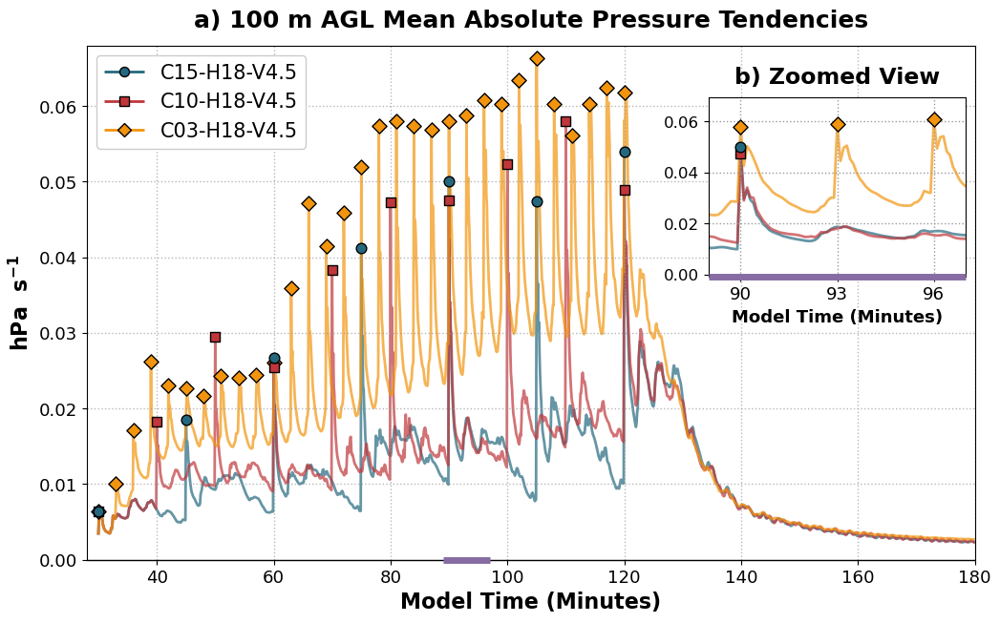

In [84]:

# exps = [f'C03_H09_V{h}' for h in [2,4,6]]
# version='V'

exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]
version='H'

exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]] #+ ['C03_H09_V2']
version = 'FULL'


members = np.arange(0, 36, 1)
fpath = f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'

colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
if len(exps) == 3: colors = list(cmaps.pride([.2, .75, .6]))
markers = ['o', 's', 'D', 'H','^', '>', '<', 'v']
ls = ['-']*len(exps)




fig,ax = plt.subplots(1,1, figsize=(12, 7), sharex=True)

# #use for the noAI plot
# exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H12_V4']#,'C03_H09_V4','C03_H09_V4_noAI',]

# #exps = ['C03_H09_V4','C03_H09_V4_noAI']
# version = 'Fullx'
# #colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))

# colors = list(cmaps.pride([0.2, 0.8, 0.65]))
# #colors = [colors[i] for i in [0,1,3,2]]
# ls     = ['-']* len(exps)#['--', '-', '--', '-']

new_ax = ax.inset_axes([.7, .55, .29, .35])

for i,exp in enumerate(exps): 

    # get da times
    with open(f'{fpath}{exp}/letkf.exp', 'rb') as f:exper= json.load(f)['DA_PARAMS']
    freq = exper['assim_freq']
    dalen =(dt.datetime.strptime(exper['DA_end_time'], '%Y-%m-%d %H:%M:%S')-dt.datetime.strptime(exper['DA_start_time'], '%Y-%m-%d %H:%M:%S')).seconds
    peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) +1

    # read in and process data

    wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
    i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
    i1=findnearest(wtg.time.values, 120)+1
    wres_adjusted = wtg['wres_adjusted'].values[i0:]
    rain = wtg['qr'].values[i0:]
    time = wtg.time.values[i0:]
    pten = wtg.divc.values[i0:].mean(axis=1)/100

    #find the peaks 
    df = pd.DataFrame(data={"pten":pten}, index=time)
   
    df['pmax'] = df['pten'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    #df['wmax'] = df['wtg_adjusted'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    

    #### WTG
    zord = 1
    #if i == 0: zord=500
    tc = colors[i]        

    #### PRESSURE TENDENCY
    scat=ax.scatter(df.index.values[i0:i1][::int(freq/6)], df['pmax'].values[i0:i1][::int(freq/6)], color=tc, s=60,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    ax.plot(df.pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))


    scat=new_ax.scatter(df.index.values[i0:i1][::int(freq/6)], df['pmax'].values[i0:i1][::int(freq/6)], color=tc, s=60,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    new_ax.plot(df.pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))

    print(np.mean(pten[i0:i1]))


handles, labels =ax.get_legend_handles_labels()
l, h = [],[]
for i, exp in enumerate(exps):
    h.append(mpl.lines.Line2D([0], [0], color=colors[i], linewidth=2, marker=markers[i],  markeredgecolor='k', linestyle=ls[i]))
    l.append(rename(exp, version=version))
ax.legend(handles=h, labels=l,fontsize=15, loc=2, markerscale=1.2)

ax.set_xlim(28, 180)



ax.set_title("a) 100 m AGL Mean Absolute Pressure Tendencies", weight='bold', y=1.02)
ax.set_xlabel('Model Time (Minutes)', fontsize=16)
ax.set_ylabel(r"hPa  s$\mathbf{^{-1}}$", fontsize=16);
ax.grid(ls=':', alpha=0.7)



new_ax.set_xlim(89, 97)
new_ax.set_xlabel('Model Time (Minutes)')
new_ax.set_xticks([90, 93, 96]);
new_ax.tick_params(axis='y', labelsize=12)
new_ax.grid()
new_ax.set_title('b) Zoomed View', fontsize=17, y=1.03)

#ax.plot([89, 97,97,89,89],[0,0,  0.065,0.065, 0])

# ax.spines['bottom'].set_color('red')
# ax.spines['bottom'].set_linewidth(3)
# ax.spines['bottom'].set_bounds(89, 97)



# 1. Hide the default spine
ax.spines['bottom'].set_visible(False)

# 2. Get the current y-axis limit to place the line exactly at the bottom
ax.set_ylim(0, 0.068)
ymin, ymax = ax.get_ylim()

# bottom spine
ax.plot([28, 180], [ymin, ymin], color='k', linewidth=1, clip_on=False, transform=ax.get_xaxis_transform())

# set color
spine_color = '#876ca3'
ax.plot([89, 97], [ymin, ymin], color=spine_color, linewidth=5, clip_on=False, transform=ax.get_xaxis_transform())
new_ax.spines['bottom'].set_color(spine_color)
new_ax.spines['bottom'].set_linewidth(5)
new_ax.spines['bottom'].set_capstyle('butt')


FIGNAME = 'Balance'#'VBalance'# 'NoAI'#'CIBalance'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C03_H07_V4
C03_H09_V4
C03_H12_V4
C03_H15_V4
C03_H18_V4


(25.0, 180.0)

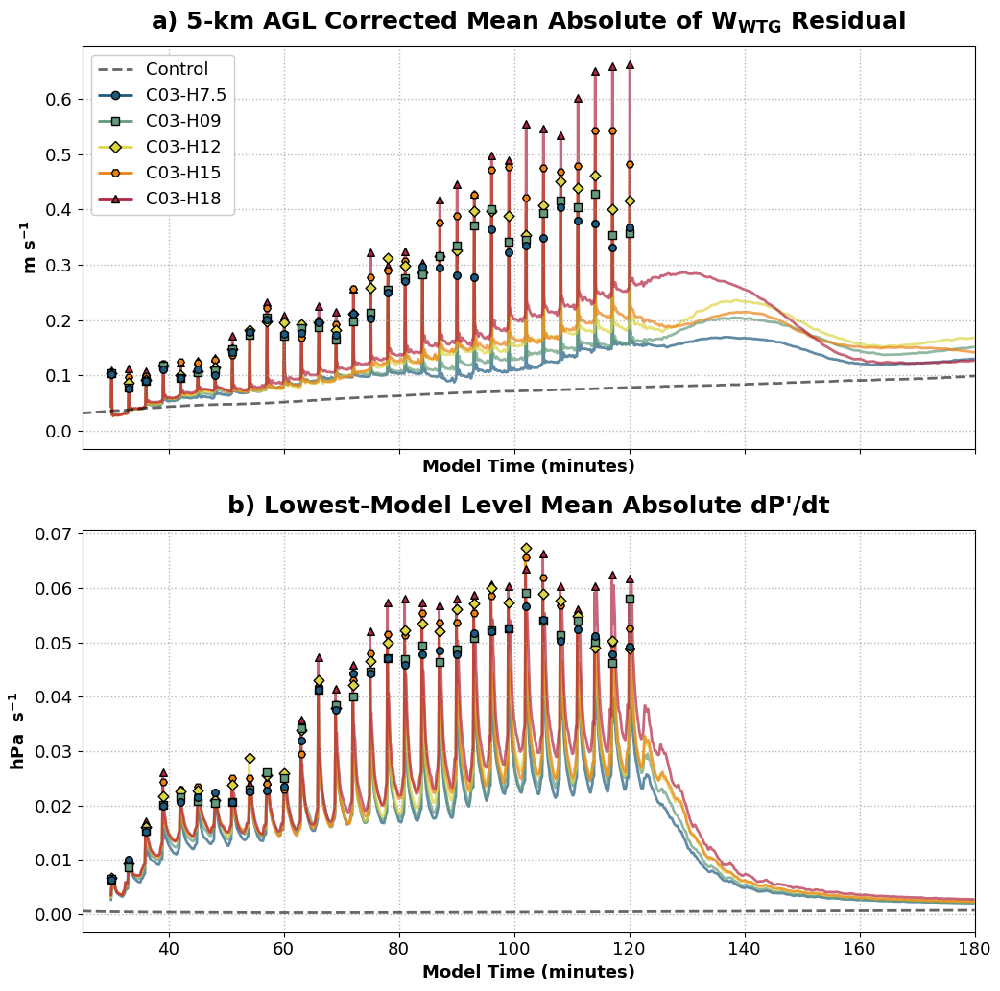

In [88]:

# exps = [f'C03_H09_V{h}' for h in [2,4,6]]
# version='V'

exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]
version='H'

# exps = [f'C{h:02d}_H18_V4' for h in [15,10,3]]
# version='CI'
# version='FULL'

# exps = ['C03_H09_V2','C03_H09_V2_noAI','C03_H18_V2','C03_H18_V2_noAI']
# version='fullx'

# # exps = [f'C{h:02d}_H09_V2' for h in [3,1]]
# # #exps = ['C03_H09_V2','C03_H09_V2_fine']
# # version='fullx'

# exps = ['C10_H09_V2','C10_H09_V2_fix','C03_H09_V2','C03_H09_V2_fix']
# version='raw'

#exps = ['C03_H09_V2_dense_fix','C03_H09_V2_fix']
# exps = ['C10_H09_V6_dense_fix','C10_H09_V6_fix']
# exps = ['C15_H15_V6_dense_fix','C15_H15_V6_fix']
# version='raw'
# exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V4','C03_H09_V4_noAI',]

members = np.arange(0, 36, 1)
fpath = f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'

colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
if len(exps) == 3: colors = list(cmaps.pride([.2, .6, .8]))
markers = ['o', 's', 'D', 'H','^', '>', '<', 'v']
ls = ['-']*len(exps)
fig,axes = plt.subplots(2,1, figsize=(12, 12), sharex=True)

#use for the noAI plot
# exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V4','C03_H09_V4_noAI',]
# version = 'raw'
# colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
# colors = [colors[i] for i in [0,1,3,2]]
# ls     = ['--', '-', '--', '-']


### WTG
control = xr.open_dataset(f'{fpath}Control/balance.nc')
ti      = findnearest(control.time, 30)
tti     = findnearest(control.time, 180)
slope, _,_,_,_= scipy.stats.linregress(control['wres'][ti:,:].values.ravel(), control['qr'][ti:,:].values.ravel())
control_rain = control['qr'].values

con=axes[0].plot(control.time, control.wres.mean(axis=1), color='k', label='Control', ls='--', lw=2, alpha=0.6)

#pten = control.divc.values.mean(axis=1)/100
con=axes[1].plot(control.time,control.divc.values.mean(axis=1)/100, color='k', label='Control', ls='--', lw=2, alpha=0.6)


   
axes[0].set_title("a) 5-km AGL Corrected Mean Absolute "+r"of W$\mathbf{_{WTG}}$ Residual", weight='bold', y=1.02)
axes[0].set_xlabel('Model Time (minutes)')
axes[0].set_ylabel(r'm s$\mathbf{^{-1}}$');
axes[0].grid(ls=':', alpha=0.7)

axes[1].set_title("b) Lowest-Model Level Mean Absolute dP\'/dt", weight='bold', y=1.02)
axes[1].set_xlabel('Model Time (minutes)')
axes[1].set_ylabel(r'hPa  s$\mathbf{^{-1}}$');
axes[1].grid(ls=':', alpha=0.7)



control60 = xr.open_dataset(f'{fpath}Control60/balance.nc')
ti      = findnearest(control.time, 30)
tti     = findnearest(control.time, 180)
slope60, _,_,_,_= scipy.stats.linregress(control60['wres'][ti:,:].values.ravel(), control60['qr'][ti:,:].values.ravel())
control_rain60 = control60['qr'].values



for i,exp in enumerate(exps): 

    # get da times
    with open(f'{fpath}{exp}/letkf.exp', 'rb') as f:exper= json.load(f)['DA_PARAMS']
    freq = exper['assim_freq']
    dalen =(dt.datetime.strptime(exper['DA_end_time'], '%Y-%m-%d %H:%M:%S')-dt.datetime.strptime(exper['DA_start_time'], '%Y-%m-%d %H:%M:%S')).seconds
    peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) +1

    # read in and process data

    wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
    i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
    i1=findnearest(wtg.time.values, 120)+1
    wres = wtg['wres'].values[i0:]
    rain = wtg['qr'].values[i0:]
    time = wtg.time.values[i0:]
    pten = wtg.divc.values[i0:].mean(axis=1)/100
    # #pten = wtg.divc.values[i0:][:,10]/100

    if np.shape(rain)[1]  >37:
        wtg_adjusted = (wres- (1/slope60)*(rain - control_rain60[ti:ti+len(rain)])).mean(axis=1)
    else:
        wtg_adjusted = (wres- (1/slope)*(rain - control_rain[ti:ti+len(rain)])).mean(axis=1)
        #wtg_adjusted = (wres- (1/slope)*(rain - control_rain[ti:ti+len(rain)]))[:,10]  #.mean(axis=1)

    #find the peaks 
    df = pd.DataFrame(data={"wtg_adjusted":wtg_adjusted, "pten":pten}, index=time)
   
    df['pmax'] = df['pten'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    df['wmax'] = df['wtg_adjusted'].rolling(window=int(6*freq/60), center=True, min_periods=int(6*freq/60/2)).max()
    

    #### WTG
    zord = 1
    #if i == 0: zord=500
    tc = colors[i]        
    scat=axes[0].scatter(df.index.values[:i1][::int(freq/6)]+.1, df['wmax'].values[:i1][::int(freq/6)], color=tc, s=30,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    print(exp)
    axes[0].plot(df.wtg_adjusted,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))


    #### PRESSURE TENDENCY
    scat=axes[1].scatter(df.index.values[i0:i1][::int(freq/6)], df['pmax'].values[i0:i1][::int(freq/6)], color=tc, s=30,marker=markers[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    axes[1].plot(df.pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=zord, ls=ls[i])#, zorder=100*(10-i))


handles, labels =axes[0].get_legend_handles_labels()
l = [labels[0]]
h = [handles[0]]
for i, exp in enumerate(exps):
    h.append(mpl.lines.Line2D([0], [0], color=colors[i], linewidth=2, marker=markers[i],  markeredgecolor='k', linestyle=ls[i]))
    l.append(rename(exp, version=version))
axes[0].legend(handles=h, labels=l,fontsize=13, loc=2)
#axes[1].legend(handles=h[1:], labels=l[1:],fontsize=13, loc='upper center', ncol=4)


axes[0].set_xlim(25, 180)


# FIGNAME = 'NoAI'#'VBalance'# 'NoAI'#'CIBalance'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

# Analysis Plots

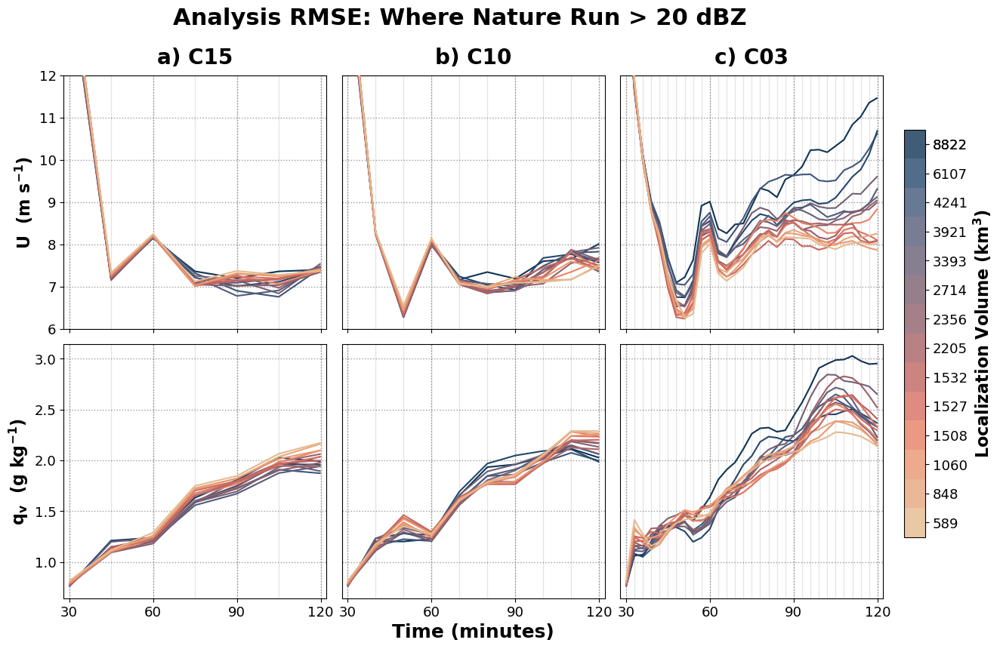

In [87]:
n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95


allvars = ['u_20dbz', 'qv_20dbz' ]

freq = [15, 10, 3]
hloc = [ 15, 12, 9, 7, 18]
vloc = [6,2, 4]

hloc = [18,15,12,9,7]
vloc = [6,4,2]


colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}


vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


# mycols = [colors[findnearest(vols, df.vols_3.loc[i])] for i in df.index]


fig, axes = plt.subplots(len(allvars),3, figsize=(14, 9), sharey='row', sharex=True)

for fi, freq in enumerate(freq):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=20,  y=1.02)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)
            time = ds.time.values

            color_i = colors[findnearest(vols, (4/3)*np.pi*vr*hr*hr)]

            ls = '-'
        
            for ai, a in enumerate(allvars):
              
                axes[ai, fi].plot(time, ds[a].mean(axis=1), color=color_i, lw=1.5, ls=ls, zorder=200)

                # if ((h == 18) &( v==6)) | ((h == 7) &( v==2)):
                        
                #     lower_bound = []
                #     upper_bound = []
                #     for ti, t in enumerate(time):
                #         a_var = ds[a][ti,:-1].values
                #         boot_metrics = bootstrap_singlevar(a_var, indices)
                #         results = get_universal_bca(a_var, boot_metrics, np.mean(a_var), mode='single_var', operation='single')
                #         lower_bound.append(results['Value']['lower_bound'])
                #         upper_bound.append(results['Value']['upper_bound'])
    
                        
                        #ci.append(compute_ci_perc(bootstrap_fss_from_indices(ds[a][ti,:-1].values, indices), interval))
                    # axes[ai, fi].fill_between(time, lower_bound, upper_bound, color=color_i, alpha=0.2, zorder=0,label='Control Run \n95% Confidence Interval')
                    
                

                # if (h == 18) &( v==4):

                #     ci = []
                #     for ti, t in enumerate(time):
                #         ci.append(compute_ci_perc(bootstrap_fss_from_indices(ds[a][ti,:-1].values, indices), interval))
                #     axes[ai, fi].fill_between(time, ds[a].mean(axis=1) - ci, ds[a].mean(axis=1) + ci , color='k', alpha=0.3, zorder=200, label='Control Run \n95% Confidence Interval')
                    
                if fi == 0: axes[ai,0].set_ylabel( f"{titles[a.replace('_20dbz', '')]}  ({units[a.replace('_20dbz', '')]})", fontsize=16)
                if ai == 2: axes[ai, fi].set_xlabel('Time (Minutes)', weight='bold')
                

    
            #if count % 2 == 0:

for ax in axes.flatten():
    #ax.axvline(52, color='C3', lw=2, alpha=0.4, ls='-')
    # ax.axvline(90,  color='k', lw=3, alpha=0.3, ls='-')
    # ax.axvline(120, color='k', lw=3, alpha=0.3, ls='-')
    ax.grid()

for ax in axes[:, 0]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 15)]
for ax in axes[:, 1]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 10)]
for ax in axes[:, 2]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 3)]

axes[0,0].set_ylim(6, 12)

#axes[0,0].set_ylim(13, 15)
axes[0,0].set_xlim(28, 122)
axes[0,0].set_xticks(np.arange(30, 130, 30), np.arange(30, 130, 30))


cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)
mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar( mappable, cax=cax, alpha=0.8)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)


cbar_ticks = np.array(np.arange(0, 15))
labels = [vols[i] for i in cbar_ticks]

cbar_ticks = np.concatenate([cbar_ticks[:-1] + 0.5, [13.5]])
cbar.set_ticks(ticks=cbar_ticks, labels=labels);

axes[1, 1].set_xlabel('Time (minutes)', weight='bold', fontsize=18)



fig.suptitle('Analysis RMSE: Where Nature Run > 20 dBZ', fontsize=22, weight='bold', y=.98)
plt.subplots_adjust(hspace=0.06, wspace=0.06)

#axes[0,1].legend(loc=1, fontsize=14, handlelength=1)


for ax in axes[:, 1:].flatten():
    ax.tick_params(axis='y', which='both', left=False)

# FIGNAME = 'AnalysisRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


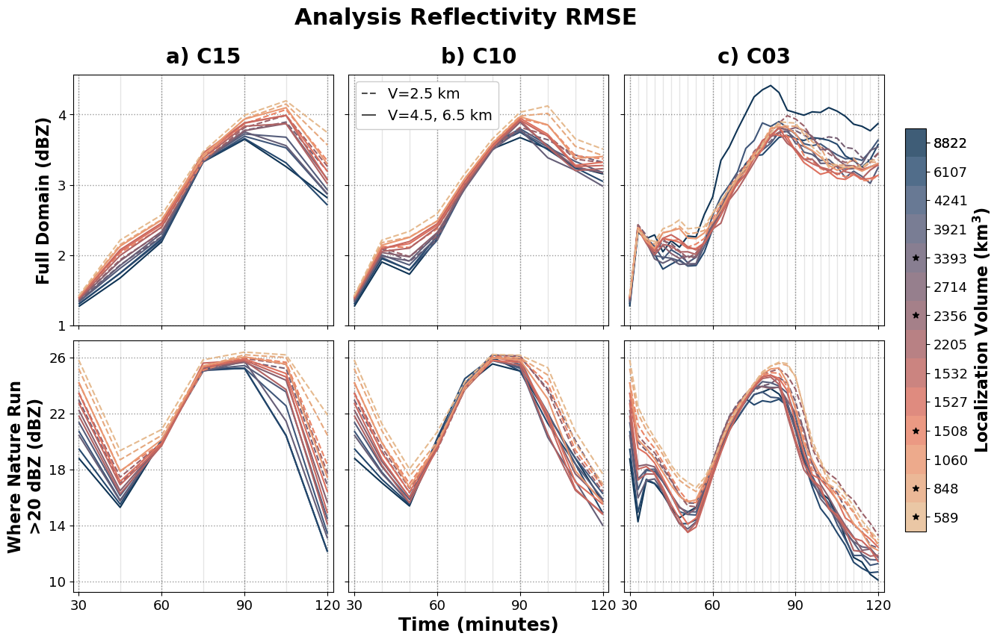

In [111]:
n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95


allvars = [ 'dbz','dbz_20dbz']

freqs = [15, 10, 3]
hloc = [ 15, 12, 9, 7, 18]
vloc = [6,2, 4]

hloc = [18,15,12,9,7]
vloc = [6,4,2]

colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
# units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
# titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}


vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]

fig, axes = plt.subplots(len(allvars),3, figsize=(14, 9), sharey='row', sharex=True)

for fi, freq in enumerate(freqs):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=20,  y=1.02)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)
            time = ds.time.values

            color_i = colors[findnearest(vols, (4/3)*np.pi*vr*hr*hr)]

            ls = '-'
            #if v == 2: ls = ':'
            if v == 2: ls = '--'
        


            for ai, a in enumerate(allvars):
              
                axes[ai, fi].plot(time, ds[a].mean(axis=1), color=color_i, lw=1.5, ls=ls, zorder=200)

                #if (h == 18) &( v==4):

                # lower_bound = []
                # upper_bound = []
                # for ti, t in enumerate(time):
                #     a_var = ds[a][ti,:-1].values
                #     boot_metrics = bootstrap_singlevar(a_var, indices)
                #     results = get_universal_bca(a_var, boot_metrics, np.mean(a_var), mode='single_var', operation='single')
                #     lower_bound.append(results['Value']['lower_bound'])
                #     upper_bound.append(results['Value']['upper_bound'])

                    
                #     #ci.append(compute_ci_perc(bootstrap_fss_from_indices(ds[a][ti,:-1].values, indices), interval))
                # axes[ai, fi].fill_between(time, lower_bound, upper_bound, color=color_i, alpha=0.2, zorder=0,label='Control Run \n95% Confidence Interval')
                    


for ax in axes[0:2, :].flatten():
    ax.grid()

for ax in axes[0:2, 0]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 15)]
for ax in axes[0:2, 1]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 10)]
for ax in axes[0:2, 2]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 3)]


axes[0,0].set_xlim(28, 122)
axes[0,0].set_xticks(np.arange(30, 130, 30), np.arange(30, 130, 30))


cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)
mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar( mappable, cax=cax, alpha=0.8)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)


cbar_ticks = np.array(np.arange(0, 15))
labels = [vols[i] for i in cbar_ticks]

cbar_ticks = np.concatenate([cbar_ticks[:-1] + 0.5, [13.5]])
cbar.set_ticks(ticks=cbar_ticks, labels=labels);

for v in [0, 1,3, 7, 9]:
    cbar.ax.scatter(0.5, (v+0.5), marker='*', color='k')

axes[1, 1].set_xlabel('Time (minutes)', weight='bold', fontsize=18)


plt.subplots_adjust(hspace=0.06, wspace=0.06)
fig.suptitle('Analysis Reflectivity RMSE', fontsize=22, weight='bold', y=.98)


legend_lines = [
    mpl.lines.Line2D([0], [0], color='0.3', linestyle='--', label='V=2.5 km'),
    mpl.lines.Line2D([0], [0], color='0.3', linestyle='-', label='V=4.5, 6.5 km')]
axes[0,1].legend(handles=legend_lines, fontsize=14, loc=2, handlelength=1)
#axes[1,1].legend(loc='lower center', fontsize=14, handlelength=1)

axes[0,0].set_ylabel('Full Domain (dBZ)', fontsize=16)
axes[1,0].set_ylabel('Where Nature Run\n>20 dBZ (dBZ)', fontsize=16)

axes[0,0].set_yticks(np.arange(1, 5, 1), np.arange(1, 5, 1));
axes[1,0].set_yticks(np.arange(10, 27, 4), np.arange(10, 27, 4));


FIGNAME = 'AnalysisRefRMSE'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


# Forecast bar charts

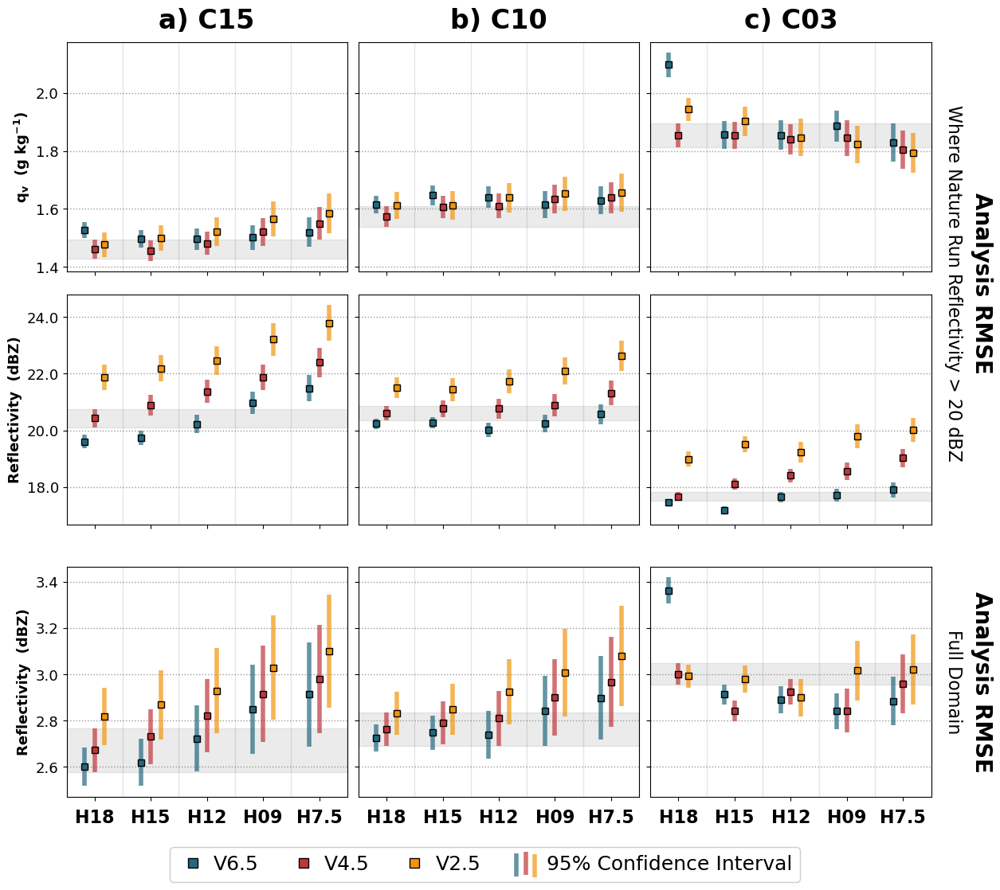

In [2]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]



## eFSS stuff
var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 40, 75
neighborhood_size = 24 # km 

n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 6

allvars = ['qv_20dbz', 'dbz_20dbz', 'dbz']

#allvars = ['w', 'dbz']



if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)



for ci, c in enumerate(freq):

    temp_table = np.zeros([6, len(hloc), len(vloc)])
    ci_table   = np.zeros([6, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{c:02d}_H{h:02d}_V{v}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)

            for ii, var in enumerate(allvars):

                #var = var+'_20dbz'
                
                temp_table[ii, hi, vi] = ds[var][:,:-1].mean()
                ci_table[ii, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(ds[var][:,:-1].values.mean(axis=0), indices), interval)
            ds.close()

    
            # except:
            #     temp_table[0, hi, vi] =np.nan
            #     temp_table[1, hi, vi] =np.nan
            #     temp_table[2, hi, vi] =np.nan
            #     ci_table[0, hi, vi]   =np.nan
            #     ci_table[1, hi, vi]   =np.nan
            #     ci_table[2, hi, vi]   =np.nan
                

    temp_table[temp_table == 0] = np.nan

    for i in range(len(allvars)):

        axes[i, 0].set_ylabel( f"{titles[allvars[i].replace('_20dbz', '')]}  ({units[allvars[i].replace('_20dbz', '')]})")
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])


plt.subplots_adjust(hspace=0.10, wspace=0.04)

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.1f}'))


plt.draw()

### add space betweent he plots
for ax in axes[2,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.02
    pos.y1 = pos.y1 -.02
    ax.set_position(pos)
fig.canvas.draw()


    
xt, yt = centered_on_axes(axes, 0)
fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
fig.text(xt+.02, yt, 'Where Nature Run Reflectivity > 20 dBZ', ha='center', va='center', rotation=-90, fontsize=16);

xt, yt = centered_on_axes(axes, -1, version = 'on')
fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
fig.text(xt+.02, yt, 'Full Domain', ha='center', va='center', rotation=-90, fontsize=16);


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)


axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



# FIGNAME = 'AnalysisRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


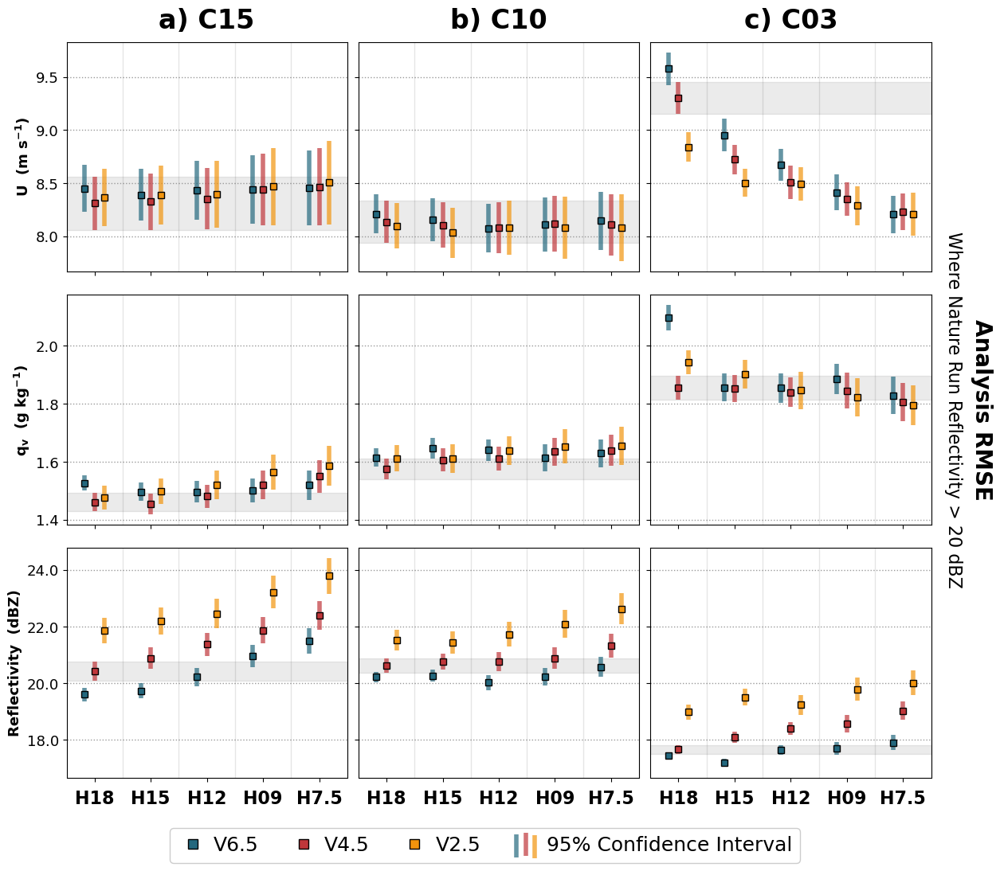

In [70]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10,3]#[15, 10, 3]



## eFSS stuff
var1, var2 = 'compdz', 'uh2to5'
thresh1, thresh2   = 40, 75
neighborhood_size = 24 # km 

n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)

units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]
NR_size = NR.cp_size.values
NR.close()

colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
marker = 's'
ms     = 6

allvars = ['u_20dbz', 'qv_20dbz', 'dbz_20dbz']

#allvars = ['w', 'dbz']



if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)



for ci, c in enumerate(freq):

    temp_table = np.zeros([6, len(hloc), len(vloc)])
    ci_table   = np.zeros([6, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{c:02d}_H{h:02d}_V{v}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)
            #ti = findnearest(ds.time.values, 120)

            for ii, var in enumerate(allvars):

                #var = var+'_20dbz'
                
                temp_table[ii, hi, vi] = ds[var][:,:-1].mean()
                ci_table[ii, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(ds[var][:,:-1].values.mean(axis=0), indices), interval)
            ds.close()

    
            # except:
            #     temp_table[0, hi, vi] =np.nan
            #     temp_table[1, hi, vi] =np.nan
            #     temp_table[2, hi, vi] =np.nan
            #     ci_table[0, hi, vi]   =np.nan
            #     ci_table[1, hi, vi]   =np.nan
            #     ci_table[2, hi, vi]   =np.nan
                

    temp_table[temp_table == 0] = np.nan

    for i in range(len(allvars)):

        axes[i, 0].set_ylabel( f"{titles[allvars[i].replace('_20dbz', '')]}  ({units[allvars[i].replace('_20dbz', '')]})")
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=ci_table[i,:,vi], marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(temp_table[i,conh,vi]-ci_table[i,conh,vi],temp_table[i,conh,vi]+ci_table[i,conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])


plt.subplots_adjust(hspace=0.10, wspace=0.04)

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)
    ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.1f}'))


plt.draw()

### add space betweent he plots
# for ax in axes[2,:].flatten():
#     pos = ax.get_position()
#     pos.y0 = pos.y0 -.02
#     pos.y1 = pos.y1 -.02
#     ax.set_position(pos)
# fig.canvas.draw()


    
xt, yt = centered_on_axes(axes, 1, version='on')
fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
fig.text(xt+.02, yt, 'Where Nature Run Reflectivity > 20 dBZ', ha='center', va='center', rotation=-90, fontsize=16);

# xt, yt = centered_on_axes(axes, -1, version = 'on')
# fig.text(xt+.02+.025, yt, 'Analysis RMSE', ha='center', va='center', rotation=-90, weight='bold', fontsize=20);
# fig.text(xt+.02, yt, 'Full Domain', ha='center', va='center', rotation=-90, fontsize=16);


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)


axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, .01), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



# FIGNAME = 'AnalysisRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


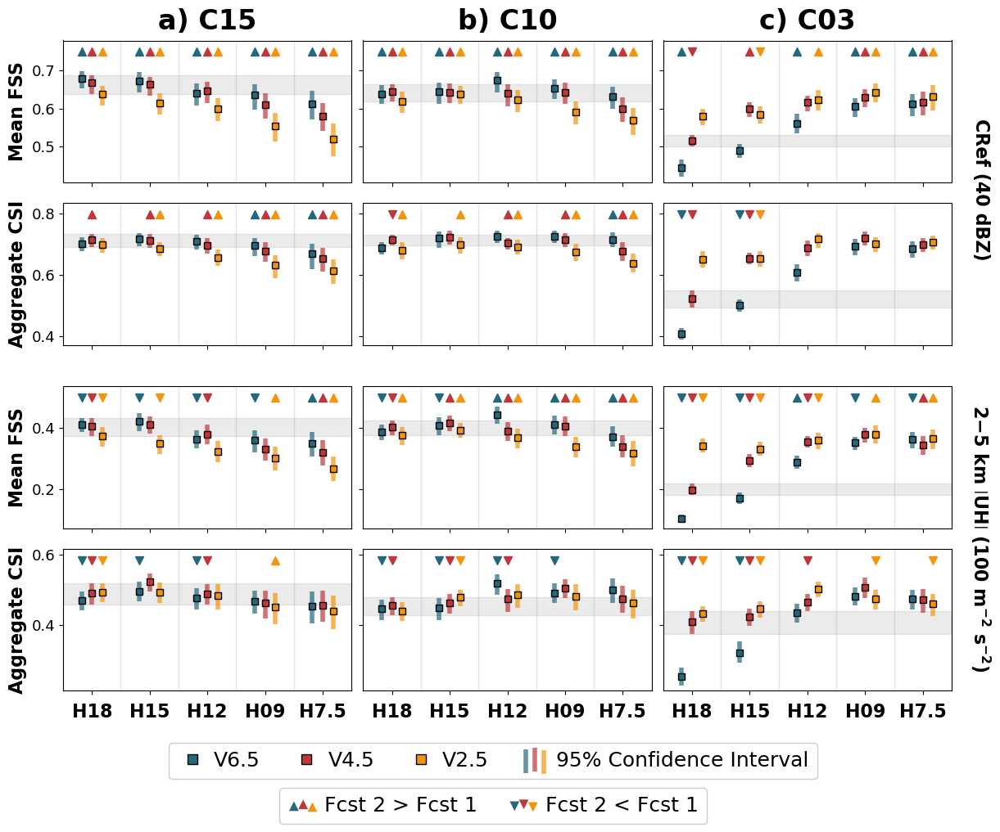

In [14]:

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]

freq=[15, 10, 3]
#freq=[3]
fcsts= ['']
#fcsts = ['FORECAST_20240508_2100']
fcsts = ['FORECAST_20240508_2100', '']


## eFSS stuff
myvars = ['compdz', 'uh2to5']
mythres  = [40, 100]
neighborhood_size = 24 # km 

n = 36#*len(fcsts)
max_index = 36*len(fcsts)
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

#################################################################
if len (freq) == 3:
    fig, axes = plt.subplots(4,3, figsize=(14, 10), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(4,4, figsize=(19, 10), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)
colors = list(cmaps.pride([.2, .75, .6]))


ls     = '-'
lw     = 3
alpha  = 0.8
#marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table  = np.zeros([4, len(hloc), len(vloc)])
    stat_table  = np.zeros([4, len(hloc), len(vloc)])
    ci_table    = np.zeros([4, 2, len(hloc), len(vloc)]) # second index is for lower and upper bound

    for vi, v in enumerate(vloc):
        for hi, h in enumerate(hloc):
            for i,var in enumerate(myvars):

                exp =  f"C{c:02d}_H{h:02d}_V{v}/"

                # i should be (i*2) + 1

                axes[i*2, 0].set_ylabel(f'Mean FSS', fontsize=16)
                axes[(i*2)+1, 0].set_ylabel(f'Aggregate CSI', fontsize=16)

                # ## the fss variable
                fss_vals, ci_val1, ci_val2, stat = generate_CI_FSS(exp, var, neighborhood=24, thresh=mythres[i], fcsts=fcsts, fcst_diff=True)
    
                temp_table[i*2, hi, vi]   = fss_vals
                ci_table[i*2,0, hi, vi]   =  ci_val1
                ci_table[i*2,1, hi, vi]   =  ci_val2
    
                if len(fcsts)>1:
                    
                    stat_table[i*2, hi, vi] = stat #get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val2-ci_val1) #### NEED TO FIX THIS

                # the contigency table variable

                if var == 'uh2to5': var = 'UH'
                if var == 'compdz': var = 'compdbz'

                val_dct, ci_dct = generate_CI_contigency(exp, var, fcsts=fcsts, fcst_diff=True)

                temp_table[(i*2)+1, hi, vi]   =  val_dct['CSI'][0]
                ci_table[(i*2)+1,0, hi, vi]   =  ci_dct['CSI'][0]
                ci_table[(i*2)+1,1, hi, vi]   =  ci_dct['CSI'][1]

                if len(fcsts)>1:
                    stat_table[(i*2)+1, hi, vi] = ci_dct['CSI_sig']#get_stat_difference_1val( val_dct['CSI'][0],  val_dct['CSI'][1], ci_dct['CSI'][1]-ci_dct['CSI'][0])


    for i in range(4):

        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=abs(ci_table[i,:,:,vi]-temp_table[i,:,vi]), marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker='s',markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(ci_table[i,0, conh,vi],ci_table[i,1, conh,vi], alpha=0.08, color='k')#colors[vi])


            # now loop over 
            for hi, h in enumerate(hloc):

                if stat_table[i, hi, vi] == -1:     
                    axes[i, ci].plot(hi+xoff, .92, marker = 'v', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                if stat_table[i, hi, vi] == 1:
                    axes[i, ci].plot(hi+xoff, .92, marker = '^', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
                if stat_table[i, hi, vi] == 999:
                    axes[i, ci].plot(hi+xoff, .92, marker = 'x', markeredgecolor=colors[vi], markerfacecolor=colors[vi], lw=0, markersize=7, transform = transforms.blended_transform_factory(axes[i, ci].transData,axes[i, ci].transAxes))
           

for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)

    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.03*y1)
    # ax.set_ylim(0,1)


# set titles
for ci,c in enumerate(freq):    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)

plt.subplots_adjust(hspace=0.15, wspace=0.04)


### add space betweent he plots
for ax in axes[0:2,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 +.025
    pos.y1 = pos.y1 +.025
    ax.set_position(pos)
fig.canvas.draw()


### fancy legend
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='^', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 > Fcst 1')
axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='v', linewidth=0, s=50, color='w', alpha=1, label='Fcst 2 < Fcst 1')

handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.01), ncol=6, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)


handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[4],handles[5]], [labels[4], labels[5]]
leg2=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.2, loc='lower center', bbox_to_anchor=(0.5, -.065), ncol=2, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg2.legend_handles[0].set_facecolors(colors)
leg2.legend_handles[1].set_facecolors(colors)


### add rhs labels
xt, yt = centered_on_axes(axes, 0)
tvar = 'CRef'
units = r'dBZ'
geq = r'$\mathbf{\geq}$'
fig.text(xt+.025, yt, f'{tvar} (40 {units}) ', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);

xt, yt = centered_on_axes(axes, 2)
tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'
fig.text(xt+.025, yt,  f'{tvar} (100 {units})', ha='center', va='center', rotation=-90, weight='bold', fontsize=16);


# FIGNAME = 'ForecastOverview'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

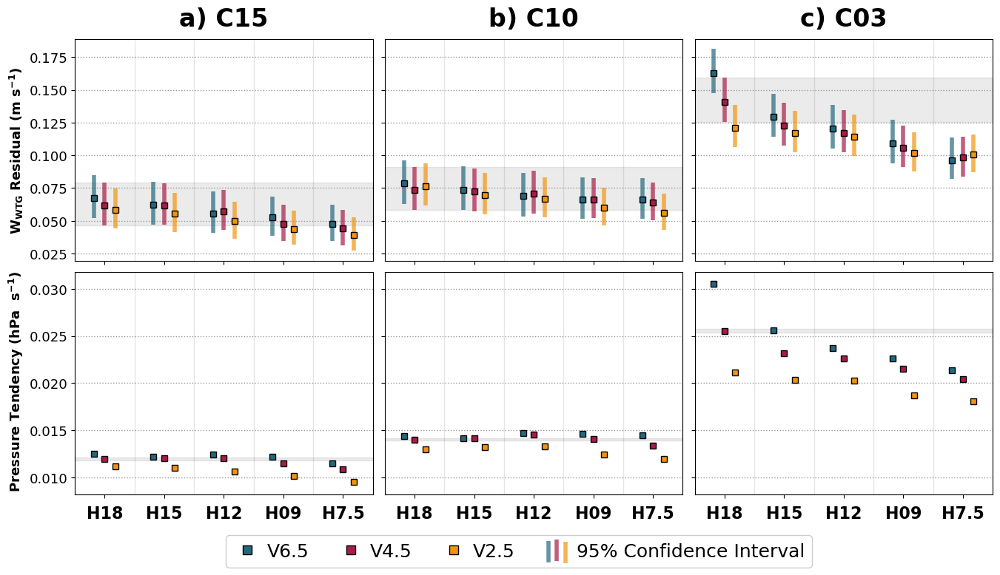

In [13]:
n = 36
max_val = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

interval=95




hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
freq = [15,10, 3]#[15, 10, 3]



#################################################################

if len (freq) == 3:
    fig, axes = plt.subplots(2,3, figsize=(16, 8), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(2,4, figsize=(19, 8), sharey='row', sharex=True)


hloc_i = range(len(hloc))
vloc_i = range(len(vloc))
gridx, gridy = np.meshgrid(hloc_i, vloc_i)


colors = list(cmaps.pride([.2, .8, .6]))


ls     = '-'
lw     = 2
alpha  = 0.8
marker = 's'
ms     = 6

for ci, c in enumerate(freq):

    temp_table = np.zeros([2, len(hloc), len(vloc)]) 
    ci_table   = np.zeros([2,2, len(hloc), len(vloc)])
    for vi, v in enumerate(vloc):
        
        for hi, h in enumerate(hloc):
        
            #try:
            path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", f"C{c:02d}_H{h:02d}_V{v}/")
            wtg = xr.open_dataset(f'{path}/balance.nc')
            stop = findnearest(wtg.time, 120)
            

            temp_table[0, hi, vi] = np.mean(wtg.wres_adjusted.values[:stop])
            temp_table[1, hi, vi] = np.mean(wtg.divc.values[:stop])/100


            # ci_table[0, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(wtg.wres_adjusted.values[:stop].mean(axis=0).flatten(), indices), interval)
            # ci_table[1, hi, vi] = compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)


            
            # ## the fss variable
            a_var= wtg.wres_adjusted.values[:stop].mean(axis=0)
        
            boot_metrics = bootstrap_singlevar(a_var, indices)
            results = get_universal_bca(a_var, boot_metrics, np.mean(a_var), mode='single_var', operation='single')
            ci_table[0, 0, hi, vi] = results['Value']['lower_bound']
            ci_table[0, 1, hi, vi] = results['Value']['upper_bound']


            a_var= wtg.divc.values[:stop].mean(axis=0)/100
        
            boot_metrics = bootstrap_singlevar(a_var, indices)
            results = get_universal_bca(a_var, boot_metrics, np.mean(a_var), mode='single_var', operation='single')
            ci_table[1, 0, hi, vi] = results['Value']['lower_bound']
            ci_table[1, 1, hi, vi] = results['Value']['upper_bound']

            
                
    
    
    
                
        
            wtg.close()
            # except:
            #     pass

    temp_table[temp_table == 0] = np.nan

    for i in range(2):
        axes[i, ci].grid(axis='y')
        shift = .18
        for vi, v in enumerate(vloc):
            name = rename(f'C03_H09_V{v}', version='V').split('-')[1]
    
            xoff = shift * (vi - 1)
            axes[i, ci].errorbar(np.array(hloc_i)+xoff, temp_table[i,:,vi], yerr=abs(ci_table[i,:,:,vi]-temp_table[i,:,vi]), marker='s', ms=0,mec='k', lw=0,color=colors[vi], elinewidth=4,capsize=0, label=name, alpha=0.7)
            axes[i, ci].plot(np.array(hloc_i)+xoff, temp_table[i,:,vi], color=colors[vi], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)

            if v == 4:
                conh = findnearest(hloc, 18)
                axes[i, ci].axhspan(ci_table[i,0,conh,vi],ci_table[i,1, conh,vi], alpha=0.08, color='k')#alpha=0.1, color=colors[vi])



for ax in axes.flatten():
    ax.set_xticks(hloc_i,[rename(f'C03_H{m:02d}_V4', version='H').split('-')[1] for m in hloc], weight='bold', fontsize=16)#, pad=10)
    ax.set_xlim(-0.5, len(hloc)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in hloc_i]
    ax.tick_params(axis='x', which='major', pad=7)


unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ['40 dBZ CRef eFSS',f'100 {unit} UH eFSS', 'Cold Pool Size Error\n'+r'(1000 km$\mathbf{^2}$)', ]

# set titles
for ci,c in enumerate(freq):
    axes[0, ci].set_title(chr(ord('`')+ci+1)+') '+rename(f'C{c:02d}_H09_V4', version='CI'), weight='bold', fontsize=24,  y=1.03)


plt.subplots_adjust(hspace=0.05, wspace=0.04)

labels = [r'W$\mathbf{_{WTG}}$ Residual (m s$\mathbf{^{-1}}$)', "dP\'/dt"+r'(hPa  s$\mathbf{^{-1}}$)']
axes[0,0].set_ylabel(r'W$\mathbf{_{WTG}}$ Residual (m s$\mathbf{^{-1}}$)', weight='bold')
axes[1,0].set_ylabel(r" Pressure Tendency (hPa  s$\mathbf{^{-1}}$)", weight='bold')

axes[0,0].scatter(-1.5, np.nanmean(temp_table[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0,0].get_legend_handles_labels()
new_handles,new_labels = [handles[0],handles[1],handles[2],(handles[3])], [labels[0], labels[1],labels[2], labels[3]]
leg=fig.legend(new_handles, new_labels, fontsize=18, scatterpoints=3, markerscale=1.5, loc='lower center', bbox_to_anchor=(0.5, -.03), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_facecolors(colors)



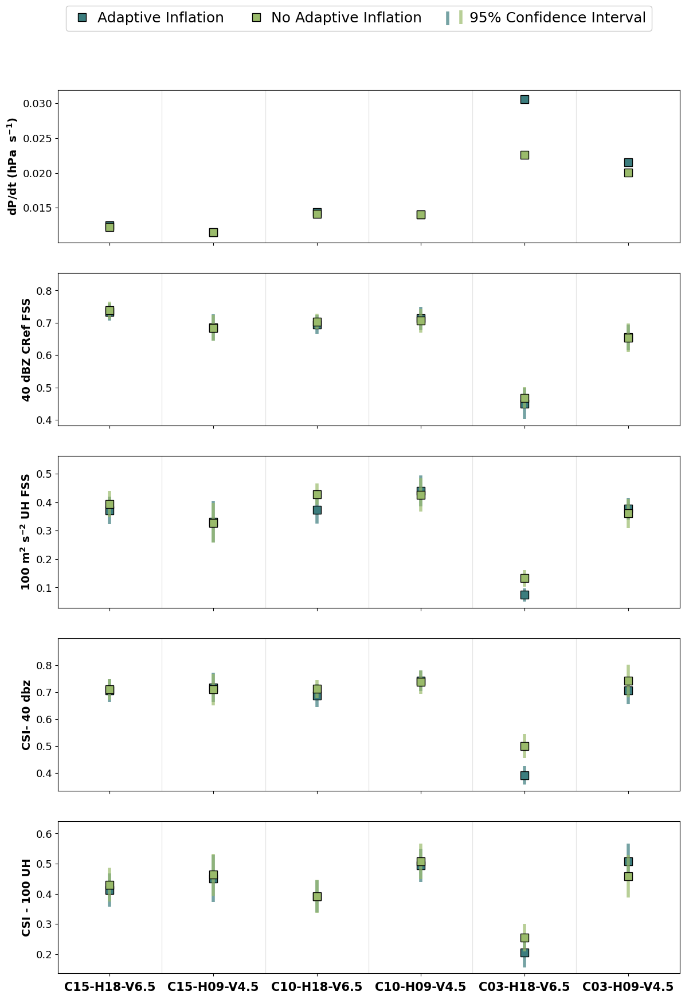

In [344]:
exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V4','C03_H09_V4_noAI',]

exps = ['C15_H18_V6','C15_H09_V4','C10_H18_V6','C10_H09_V4','C03_H18_V6','C03_H09_V4']

fig, axes = plt.subplots(5,1, sharex=True, figsize=(14,20))

n = 36
max_val = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_val, n_boot, seed=42)

interval=95

version = 'raw'

colors = list(cmaps.pride(np.linspace(.17,.78, len(exps))))
#colors = [colors[i] for i in [0,1,3,2]]

colors = cmaps.pride([0.25, 0.4])
ls     = ['--', '-', '--', '-']


ls     = '-'
lw     = 2
alpha  = 0.8
marker = 's'
ms     = 10


offset = [-0.05, 0.05]
offset = [0,0]


for ei, exp in enumerate(exps):

  

    for ai, add in enumerate(['', '_noAI']):

        if ai == 0: name = 'Adaptive Inflation'
        else: name = "No Adaptive Inflation"


        exp = exp+add
        
        path = os.path.join("/work/jessica.mcdonald/CM1_LETKF_2025/experiments/", exp)

        xoff = offset[ai]

        
        #### plot 1 - balance
        wtg = xr.open_dataset(f'{path}/balance.nc')
        stop = findnearest(wtg.time, 120)
        
        pres = np.mean(wtg.divc.values[:stop])/100
        pres_ci = compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)
        wtg.close()

       

        axes[0].errorbar(ei+xoff, pres, yerr=pres_ci, marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[0].plot(ei+xoff, pres, color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        #### plot 2 = FSS
        #fss_vals, ci_val = generate_CI_FSS(exp, 'compdz', neighborhood=24, thresh=40, fcsts=['FORECAST_20240508_2100', ''], fcst_split=True)

        fss_vals, ci_val = generate_CI_FSS(exp, 'compdz', neighborhood=24, thresh=40, fcsts=[''])
        
        
        axes[1].errorbar(ei+xoff,fss_vals[-1], yerr=ci_val, marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0,alpha=0.7)
        axes[1].plot(ei+xoff, fss_vals[-1], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        # diff = get_stat_difference_1val(fss_vals[0], fss_vals[1], ci_val)
        # if diff == -1:     
        #     axes[1].plot(ei+xoff, .92, marker = 'v', markeredgecolor=colors[ai], markerfacecolor=colors[ai], lw=0, markersize=8, transform = transforms.blended_transform_factory(axes[1].transData,axes[1].transAxes))
        # if diff == 1:
        #     axes[1].plot(ei+xoff, .92, marker = '^', markeredgecolor=colors[ai], markerfacecolor=colors[ai], lw=0, markersize=8, transform = transforms.blended_transform_factory(axes[1].transData,axes[1].transAxes))
           


        #### plot 3 = FSS
        #fss_vals, ci_val = generate_CI_FSS(exp, 'uh2to5', neighborhood=24, thresh=100, fcsts=['FORECAST_20240508_2100', ''], fcst_split=True)
        fss_vals, ci_val = generate_CI_FSS(exp, 'uh2to5', neighborhood=24, thresh=100, fcsts=[''])
        
        axes[2].errorbar(ei+xoff,fss_vals[-1], yerr=ci_val, marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[2].plot(ei+xoff, fss_vals[-1], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        val_dct, ci_dct = generate_CI_contigency(exp,'compdbz', fcsts=[''])
        axes[3].errorbar(ei+xoff,val_dct['CSI'], yerr=ci_dct['CSI'], marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[3].plot(ei+xoff,val_dct['CSI'], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)


        val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=[''])
        axes[4].errorbar(ei+xoff,val_dct['CSI'], yerr=ci_dct['CSI'], marker='s', ms=0,mec='k', lw=0,color=colors[ai], elinewidth=4,capsize=0, alpha=0.7)
        axes[4].plot(ei+xoff,val_dct['CSI'], color=colors[ai], ls=ls, marker=marker,markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)
    

    

axes[-1].set_xticks(np.arange(0, len(exps)),[rename(exp, version='FULL') for exp in exps], weight='bold', fontsize=15)
axes[-1].tick_params(axis='x', which='major', pad=7)

for ax in axes:
    ax.set_xlim(-0.5, len(exps)-0.5)
    _=[ax.axvline(hl+.5, color='k', alpha=0.1, lw=1) for hl in np.arange(0, len(exps))]


for ax in axes[1:]:
    y0,y1 = ax.get_ylim()
    ax.set_ylim(y0, y1 + 0.09*y1)



# set labels
unit = r'm$\mathbf{^2}$ s$\mathbf{^{-2}}$'
labels = ["dP/dt (hPa  s$\mathbf{^{-1}}$)", '40 dBZ CRef FSS',f'100 {unit} UH FSS', 'CSI- 40 dbz', 'CSI - 100 UH']
for li, l in enumerate(labels): axes[li].set_ylabel(l, fontsize=14)


axes[0].scatter(-1.5,.02, marker='|', linewidth=4, s=300, color='w', alpha=0.7, label='95% Confidence Interval')

plt.draw()

handles, labels =axes[0].get_legend_handles_labels()
by_label = dict(zip(labels, handles))

leg=fig.legend(by_label.values(),by_label.keys(), fontsize=18, scatterpoints=2, markerscale=1., loc='upper center', bbox_to_anchor=(0.5, .96), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[2].set_facecolors(colors)


# Volume vs Forecast Skill


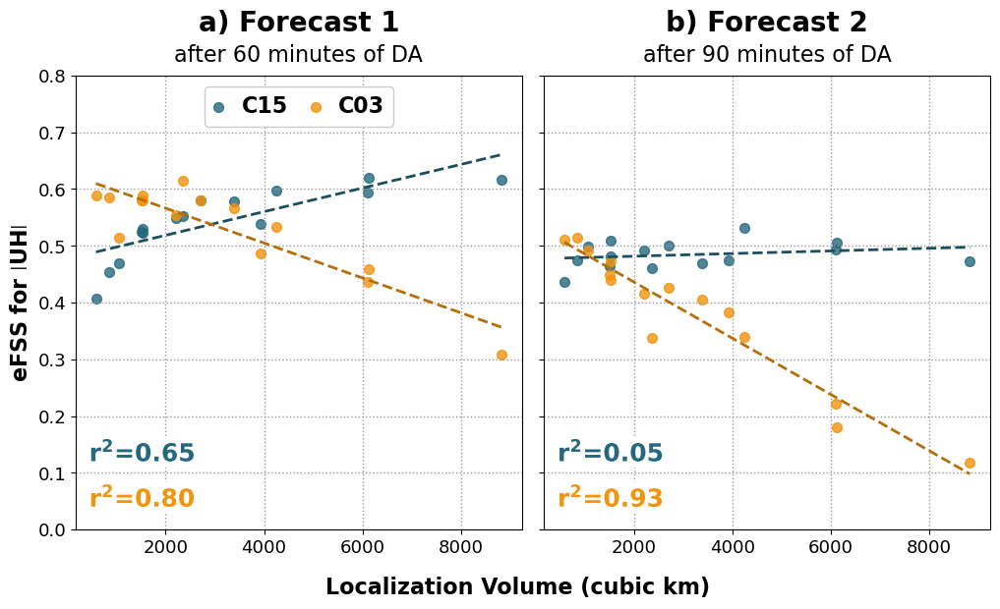

In [19]:

def plot_reg_quick(ax, varx, vary, color):
    varx = varx[np.isnan(varx) == False]
    vary = vary[np.isnan(vary) == False]
    slope1, intercept1, rvalue1, pval, stderr = scipy.stats.linregress(varx, vary)
    a1x = np.linspace(np.nanmin(varx)-.001, np.nanmax(varx)+.001, 3)
    ax.plot(a1x, slope1*a1x+intercept1, color=color, linestyle='--',lw=2, alpha=1)
    return rvalue1, slope1


fig, axes = plt.subplots(1,2, figsize=(12,6), sharex=True, sharey=True)


colors = cmaps.pride([0.2, 0.6, 0.75])

for ci, cint in enumerate([15,3]):

    fpaths = sorted([f for f in glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{cint:02d}*") if len(os.path.basename(f)) == 10 ])

    temp = np.zeros((2, len(fpaths)*len(fcsts)))

    for fi,f in enumerate(fpaths):


        for fc, fcst in enumerate(['FORECAST_20240508_2100', '']):
            
       
            

            name = rename(os.path.basename(f), version='full')
                    
            h = float(name.split('-')[1][1:])
            v = float(name.split('-')[2][1:])
            volume = (4/3)*np.pi*v*h*h

            temp[0, fi + (fc*len(fpaths))] = volume
        
        
        
            var = 'uh2to5'# allvar[i]
            thresh=100 #allthresh[i]
    
        
            ds = xr.open_dataset(os.path.join(f, fcst, f'fss_{var}.nc' ))
            neighborhoods = ds.SCALES.values*1000
            th_i = findnearest(ds.FCST_THLDS[0].values, thresh)
            n_i  = findnearest(neighborhoods, 24)
            CSI = np.mean(ds.EFSS[:,n_i, th_i].values)
            ds.close()

            axes[fc].scatter(volume, CSI, marker = 'o', color=colors[ci], s=50, alpha=0.8, label=os.path.basename(f).split('_')[0])


            temp[1, fi + (fc*len(fpaths))] = CSI
             
    for fc in range(len(fcsts)):
        darkened_color = darken_rgba_color(*colors[ci], factor=0.25)
        
        r1,s1 = plot_reg_quick(axes[fc],temp[0, 0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[1,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)
        #r2,s2 = plot_reg_quick(axes[fc],temp[0,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], temp[2,0+len(fpaths)*(fc):len(fpaths)*(fc+1)], darkened_color)

        shift = .1 * ci
        axes[fc].text(.03, .15-shift, r'r$\mathbf{^2}$='+f'{r1**2:.2f}', transform=axes[fc].transAxes, fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=10, foreground='w'),path_effects.Normal()])
        #axes[1,fc].text(.03, .15-shift, r'r$\mathbf{^2}$='+f'{r2**2:.2f}', transform=axes[1,fc].transAxes, fontsize=18, weight='bold',color=colors[ci],path_effects =[path_effects.Stroke(linewidth=10, foreground='w'),path_effects.Normal()])


for ax in axes.flatten():
    ax.grid()
    ax.set_ylim(0,0.8)
    
axes[0].set_ylabel(r'eFSS for $\mathbf{\left| {UH} \right|}$',   weight='bold',fontsize=16)

handles, labels = axes[0].get_legend_handles_labels()
unique_items = dict(zip(labels, handles))
axes[0].legend(unique_items.values(), unique_items.keys(), loc='upper center', ncol=4,prop={'size':16, 'weight':'bold'} , columnspacing=1, handlelength=.5)


fig.text(0.5, 0.0, 'Localization Volume (cubic km)', weight='bold', fontsize=16, ha='center')

plt.subplots_adjust(hspace=0.05, wspace=0.05)

#axes[1].set_xlim(0.006, 0.038)
axes[0].set_title('a) Forecast 1', weight='bold',fontsize=20, y=1.08)
axes[1].set_title('b) Forecast 2', weight='bold',fontsize=20, y=1.08)

axes[0].text(0.5, 1.03, 'after 60 minutes of DA', fontsize=16, ha='center', transform=axes[0].transAxes)
axes[1].text(0.5, 1.03, 'after 90 minutes of DA', fontsize=16, ha='center', transform=axes[1].transAxes)


# FIGNAME = 'BothForecastRegression'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

# Northern Cell - RMSE

In [10]:

def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y

    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-10)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy)

    if Y1 - Y0 == 33:
        Y1+=1
    return X0, X1, Y0, Y1

for time in [30, 90, 120, 180]:

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)

    print(Y1-Y0)

NameError: name 'df' is not defined

In [12]:

xo = [110.45,119.44,127.37,135.23,143.35,152.30,162.22,167.81,175.32,183.82,192.07,198.00,206.13,214.24,221.45]
yo = [139.09,145.44,151.89,158.11,165.17,172.88,180.03,205.74,215.34,229.05,239.25,250.30,261.00,270.26,282.31]

stormx = np.interp(np.arange(30, 180, 1), np.arange(30, 180, 10), xo)
stormy = np.interp(np.arange(30, 180, 1), np.arange(30, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(30, 180, 1), columns = ['X','Y'])


def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y

    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx-10)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy)

    if Y1 - Y0 == 33:
        Y1+=1
    return X0, X1, Y0, Y1
    

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]


vols = []

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
       # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr
        vols.append(volume)
vols = sorted(vols)


CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'cdbz'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 30), findnearest(atime, 120)+1
            #if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df1 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df2 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})       

#NR.close()



CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'u'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 30), findnearest(atime, 120)+1
            #if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])

    
            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df3 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df4 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})      


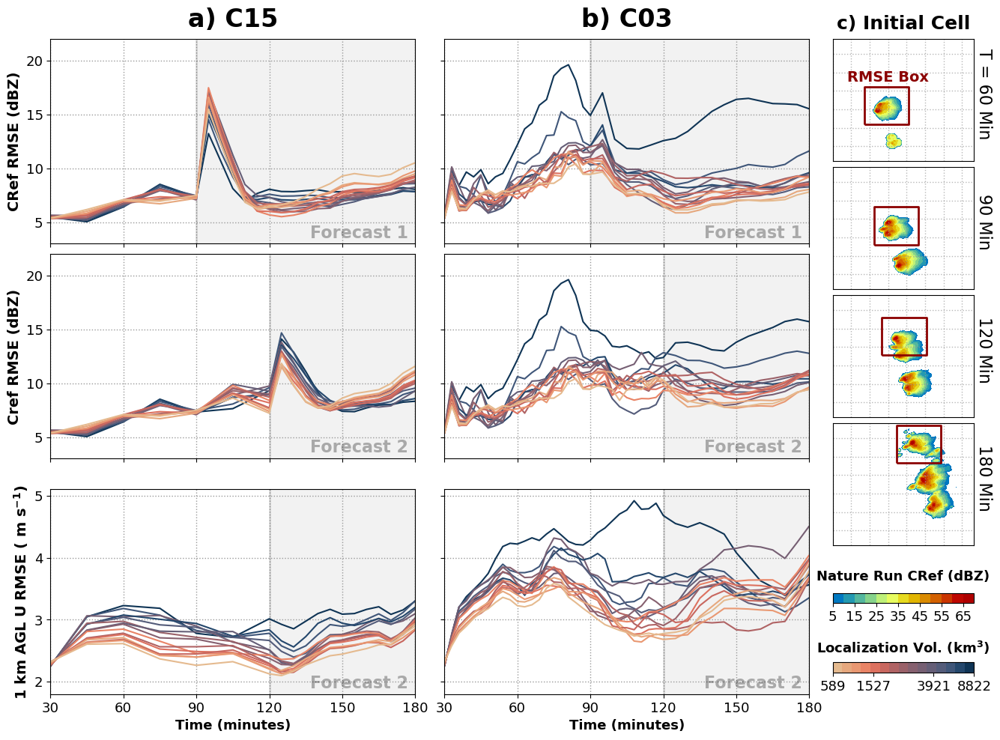

In [16]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create figure
fig = plt.figure(figsize=(16, 11))

# Outer grid: 1 row, 2 columns (left = 2x3, right = 5x1)
outer = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.04)

# # LEFT: 2x3 grid
# left_gs = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

# axes = np.empty((3, 3), dtype=object)
# for i in range(3):
#     for j in range(3):
#         if i == 0 and j == 0:
#             ax = fig.add_subplot(left_gs[i, j])
#         else:
#             ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
#         axes[i, j] = ax
#         axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
#         axes[i,j].label_outer()
#         axes[i,j].grid()


# LEFT: 2x3 grid
left_gs = gridspec.GridSpecFromSubplotSpec(3,2, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

axes = np.empty((3, 2), dtype=object)
for i in range(3):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(left_gs[i, j])
        else:
            ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
        axes[i, j] = ax
        axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
        axes[i,j].label_outer()
        axes[i,j].grid()



# RIGHT: 5x1 grid
right_gs = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=outer[1], hspace=0.05)

right_axes = []
for i in range(5):
    ax = fig.add_subplot(right_gs[i, 0])
    ax.set_aspect('equal')
    right_axes.append(ax)


for ti, time in enumerate([60, 90, 120, 180]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    # myx, myy = xh[X0: X1], yh[Y0: Y1]
    # im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')


    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    im = right_axes[ti].contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5))

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    right_axes[ti].plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='darkred', lw=2)
    

    right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].grid(ls=':', alpha=0.7)
    right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].tick_params(left=False, bottom=False)

    # right_axes[ti].set_xlim(myx.min(), myx.max())
    # right_axes[ti].set_ylim(myy.min(), myy.max())

    right_axes[ti].set_ylim(10, 340)

    add = ''
    if ti == 0: add='T = '
    
    right_axes[ti].text(410, np.mean(yh), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

right_axes[0].set_title('c) Initial Cell', y=1.03)  
#add_scale(right_axes[0], xstart=200, xlength=100, y=250, text_bump = 10)


plt.draw()


for ax in axes[2:,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.025#*(i+1)
    pos.y1 = pos.y1 -.025#*(i+1)
    ax.set_position(pos)
fig.canvas.draw()


for i, ax in enumerate(axes.flatten()):
    if i in [0,1]:
        ax.axvspan(90,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(90, color='k', alpha=0.1, lw=2)
    else:
        ax.axvspan(120,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(120, color='k', alpha=0.1, lw=2)
        
    #ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.set_xlim(30, 180)


for ax in axes[-1,:]:
    ax.set_xticks([30,60,90,120,150,180], [30,60,90,120,150,180],)


#colors = ctables.REF_default(np.linspace(0,1,15))
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
cmap1 = LinearSegmentedColormap.from_list("CR",colors, 15)


for fi, freq in enumerate([15, 3]):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=24,  y=1.03)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

    
            #if count % 2 == 0:
        

            exp1 = df1[(df1.CI == freq) & (df1.H == h) & (df1.V == v)]
            exp2 = df2[(df2.CI == freq) & (df2.H == h) & (df2.V == v)]

            myc = colors[exp1.VI.values[0]]#

            axes[0, fi].plot(exp1.TIME, exp1.RMSE, color=myc, label=exp1.VOL.values[0])
            axes[1, fi].plot(exp2.TIME, exp2.RMSE, color=myc, label=exp2.VOL.values[0])


            #exp3 = df3[(df3.CI == freq) & (df3.H == h) & (df3.V == v)]
            exp4 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            #axes[2, fi].plot(exp3.TIME, exp3.RMSE, color=myc, label=exp3.VOL.values[0])
            axes[2, fi].plot(exp4.TIME, exp4.RMSE, color=myc, label=exp4.VOL.values[0])

            count +=1
                



######## reflectivity colorbar

right_axes[-1].axis('off')
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

cbar_ax = fig.add_axes([X0, Y - 0.07, bbox.width, 0.012])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_xlabel('Nature Run CRef (dBZ)', labelpad=-52, fontsize=13)



######## volume colorbar
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

buff = 0.01
cbar_ax2 = fig.add_axes([X0, Y - 0.07*2.2, bbox.width, 0.012])

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cbar = fig.colorbar(mappable, cax=cbar_ax2, orientation='horizontal' )
cbar.ax.set_xlabel(r'Localization Vol. (km$\mathbf{^3}$)', labelpad=-52, fontsize=13)
cbar.set_ticks(ticks=[0, 4, 10, 14], labels=[vols[0], vols[4], vols[10], vols[14]]);



### set axes limits
axes[0,0].set_ylim(3, 22)
axes[1,0].set_ylim(3, 22)
axes[2,0].set_ylim(1.8, 5.1)
axes[2,0].set_yticks([2,3,4,5],[2,3,4,5])


axes[0, 0].set_ylabel('CRef RMSE (dBZ)',               fontsize=14)
axes[1, 0].set_ylabel('Cref RMSE (dBZ)',               fontsize=14)
axes[2, 0].set_ylabel(r'1 km AGL U RMSE ( m s$\mathbf{^{-1}}$)',fontsize=14)

for ai, ax in enumerate(axes[:,0]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)
for ai, ax in enumerate(axes[:,1]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)


right_axes[0].text(40, 225, 'RMSE Box', weight='bold', fontsize=14, color='darkred')

for ax in axes[-1,:]: ax.set_xlabel('Time (minutes)', weight='bold', y=-0.1)


# FIGNAME = 'NStormRMSE'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

# Southern Cell - RMSE 

In [219]:
# southern storm dataframe 


### Southern Storm 

xo = [161.0,170.2,179.0,188.3,195.0,204.1,211.5,221.2,231.3,241.7,253.8,266.1,276.6]
yo = [61.0,69.7,76.9,83.2,89.6,88.2,93.5,97.1,101.,105.,110.,115.,119.]

stormx = np.interp(np.arange(54, 180, 1), np.arange(54, 180, 10), xo)
stormy = np.interp(np.arange(54, 180, 1), np.arange(54, 180, 10), yo)

df = pd.DataFrame(np.array([stormx, stormy]).T, index= np.arange(54, 180, 1), columns = ['X','Y'])


def get_storm_buffer(df, time):

    bufy = 50
    bufx = 80

    try:
        x0 = df.loc[time].X 
        y0 = df.loc[time].Y
    except:
        x0 = df.X.values[0]
        y0 = df.Y.values[0]

    if time == 180:
        x0 = df.iloc[-1].X 
        y0 = df.iloc[-1].Y


    X0, X1 = findnearest(xh, x0-bufx+30), findnearest(xh, x0+bufx)
    Y0, Y1 = findnearest(yh, y0-bufy),    findnearest(yh, y0+bufy-10)
    return X0, X1, Y0, Y1
    

NR = xr.open_dataset('/work/jessica.mcdonald/CM1_LETKF_2025/experiments/Processed_VerificationVars.nc')
NR = NR.rename({'UH2-5km':"UH_2-5km"})
NRtime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in NR.dates.values[:]]


vols = []

hloc = [18, 15, 12, 9, 7]
vloc = [6,4,2]
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
       # path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C15_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr
        vols.append(volume)
vols = sorted(vols)


CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'cdbz'#'w'#'cdbz'
#VARIABLE = 'dbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 52), findnearest(atime, 120)+1
            if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, :, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     :, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df1 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df2 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})       

#NR.close()



CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


VARIABLE = 'u'#'w'#'cdbz'
HEIGHT = 1

for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):

        name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
        hr = float(name.split('-')[1][1:])
        vr = float(name.split('-')[2][1:])
        volume = (4/3)*np.pi*vr*hr*hr

        
        for fi, freq in enumerate([15, 10, 3]):

            
            # analysis RMSE - do until 120 minutes
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
            anl = xr.open_dataset(path, decode_timedelta=True)
            xh, yh = anl.xh.values, anl.yh.values
    
            atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
            t0, t1 = findnearest(atime, 52), findnearest(atime, 120)+1
            if atime[t0] < 52: t0+=1

            RMSE_anl = []

            for time in atime[t0:t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                # ref rmse
                if 'nk' in anl[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
                RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            anl.close()



            ### fcst 1 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

            RMSE_fcst1 = []

            for time in ftime1[ft0:ft1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

            cm1.close()



            ### fcst 2 RMSE
            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
            cm1 = xr.open_dataset(path, decode_timedelta=True)
            ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
            f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

            RMSE_fcst2 = []

            for time in ftime2[f2t0:f2t1]:

                X0, X1, Y0, Y1 = get_storm_buffer(df, time)

                 # ref rmse
                if 'nk' in cm1[VARIABLE].dims:
                    zi = findnearest(anl.z, HEIGHT)
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, zi, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     zi, Y0:Y1, X0:X1].values
                else:
                    ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
                    ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

                RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
            cm1.close()
            

            # analysis and fcst 1

            time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
            time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

            data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
            data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


            CI1.extend([freq]*len(time1))
            H1.extend([h]*len(time1))
            V1.extend([v]*len(time1))
            VOLUME1.extend([volume]*len(time1))
            vi1.extend([findnearest(vols, volume)]*len(time1))
            RMSE1.extend(data1)
            TIME1.extend(time1)

            CI2.extend([freq]*len(time2))
            H2.extend([h]*len(time2))
            V2.extend([v]*len(time2))
            VOLUME2.extend([volume]*len(time2))
            vi2.extend([findnearest(vols, volume)]*len(time2))
            RMSE2.extend(data2)
            TIME2.extend(time2)
            
            
df3 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
df4 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})      

In [166]:
# CI1, TIME1, H1, V1, VOLUME1,vi1, RMSE1 = [],[],[],[],[],[],[]
# CI2, TIME2, H2, V2, VOLUME2,vi2, RMSE2 = [],[],[],[],[],[],[]


# VARIABLE = 'cdbz'#'w'#'cdbz'
# VARIABLE = 'dbz'
# HEIGHT = 1

# for hi, h in enumerate(hloc):
#     for vi, v in enumerate(vloc):

#         name = rename(f'C15_H{h:02d}_V{v}', version='full')
                            
#         hr = float(name.split('-')[1][1:])
#         vr = float(name.split('-')[2][1:])
#         volume = (4/3)*np.pi*vr*hr*hr

        
#         for fi, freq in enumerate([15, 10, 3]):

            
#             # analysis RMSE - do until 120 minutes
#             path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_analysis.nc")[0]
#             anl = xr.open_dataset(path, decode_timedelta=True)
#             xh, yh = anl.xh.values, anl.yh.values
    
#             atime = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in anl.time.values]
#             t0, t1 = findnearest(atime, 52), findnearest(atime, 120)+1
#             if atime[t0] < 52: t0+=1

#             RMSE_anl = []

#             for time in atime[t0:t1]:

#                 X0, X1, Y0, Y1 = get_storm_buffer(df, time)

#                 # ref rmse
#                 if 'nk' in anl[VARIABLE].dims:
#                     zi = findnearest(anl.z, HEIGHT)
#                     ref_ens = anl[VARIABLE][findnearest(atime, time), -1, :, Y0:Y1, X0:X1].values
#                     ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    :, Y0:Y1, X0:X1].values
#                 else:
#                     ref_ens = anl[VARIABLE][findnearest(atime, time), -1, Y0:Y1, X0:X1].values
#                     ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),    Y0:Y1, X0:X1].values

            
#                 RMSE_anl.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

#             anl.close()



#             ### fcst 1 RMSE
#             path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/F*/full_ens_fcst.nc")[0]
#             cm1 = xr.open_dataset(path, decode_timedelta=True)
#             ftime1 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
#             ft0, ft1 = findnearest(ftime1, 90), findnearest(ftime1, 180)+1

#             RMSE_fcst1 = []

#             for time in ftime1[ft0:ft1]:

#                 X0, X1, Y0, Y1 = get_storm_buffer(df, time)

#                 if 'nk' in cm1[VARIABLE].dims:
#                     zi = findnearest(anl.z, HEIGHT)
#                     ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, :, Y0:Y1, X0:X1].values
#                     ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     :, Y0:Y1, X0:X1].values
#                 else:
#                     ref_ens = cm1[VARIABLE][findnearest(ftime1, time), -1, Y0:Y1, X0:X1].values
#                     ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

#                 RMSE_fcst1.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))

#             cm1.close()



#             ### fcst 2 RMSE
#             path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/C{freq:02d}_H{h:02d}_V{v}/full_ens_fcst.nc")[0]
#             cm1 = xr.open_dataset(path, decode_timedelta=True)
#             ftime2 = [(pd.to_datetime(t) - dt.datetime(2024, 5, 8, 19, 30)).seconds/60 for t in cm1.time.values]
    
#             f2t0, f2t1 = findnearest(ftime2, 120), findnearest(ftime2, 180)+1

#             RMSE_fcst2 = []

#             for time in ftime2[f2t0:f2t1]:

#                 X0, X1, Y0, Y1 = get_storm_buffer(df, time)

#                  # ref rmse
#                 if 'nk' in cm1[VARIABLE].dims:
#                     zi = findnearest(anl.z, HEIGHT)
#                     ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, :, Y0:Y1, X0:X1].values
#                     ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     :, Y0:Y1, X0:X1].values
#                 else:
#                     ref_ens = cm1[VARIABLE][findnearest(ftime2, time), -1, Y0:Y1, X0:X1].values
#                     ref_NR  =  NR[VARIABLE][findnearest(NRtime, time),     Y0:Y1, X0:X1].values

#                 RMSE_fcst2.append(np.sqrt(np.nanmean((ref_NR - ref_ens)**2)))
                
#             cm1.close()
            

#             # analysis and fcst 1

#             time1 = atime[t0:findnearest(atime, 90)]  + ftime1[ft0:ft1]
#             time2 = atime[t0:findnearest(atime, 120)] + ftime2[f2t0:f2t1]

#             data1 = np.concat([RMSE_anl[0: (findnearest(atime, 90) - t0)],  RMSE_fcst1])
#             data2 = np.concat([RMSE_anl[:-1], RMSE_fcst2])


#             CI1.extend([freq]*len(time1))
#             H1.extend([h]*len(time1))
#             V1.extend([v]*len(time1))
#             VOLUME1.extend([volume]*len(time1))
#             vi1.extend([findnearest(vols, volume)]*len(time1))
#             RMSE1.extend(data1)
#             TIME1.extend(time1)

#             CI2.extend([freq]*len(time2))
#             H2.extend([h]*len(time2))
#             V2.extend([v]*len(time2))
#             VOLUME2.extend([volume]*len(time2))
#             vi2.extend([findnearest(vols, volume)]*len(time2))
#             RMSE2.extend(data2)
#             TIME2.extend(time2)
            
            
# df1 = pd.DataFrame(data = {'CI': CI1,'TIME':TIME1, 'H':H1, 'V':V1, 'VOL':VOLUME1, 'VI': vi1, 'RMSE': RMSE1})
# df2 = pd.DataFrame(data = {'CI': CI2,'TIME':TIME2, 'H':H2, 'V':V2, 'VOL':VOLUME2, 'VI': vi2, 'RMSE': RMSE2})       

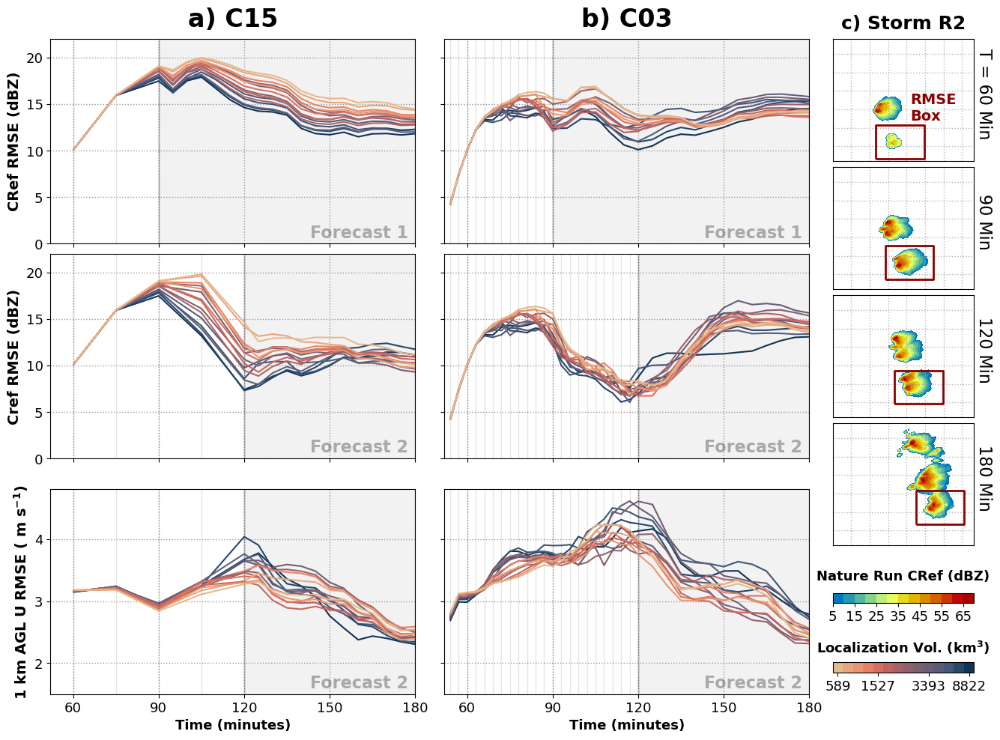

In [220]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create figure
fig = plt.figure(figsize=(16, 11))

# Outer grid: 1 row, 2 columns (left = 2x3, right = 5x1)
outer = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.04)

# # LEFT: 2x3 grid
# left_gs = gridspec.GridSpecFromSubplotSpec(3, 3, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

# axes = np.empty((3, 3), dtype=object)
# for i in range(3):
#     for j in range(3):
#         if i == 0 and j == 0:
#             ax = fig.add_subplot(left_gs[i, j])
#         else:
#             ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
#         axes[i, j] = ax
#         axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
#         axes[i,j].label_outer()
#         axes[i,j].grid()


# LEFT: 2x3 grid
left_gs = gridspec.GridSpecFromSubplotSpec(3,2, subplot_spec=outer[0], wspace=0.08, hspace=0.05)

axes = np.empty((3, 2), dtype=object)
for i in range(3):
    for j in range(2):
        if i == 0 and j == 0:
            ax = fig.add_subplot(left_gs[i, j])
        else:
            ax = fig.add_subplot(left_gs[i, j],sharex=axes[0, j] if i > 0 else None,sharey=axes[i, 0] if j > 0 else None)
        axes[i, j] = ax
        axes[i, j].yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}'))
        axes[i,j].label_outer()
        axes[i,j].grid()



# RIGHT: 5x1 grid
right_gs = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=outer[1], hspace=0.05)

right_axes = []
for i in range(5):
    ax = fig.add_subplot(right_gs[i, 0])
    ax.set_aspect('equal')
    right_axes.append(ax)


for ti, time in enumerate([60, 90, 120, 180]):

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    # myx, myy = xh[X0: X1], yh[Y0: Y1]
    # im = right_axes[ti].pcolormesh(myx, myy, ref, vmin=0, vmax=75,cmap=ctables.REF_default, shading='nearest')


    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    im=right_axes[ti].contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5))

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    right_axes[ti].plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='darkred', lw=2)
    

    right_axes[ti].set_xticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].set_yticks(np.arange(0, 400, 50),np.arange(0, 400, 50))
    right_axes[ti].grid(ls=':', alpha=0.7)
    right_axes[ti].xaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].yaxis.set_major_formatter(ticker.NullFormatter())
    right_axes[ti].tick_params(left=False, bottom=False)

    # right_axes[ti].set_xlim(myx.min(), myx.max())
    # right_axes[ti].set_ylim(myy.min(), myy.max())

    right_axes[ti].set_ylim(10, 340)

    add = ''
    if ti == 0: add='T = '
    
    right_axes[ti].text(410, np.mean(yh), f'{add}{time} Min', ha='center', va='center', rotation=-90, fontsize=16,)

right_axes[0].set_title('c) Storm R2', y=1.03)  
#add_scale(right_axes[0], xstart=200, xlength=100, y=250, text_bump = 10)


plt.draw()


for ax in axes[2:,:].flatten():
    pos = ax.get_position()
    pos.y0 = pos.y0 -.025#*(i+1)
    pos.y1 = pos.y1 -.025#*(i+1)
    ax.set_position(pos)
fig.canvas.draw()


for i, ax in enumerate(axes.flatten()):
    if i in [0,1]:
        ax.axvspan(90,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(90, color='k', alpha=0.1, lw=2)
    else:
        ax.axvspan(120,180, color='k', alpha=0.05, label='First Forecast')
        ax.axvline(120, color='k', alpha=0.1, lw=2)
        
    #ax.axvline(52, color='C3', alpha=0.9, lw=3, ls='--', label='Storm Initiation')
    ax.set_xlim(52, 180)


for ax in axes[-1,:]:
    ax.set_xticks([60,90,120,150,180], [60,90,120,150,180],)


#colors = ctables.REF_default(np.linspace(0,1,15))
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]



for fi, freq in enumerate([15, 3]):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=24,  y=1.03)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

    
            #if count % 2 == 0:
        

            exp1 = df1[(df1.CI == freq) & (df1.H == h) & (df1.V == v)]
            exp2 = df2[(df2.CI == freq) & (df2.H == h) & (df2.V == v)]

            myc = colors[exp1.VI.values[0]]#

            axes[0, fi].plot(exp1.TIME, exp1.RMSE, color=myc, label=exp1.VOL.values[0])
            axes[1, fi].plot(exp2.TIME, exp2.RMSE, color=myc, label=exp2.VOL.values[0])


            #exp3 = df3[(df3.CI == freq) & (df3.H == h) & (df3.V == v)]
            exp4 = df4[(df4.CI == freq) & (df4.H == h) & (df4.V == v)]

            #axes[2, fi].plot(exp3.TIME, exp3.RMSE, color=myc, label=exp3.VOL.values[0])
            axes[2, fi].plot(exp4.TIME, exp4.RMSE, color=myc, label=exp4.VOL.values[0])

            count +=1
                



######## reflectivity colorbar

right_axes[-1].axis('off')
bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

cbar_ax = fig.add_axes([X0, Y - 0.07, bbox.width, 0.012])
cbar = fig.colorbar(im, cax=cbar_ax, orientation='horizontal')
cbar.ax.set_xlabel('Nature Run CRef (dBZ)', labelpad=-52, fontsize=13)



######## volume colorbar
vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


bbox = right_axes[-2].get_position()
Y = bbox.y0
X0, X1 = bbox.x0, bbox.x0 + bbox.width

buff = 0.01
cbar_ax2 = fig.add_axes([X0, Y - 0.07*2.2, bbox.width, 0.012])

cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)
mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cbar = fig.colorbar(mappable, cax=cbar_ax2, orientation='horizontal' )
cbar.ax.set_xlabel(r'Localization Vol. (km$\mathbf{^3}$)', labelpad=-52, fontsize=13)
cbar.set_ticks(ticks=[0+.5, 4+.5, 9+.5, 14-.5], labels=[vols[0], vols[4], vols[9], vols[14]]);


### set axes limits
### set axes limits
axes[0,0].set_ylim(0, 22)
axes[1,0].set_ylim(0, 22)
axes[2,0].set_ylim(1.5, 4.8)
axes[2,0].set_yticks([2,3,4],[2,3,4])


axes[0, 0].set_ylabel('CRef RMSE (dBZ)',               fontsize=14)
axes[1, 0].set_ylabel('Cref RMSE (dBZ)',               fontsize=14)
axes[2, 0].set_ylabel(r'1 km AGL U RMSE ( m s$\mathbf{^{-1}}$)',fontsize=14)

for ai, ax in enumerate(axes[:,0]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)
for ai, ax in enumerate(axes[:,1]):
    ai = np.clip(ai, 0, 1)
    ax.text(0.98, 0.03, f'Forecast {ai+1}', ha='right', transform=ax.transAxes, fontsize=16, weight='bold', alpha=0.3)


right_axes[0].text(210, 120, 'RMSE\nBox', weight='bold', fontsize=14, color='darkred')

for ax in axes[-1,:]: ax.set_xlabel('Time (minutes)', weight='bold', y=-0.1)


    
# [axes[0,0].axvline(i, color='k', lw=1, alpha=0.1) for i in np.concatenate([np.arange(45, 90+3, 15), np.arange(90, 183, 5)])];
# [axes[0,1].axvline(i, color='k', lw=1, alpha=0.1) for i in np.concatenate([np.arange(45, 90+3, 3), np.arange(90, 183, 5)])];

[axes[0,0].axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(45, 90+3, 15)];
[axes[0,1].axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(45, 90+3, 3) ];

[axes[1,0].axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(45, 120+3, 15)];
[axes[1,1].axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(45, 120+3, 3) ];

[axes[2,0].axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(45, 120+3, 15)];
[axes[2,1].axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(45, 120+3, 3) ];

# for ax in axes[:, 1]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 10)]
# for ax in axes[:, 2]: [ax.axvline(i, color='k', lw=1, alpha=0.1) for i in np.arange(30, 120+3, 3)]




FIGNAME = 'SStormRMSE'
plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')


In [ ]:
# make gif for presentations

for ti, time in enumerate(np.arange(52, 181, 5)):

    fig, ax = plt.subplots(1,1, figsize=(5,4), subplot_kw={'aspect':'equal'})

    X0, X1, Y0, Y1 = get_storm_buffer(df, time)
    ref_NR  =  NR['cdbz'][findnearest(NRtime, time),     Y0:Y1, X0:X1].values
    xh, yh = NR.xh.values, NR.yh.values
    ref = np.where(ref_NR <5, np.nan, ref_NR)

    im=ax.contourf(xh, yh, NR['cdbz'][findnearest(NRtime, time)], cmap=ctables.REF_default, levels=np.arange(5, 75, 5), alpha=0.4, antialiased=True)

    im=ax.contourf(xh[X0:X1], yh[Y0:Y1], NR['cdbz'][findnearest(NRtime, time), Y0:Y1, X0:X1], cmap=ctables.REF_default, levels=np.arange(5, 75, 5), alpha=1, antialiased=True)

    xh0, xh1 = xh[X0], xh[X1]
    yh0, yh1 = yh[Y0], yh[Y1]

    ax.plot([xh0, xh0, xh1, xh1, xh0],[yh0, yh1, yh1,yh0, yh0], color='k', lw=2)

    myx, myy = xh[X0: X1], yh[Y0: Y1]
 
    ax.set_xticks(np.arange(0, 400, 100),np.arange(0, 400, 100))
    ax.set_yticks(np.arange(0, 400, 100),np.arange(0, 400, 100))
    ax.grid(ls=':', alpha=0.7)

    ax.set_ylim(0, 250)
    ax.set_xlim(50, 380)
    

    cbar_ax = fig.add_axes([0.92, 0.2, 0.03, 0.6])
    cbar = fig.colorbar(im, cax=cbar_ax, extend='both')
    cbar.set_label('Nature Run Cref (dBZ)', weight='bold')

    ax.set_xlabel('X (km)')
    ax.set_ylabel('Y (km)')
    ax.set_title(f'Time = {time} minutes', weight='bold', fontsize=18)
    

    plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/temp/NEW_sstorm_{time:03d}.png', dpi=300, bbox_inches='tight')
    plt.close()

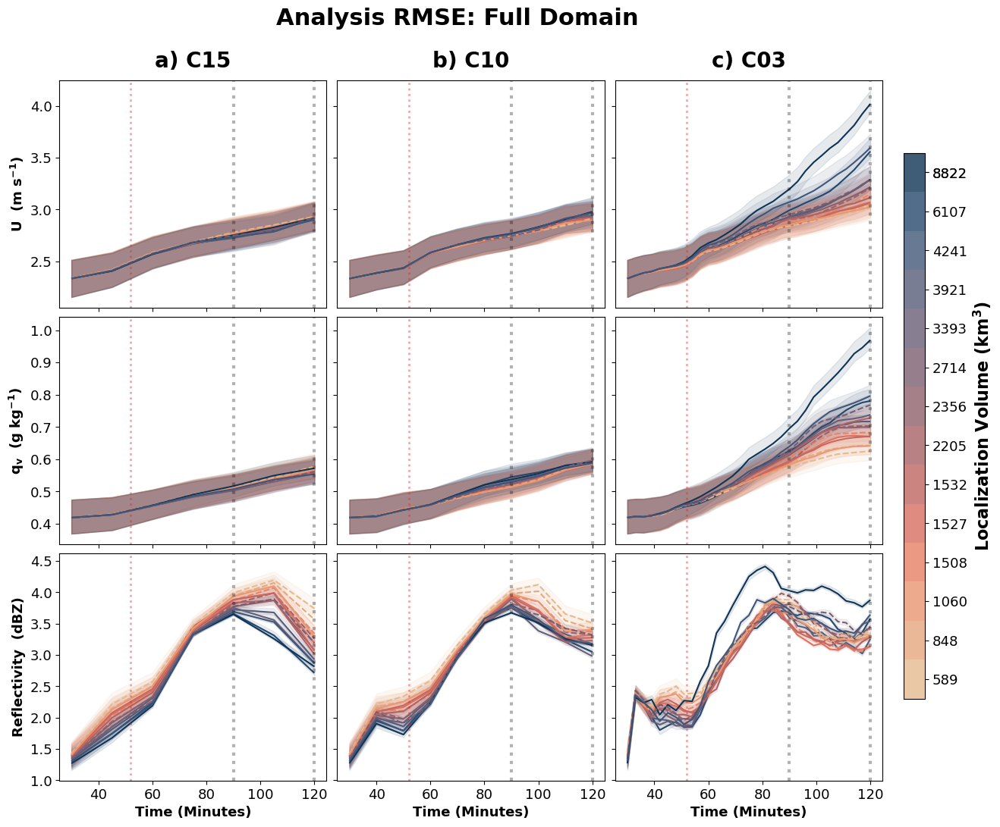

In [7]:
n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95


allvars = ['u_20dbz', 'qv_20dbz' ,'dbz_20dbz']

freq = [15, 10, 3]
hloc = [ 15, 12, 9, 7, 18]
vloc = [6,2, 4]


colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]
units   = {'u': r'm s$\mathbf{^{-1}}$', 'v': r'm s$\mathbf{^{-1}}$', 'w': r'm s$\mathbf{^{-1}}$', 'th':'K', 'qv': r'g kg$\mathbf{^{-1}}$', 'dbz':'dBZ','dbz_20dbz':'dBZ'}
titles  = {'u': 'U', 'v':'V', 'w': 'W', 'th':r'$\mathbf{\theta}$', 'qv': r'q$_{\mathbf{v}}$', 'dbz':'Reflectivity', 'dbz_20dbz':'Reflectivity'}


vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]


# mycols = [colors[findnearest(vols, df.vols_3.loc[i])] for i in df.index]


if len (freq) == 3:
    fig, axes = plt.subplots(len(allvars),3, figsize=(14, 12), sharey='row', sharex=True)
else:
    fig, axes = plt.subplots(len(allvars),4, figsize=(19, 12), sharey='row', sharex=True)




for fi, freq in enumerate(freq):
    axes[0, fi].set_title(chr(ord('`')+fi+1)+') '+f'C{freq:02d}', weight='bold', fontsize=20,  y=1.03)

    count = 0
        
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):

            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])

            path = glob.glob(f"/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/RMSE_all_members.nc")[0]
            ds = xr.open_dataset(path, decode_timedelta=True)
            time = ds.time.values

            color_i = colors[findnearest(vols, (4/3)*np.pi*vr*hr*hr)]

            ls = '-'
            if v == 2: ls = '--'


            for ai, a in enumerate(allvars):
                a = a.replace('_20dbz', '')
                axes[ai, fi].plot(time, ds[a].mean(axis=1), color=color_i, lw=1.5, ls=ls)

                #if (h == 18) &( v==4):

                    
                # if ((h == 18) &( v==6)) | ((h == 7) &( v==2)):
                        
                lower_bound = []
                upper_bound = []
                for ti, t in enumerate(time):
                    a_var = ds[a][ti,:-1].values
                    boot_metrics = bootstrap_singlevar(a_var, indices)
                    results = get_universal_bca(a_var, boot_metrics, np.mean(a_var), mode='single_var', operation='single')
                    lower_bound.append(results['Value']['lower_bound'])
                    upper_bound.append(results['Value']['upper_bound'])

                    
                    ci.append(compute_ci_perc(bootstrap_fss_from_indices(ds[a][ti,:-1].values, indices), interval))
                axes[ai, fi].fill_between(time, lower_bound, upper_bound, color=color_i, alpha=0.1, zorder=0,label='Control Run \n95% Confidence Interval')

                    

                    # ci = []
                    # for ti, t in enumerate(time):
                    #     ci.append(compute_ci_perc(bootstrap_fss_from_indices(ds[a][ti,:-1].values, indices), interval))
                    # axes[ai, fi].fill_between(time, ds[a].mean(axis=1) - ci, ds[a].mean(axis=1) + ci , color='k', alpha=0.2)
                    
                if fi == 0: axes[ai,0].set_ylabel( f"{titles[a.replace('_20dbz', '')]}  ({units[a.replace('_20dbz', '')]})")
                if ai == 2: axes[ai, fi].set_xlabel('Time (Minutes)', weight='bold')
                

    
            #if count % 2 == 0:

for ax in axes.flatten():
    ax.axvline(52, color='C3', ls=':', lw=2, alpha=0.4)
    ax.axvline(90,  color='k', lw=3, alpha=0.3, ls=':')
    ax.axvline(120, color='k', lw=3, alpha=0.3, ls=':')

#axes[0,0].set_ylim(6, 12)


cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)
mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])
cax = fig.add_axes([0.92, 0.2, 0.02, 0.6])
cbar = fig.colorbar( mappable, cax=cax, alpha=0.8)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)


cbar_ticks = np.array(np.arange(0, 15))
labels = [vols[i] for i in cbar_ticks]

cbar_ticks = np.concatenate([cbar_ticks[:-1] + 0.5, [13.5]])
cbar.set_ticks(ticks=cbar_ticks, labels=labels);


fig.suptitle('Analysis RMSE: Full Domain', fontsize=22, weight='bold', y=.96)

#fig.suptitle('Analysis RMSE: Where Nature Run > 20 dBZ', fontsize=22, weight='bold', y=.96)
plt.subplots_adjust(hspace=0.04, wspace=0.04)

#axes[0, 0].text(52, 0.95)

# Performance Diagrams

C15_H18_V6
C15_H09_V2
C03_H18_V6
C03_H09_V2
C15_H18_V6_fine
C15_H09_V2_fine
C03_H18_V6_fine
C03_H09_V2_fine


Text(0.5, 1.02, 'Mean 1-Hour Forecasts of\n2-5 km |UH| Objects > 100 m$^{-2}$ s$^{-2}$')

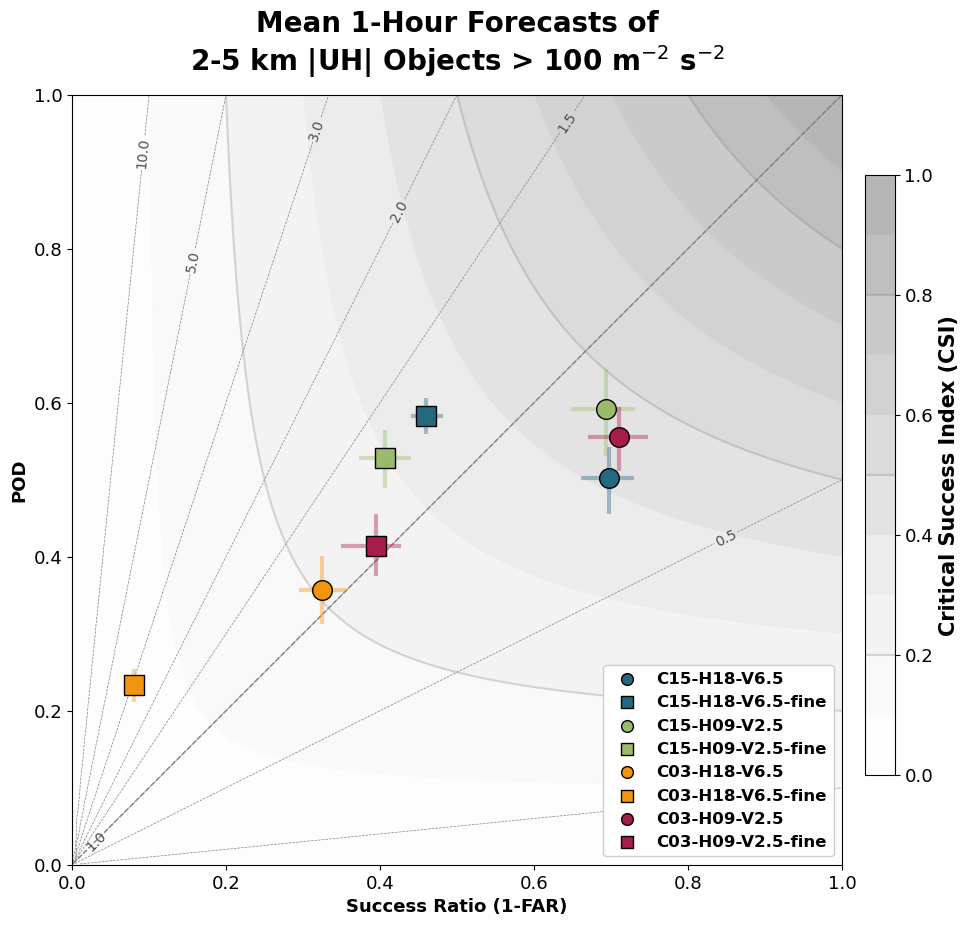

In [6]:

exps = [f'C{h:02d}_H15_V4' for h in [15,10,3]]
exps2 = [f'C{h:02d}_H09_V4' for h in [15,10,3]]
exps3 =[]
markers = ['o', 's', '']
leg_order = [0,3,1,4,2,5]
version='H'



# exps = [f'C{h:02d}_H09_V2' for h in [15,10,3]]
# exps2 = [f'C{h:02d}_H09_V4' for h in [15,10,3]]
# exps3 =[f'C{h:02d}_H09_V6' for h in [15,10,3]]
# markers = ['s', 'o', '^']
# leg_order = [0,3,6, 1,4,7, 2,5,8]
# version='V'

# exps = ['C03_H09_V4','C03_H18_V6','C10_H09_V4','C10_H18_V6','C15_H09_V4','C15_H18_V6']
# exps2 = ['C03_H09_V4_noAI','C03_H18_V6_noAI','C10_H09_V4_noAI','C10_H18_V6_noAI','C15_H09_V4_noAI','C15_H18_V6_noAI']


# exps = ['C03_H09_V4','C03_H18_V6'][::-1]
# exps2 = ['C03_H09_V4_noAI','C03_H18_V6_noAI'][::-1]

exps = ['C15_H18_V6','C15_H09_V2','C03_H18_V6','C03_H09_V2']
exps2 = ['C15_H18_V6_fine','C15_H09_V2_fine','C03_H18_V6_fine','C03_H09_V2_fine']#['C15_H09_V2','C15_H09_V2_fine' ]

exps3 =[]
markers = ['o', 's', '']
leg_order = np.array([[i,i+len(exps)] for i in range(len(exps))]).flatten()#[0,3, 1,4,2, 5]#[0,2,1,3]
version='fullx'

# exps = ['C03_H09_V2_fix','C10_H09_V6_fix','C15_H15_V6_fix']
# exps2 = ['C03_H09_V2_dense_fix','C10_H09_V6_dense_fix','C15_H15_V6_dense_fix']
# exps3=[]
# markers = ['o', 's', '']
# leg_order=[0,1,2,3,4,5]#[0,2,1,4,3,5]
# version='raw'



colors = cmaps.pride(np.linspace(.2, .8, len(exps)))
if len(exps) == 3: colors = list(cmaps.pride([.2, .75, .6]))

dist_thresh = 40

var = 'UH'
thresh = 100

# var = 'compdbz'
# thresh = 40


fcsts = ['FORECAST_20240508_2100', '']
fcsts = ['']
add=''
if dist_thresh!=40: add=f'_{dist_thresh}km'
    
fig, ax = plt.subplots(figsize=(10,10))

im = performance_diagram(ax, axis_labels=False, cax = fig.add_axes([0.92, 0.2, 0.03, 0.6]),cbar_fs=15)


exp_arr=[exps, exps2, exps3]

for mi, myexps in enumerate(exp_arr):
    for ei,exp in enumerate(myexps):

        print(exp)

        val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=fcsts)

        lower_err = abs(val_dct['POD'] - ci_dct['POD'][0])
        upper_err = abs(val_dct['POD'] - ci_dct['POD'][1])
        yerr = [lower_err, upper_err]

        lower_err = abs(val_dct['SR'] - ci_dct['SR'][0])
        upper_err = abs(val_dct['SR'] - ci_dct['SR'][1])
        xerr = [lower_err,upper_err]
        
        ax.errorbar(val_dct['SR'], val_dct['POD'], xerr=xerr, yerr=yerr, color=colors[ei],elinewidth=3,capsize=0, alpha=0.4)
        ax.scatter(val_dct['SR'], val_dct['POD'], facecolor=colors[ei], edgecolor='k', marker=markers[mi],s=200, zorder=100, label=rename(exp, version=version))


        
h, l =ax.get_legend_handles_labels()
ax.legend([h[i] for i in leg_order],[l[i] for i in leg_order], ncol=1, loc='lower right', markerscale=0.6, columnspacing=1, prop={'size':12, 'weight':'bold'})
ax.set_xlabel('Success Ratio (1-FAR)')
ax.set_ylabel('POD')


if var == 'UH':
    tvar = '2-5 km |UH|'
    units = r'm$^{-2}$ s$^{-2}$'

if var == 'compdbz':
    tvar = 'Composite Ref'
    units = r'dBZ'

ax.set_title(f'Mean 1-Hour Forecasts of\n{tvar} Objects > {thresh} {units}', weight='bold', y=1.02, fontsize=20)

# ax.set_xlim(.2, 1)
# ax.set_ylim(.3, 1)

# FIGNAME = 'VPerformance'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

# Adaptive Inflation Stuff

IndexError: list index out of range

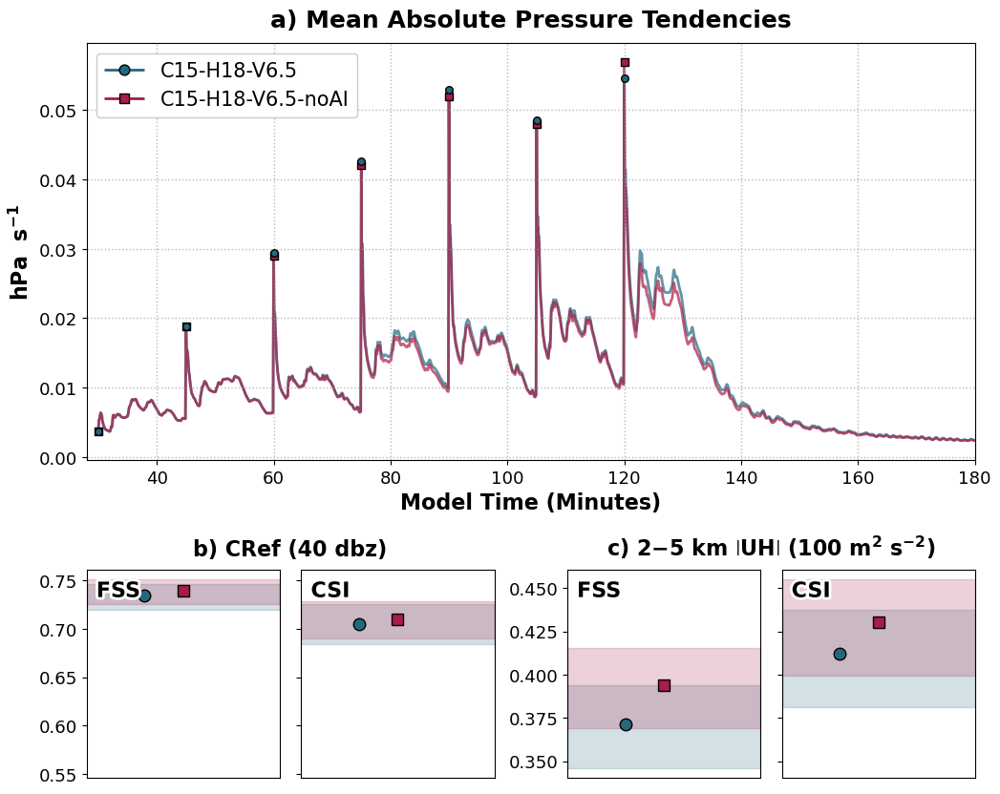

In [66]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# # Create figure
fig = plt.figure(figsize=(12, 10))

# Define GridSpec: 2 rows, 4 columns
gs = gridspec.GridSpec(nrows=2,ncols=4,height_ratios=[2, 1], hspace=0.35)
# Top large subplot (spans all 4 columns)
ax = fig.add_subplot(gs[0, :])

# Bottom 4 subplots
axes = []
for i in range(4):
    if (i == 1) | (i == 3): a = fig.add_subplot(gs[1, i], sharey = axes[-1])
    else: a = fig.add_subplot(gs[1, i])
    axes.append(a)


#use for the noAI plot
exps = ['C03_H18_V6','C03_H18_V6_noAI','C03_H09_V6']

exps = ['C15_H09_V4','C15_H09_V4_noAI']

exps = ['C15_H18_V6','C15_H18_V6_noAI']
version = 'Fullx'


colors = list(cmaps.pride([0.2, 0.8, 0.65]))
markers = ['o', 's', 'D', 'H','^', '>', '<', 'v']
ms     = 9

ls     = ['-']* len(exps)
members = np.arange(0, 36, 1)
fpath = f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'


for i,exp in enumerate(exps): 

    freq, dalen = int(exp[1:3]) * 60, 90*60
    peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) 

    wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
    i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
    time = wtg.time.values[i0:]
    pten = wtg.divc.values[i0:].mean(axis=1)/100     

    #### PRESSURE TENDENCY
    scat = ax.scatter(time[peaks], pten[peaks],s=30,marker=markers[i], color=colors[i], zorder=100*(10-i), ec='k',label=rename(exp, version=version))
    ax.plot(time, pten,  color=colors[i], lw=2,label=rename(exp, version=version), alpha=0.7, zorder=1, ls=ls[i])#, zorder=100*(10-i))
   

l, h = [],[]
for i, exp in enumerate(exps):
    h.append(mpl.lines.Line2D([0], [0], color=colors[i], linewidth=2, marker=markers[i],  markeredgecolor='k', linestyle=ls[i]))
    l.append(rename(exp, version=version))
ax.legend(handles=h, labels=l,fontsize=15, loc=2, markerscale=1.3)

ax.set_xlim(28, 180)


ax.set_title("a) Mean Absolute Pressure Tendencies", weight='bold', y=1.02, fontsize=18)
ax.set_xlabel('Model Time (Minutes)', fontsize=16)
ax.set_ylabel(r"hPa  s$\mathbf{^{-1}}$", fontsize=16);
ax.grid(ls=':', alpha=0.7)

#######################################################


values = np.zeros([len(exps), 4])
cibars = np.zeros([len(exps),2, 4])

fcsts = ['FORECAST_20240508_2100', '']

fcsts=['']

for ei, exp in enumerate(exps):
    
    fss_vals, lower, upper = generate_CI_FSS(exp, 'compdz', neighborhood=24, thresh=40, fcsts=fcsts)
    values[ei, 0] = fss_vals
    cibars[ei,0, 0] = lower
    cibars[ei,1, 0] = upper

    val_dct, ci_dct = generate_CI_contigency(exp,'compdbz', fcsts=fcsts)
    values[ei, 1] = val_dct['CSI'][0]
    cibars[ei, 0, 1] = ci_dct['CSI'][0]
    cibars[ei, 1, 1] = ci_dct['CSI'][1]

    fss_vals, lower, upper = generate_CI_FSS(exp, 'uh2to5', neighborhood=24, thresh=100, fcsts=fcsts)
    values[ei, 2] = fss_vals
    cibars[ei,0, 2] = lower
    cibars[ei,1, 2] = upper

    val_dct, ci_dct = generate_CI_contigency(exp,'UH', fcsts=fcsts)
    values[ei, 3] = val_dct['CSI'][0]
    cibars[ei, 0, 3] = ci_dct['CSI'][0]
    cibars[ei, 1, 3] = ci_dct['CSI'][1]

    # values[ei, 3] = val_dct['CSI']
    # cibars[ei, 3] = ci_dct['CSI']
    

for i, ax in enumerate(axes):
    for ei in range(len(exps)):

        name = rename(exps[ei], version='FULLX')
        #yerr = abs(np.array([cibars[ei, 0,i]-values[ei,i], cibars[ei, 1,i]-values[ei,i]])).T

        yerr = abs(np.array([[cibars[ei, 0,i]-values[ei,i]], [cibars[ei, 1,i]-values[ei,i]]]))

        
        #ax.errorbar(ei, values[ei,i], yerr=yerr, marker='s', ms=0,mec='k', lw=0,color=colors[ei], elinewidth=4,capsize=0,alpha=0.7)

        ax.axhspan(cibars[ei,0,i],cibars[ei,1,i],color=colors[ei], alpha=0.2, label='95% Confidence Interval')
        ax.plot(    ei, values[ei,i],                 marker=markers[ei], color=colors[ei], markersize=ms,markeredgecolor='k', linewidth=0, alpha=1, label=name)
        ax.set_xlim(-1.5, 3.5)


plt.draw()
### configure bottom plots
small_ls = ['FSS', 'CSI', 'FSS', 'CSI']

for i,ax in enumerate(axes):
    ax.set_xticks([])
    ax.text(0.05, .95, small_ls[i], ha='left', va='top', transform = ax.transAxes, fontsize=16, weight='bold',path_effects =[path_effects.Stroke(linewidth=4, foreground='w'),path_effects.Normal()])


    if i in [1,2]:
        pos = ax.get_position()
        pos.x0 = pos.x0 -.015 + 0.015*2*(i-1)
        pos.x1 = pos.x1 -.015 + 0.015*2*(i-1)
        ax.set_position(pos)
    if i in [1,3]:
        ax.tick_params(labelleft=False)      
fig.canvas.draw()     

units = r'm$\mathbf{^{2}}$ s$\mathbf{^{-2}}$'
tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'

for i in [0, 2]:
    pos = axes[i].get_position()
    pos2 = axes[i+1].get_position()

    x1 = pos.x0 + pos.width
    x2 = pos2.x0

    text = f'c) {tvar} (100 {units})'
    if i == 0: text = 'b) CRef (40 dbz)'

    fig.text((x1+x2)/2, pos.y1+.015, text, ha='center', fontsize=16, weight='bold')
    

axes[0].scatter(-1.5, np.nanmean(values[0]), marker='|', linewidth=4, s=200, color='w', alpha=0.7, label='95% Confidence Interval')
handles, labels =axes[0].get_legend_handles_labels()

#new_handles,new_labels = [handles[0],handles[1],handles[2]], [labels[0], labels[1],labels[2]]

order = [1,3,5,0]
leg=fig.legend(handles=[handles[i] for i in order],labels=[labels[i] for i in order],  fontsize=14, scatterpoints=3, markerscale=1., loc='lower center', bbox_to_anchor=(0.51,0.04), ncol=4, columnspacing=1.5, handletextpad=.3, handlelength=1.5)
leg.legend_handles[3].set_color('gray')

#xt, yt = centered_on_axes(axes, 3, version='on')

bbox1 = axes[3].get_position()
xloc = bbox1.x0 + bbox1.width
xt, yt = xloc, bbox1.y0 + (bbox1.height/2)

fig.text(xt+.02, yt, r'2$^{\mathregular{nd}}$ Forecast Only', ha='center', va='center', rotation=-90,  fontsize=16);


# tvar = r'2$\mathbf{-}$5 km $\mathbf{\left| {UH} \right|}$'
# units = r'm$^\mathbf{{-2}}$ s$\mathbf{^{-2}}$'


# FIGNAME = 'AIvsNoAI'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

In [58]:

c = 3
fpath = '/work/jessica.mcdonald/CM1_LETKF_2025/experiments/'

all_ptens = []
lower_bound = []
upper_bound = []
exps = []
for hi, h in enumerate(hloc):
    for vi, v in enumerate(vloc):
        exp = f'C{c:02d}_H{h:02d}_V{v}'

        # freq, dalen = int(exp[1:3]) * 60, 90*60
        # peaks = (np.arange(0,dalen+freq/2, freq )/6).astype(int) 
    
        wtg = xr.open_dataset(f'{fpath}{exp}/balance.nc')
        i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
        time = wtg.time.values[i0:]
        pten = wtg.divc.values[i0:].mean(axis=1)/100     
        all_ptens.append(pten)
        exps.append(exp)

        t1 = []
        t2 = []
        for ti,t in enumerate(time):

            a_var= wtg.divc.values[ti, :]/100
            
            boot_metrics = bootstrap_singlevar(a_var, indices)
            results = get_universal_bca(a_var, boot_metrics, np.mean(a_var), mode='single_var', operation='single')
            t1.append(results['Value']['lower_bound'])
            t2.append(results['Value']['upper_bound'])
        lower_bound.append(t1)
        upper_bound.append(t2)

        



df = pd.DataFrame(data = np.array(all_ptens).T, index=time, columns = exps)

for ei,exp in enumerate(exps):
    df[f'{exp}_lower'] = lower_bound[ei]
    df[f'{exp}_upper'] = upper_bound[ei]

In [72]:
wtg = xr.open_dataset(f'{fpath}C15_H18_V6_noAI/balance.nc')
i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
time = wtg.time.values[i0:]
pten = wtg.divc.values[i0:].mean(axis=1)/100   


wtg = xr.open_dataset(f'{fpath}C15_H18_V6/balance.nc')
i0=findnearest(wtg.time.values, 30) # this will be zero if you used a "pre cooked" set up
time = wtg.time.values[i0:]
pten2 = wtg.divc.values[i0:].mean(axis=1)/100  

print(np.mean(pten2/pten))

1.0316260784916553


In [61]:
diffs = []
for ei,exp in enumerate(exps):

    #plt.plot(df.index, df[exp] - pten)

    diff = abs(df[exp].mean() - pten.mean())
    print(exp, diff )
    diffs.append(diff)

sorted(diffs)

C03_H15_V6 0.002913874284919876
C03_H15_V2 0.0011818687122617695
C03_H15_V4 0.0007234979323969444
C03_H12_V6 0.0011756662762560377
C03_H12_V2 0.0014260185374575362
C03_H12_V4 0.00033331085204938923
C03_H09_V6 6.964929584981489e-05
C03_H09_V2 0.0027518267828679707
C03_H09_V4 0.0006536773736761405
C03_H07_V6 0.0007236734584020223
C03_H07_V2 0.003269443264636046
C03_H07_V4 0.0015659961364658716
C03_H18_V6 0.006868305325539
C03_H18_V2 0.0009428693459195732
C03_H18_V4 0.0027109924172191782


[np.float64(6.964929584981489e-05),
 np.float64(0.00033331085204938923),
 np.float64(0.0006536773736761405),
 np.float64(0.0007234979323969444),
 np.float64(0.0007236734584020223),
 np.float64(0.0009428693459195732),
 np.float64(0.0011756662762560377),
 np.float64(0.0011818687122617695),
 np.float64(0.0014260185374575362),
 np.float64(0.0015659961364658716),
 np.float64(0.0027109924172191782),
 np.float64(0.0027518267828679707),
 np.float64(0.002913874284919876),
 np.float64(0.003269443264636046),
 np.float64(0.006868305325539)]

In [54]:
exp = 'C03_H12_V4'

print(df[f'{exp}_lower'].mean(), df[f'{exp}_upper'].mean())
print(pten.mean())

0.016614030073445463 0.0172236924716875
0.016573382306498467


(110.0, 120.0)

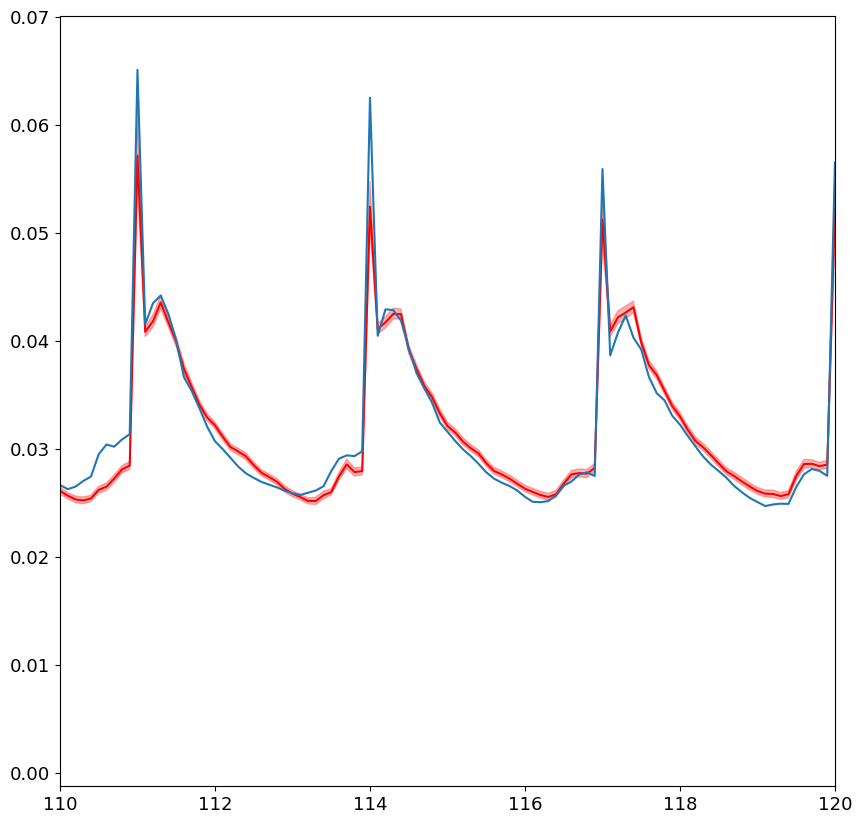

In [50]:

plt.figure(figsize=(10,10))
for ei,exp in enumerate(['C03_H09_V6']):
    plt.plot(df.index, df[exp], color='r')
    plt.fill_between(df.index, df[f'{exp}_lower'], df[f'{exp}_upper'], color='r', alpha=0.3, zorder=0)

plt.plot(df.index, pten)

plt.xlim(110,120)

In [104]:
def preprocess(ds, filename):
    # Extract time from filename (edit this!)
    time_str = filename.split("_")[-1].replace(".nc", "")
    time = (dt.datetime.strptime(filename.split("/")[-1].replace(".nc", "").replace('Inflation_', ''), '%Y-%m-%d_%H:%M:%S') - dt.datetime(2024,5,8,19,30)).seconds/60
    
    return ds.expand_dims(time=[time])

files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
ds = xr.open_mfdataset( files, combine="nested", concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))

In [105]:
exps = [f'C{h:02d}_H15_V4' for h in [15,10,3]]
colors = cmaps.pride(np.linspace(.2, .8, len(exps)))


n = 36
max_index = 36
n_boot = 10000
indices = generate_bootstrap_indices(n, max_index, n_boot, seed=42)
interval = 95

vols = [589,848,1060,1508,1527,1532,2205,2356,2714,3393,3921,4241,6107,6126,8822]
hloc = [18,15,12,9,7]
vloc = [6, 4, 2]


df = pd.DataFrame()

for freq in [15, 10, 3]:

    volume = []
    pres   = []
    adapt  = []
    ci     = []
    for hi, h in enumerate(hloc):
        for vi, v in enumerate(vloc):
    
            exp = f'C{freq:02d}_H{h:02d}_V{v}'
            name = rename(exp, version='full')             
            hr = float(name.split('-')[1][1:])
            vr = float(name.split('-')[2][1:])
                
            files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
            ds = xr.open_mfdataset( files, combine="nested", concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))
            
            wtg = xr.open_dataset(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/balance.nc')
            stop = findnearest(wtg.time.values, 120)#+1


            ci.extend([compute_ci_perc(bootstrap_fss_from_indices(wtg.divc.values[:stop].mean(axis=0).flatten()/100, indices), interval)])


            volume.extend([(4/3)*np.pi*vr*hr*hr])
            pres.extend([np.mean(wtg.divc.values[:stop])/100])
            adapt.extend([np.mean(ds.inflation.values)])
        
   # df = pd.DataFrame( data = {'p': wtg.divc.values[:stop].mean(axis=1)/100}, index = [dt.timedelta(minutes =t) for t in wtg.time.values[:stop]])
    #res = df.resample(dt.timedelta(seconds=int(exp.split('_')[0][1:])*60), label='right', closed='right').mean()

        #plt.scatter(np.mean(ds.inflation.values), np.mean(wtg.divc.values[:stop])/100, color=colors[ei])
    
            wtg.close()
            ds.close()
    df[f'vols_{freq}'] = volume
    df[f'pres_{freq}'] = pres
    df[f'adapt_{freq}'] = adapt
    df[f'ci95_{freq}'] = ci



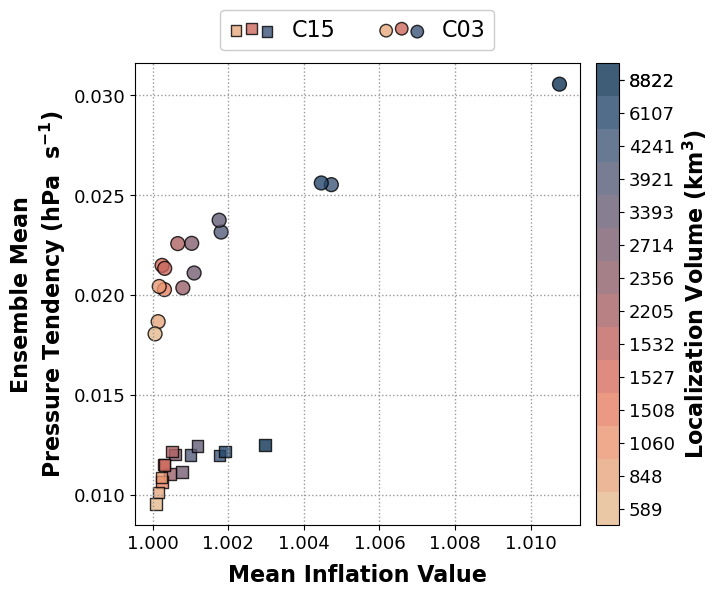

In [127]:
colors = cmaps.lipari(np.linspace(0.1,.85,15))[::-1]

cmap1 = LinearSegmentedColormap.from_list("CR",colors, 14)

mappable = mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=14), cmap=cmap1)
mappable.set_array([])

fig,ax = plt.subplots(1,1, figsize=(7,6))

mycols = [colors[findnearest(vols, df.vols_3.loc[i])] for i in df.index]


#ax.errorbar(df.adapt_3, df.pres_3,yerr= df.ci95_3, ms=0,mec='k', lw=0, elinewidth=4,capsize=0,)# c= mycols, marker='s',s=80,ec='k',label='C15', alpha=0.8)


ax.scatter(df.adapt_15, df.pres_15, c= mycols, marker='s',s=70,ec='k',label='C15', alpha=0.8)
ax.scatter(df.adapt_3, df.pres_3,   c= mycols, marker='o',s=100,ec='k',label='C03', alpha=0.8)
#ax.scatter(df.adapt_10, df.pres_10,   c= mycols, marker='*',s=100,ec='k',label='C03', alpha=0.8)

ax.grid()


cbar = fig.colorbar( mappable, ax=ax, alpha=0.8, pad=0.03)#, spacing='uniform', ticks = np.unique(df.vols_3))#, ticks=np.unique(df1.VOL))
cbar.set_label(r'Localization Volume (km$\mathbf{^3}$)', fontsize=16)
#cbar.set_ticks(ticks=[0, 3, 6,10, 14], labels=[vols[0],vols[3], vols[6],vols[10], vols[14]]);

cbar_ticks = np.array(np.arange(0, 15))
labels = [vols[i] for i in cbar_ticks]

cbar_ticks = np.concatenate([cbar_ticks[:-1] + 0.5, [13.5]])
cbar.set_ticks(ticks=cbar_ticks, labels=labels);



leg = plt.legend(scatterpoints=3, fontsize=16, markerscale=0.9, ncol=2, loc='upper center', bbox_to_anchor=(0.5, 1.14))
leg.legend_handles[0].set_facecolors(cmaps.lipari([0.2,.6, .8])[::-1])
leg.legend_handles[1].set_facecolors(cmaps.lipari([0.2,.6, .8])[::-1])

ax.set_xlabel('Mean Inflation Value', fontsize=16, labelpad=8)
ax.set_ylabel('Ensemble Mean\n'+r'Pressure Tendency (hPa  s$\mathbf{^{-1}}$)', fontsize=16)

# FIGNAME = 'BalanceAndInf'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C03_H07_V4
C03_H09_V4
C03_H12_V4
C03_H15_V4
C03_H18_V4


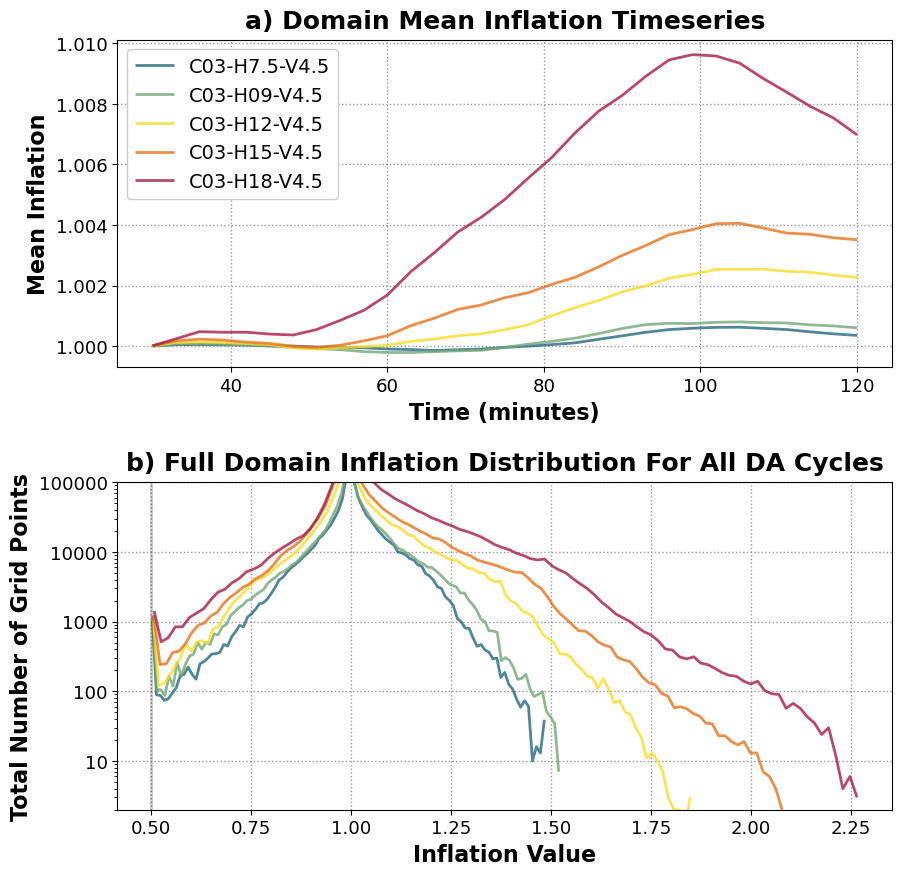

In [145]:
def plot_distribution(ax, var, **kwargs):
    hist, bins = np.histogram(var, bins=100)
    bins = (bins[1:]+bins[:-1])/2.0
    ax.semilogy(bins, hist ,**kwargs)


version='Full'
exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]

colors=cmaps.pride(np.linspace(.2, .8, len(exps)))

fig, axes = plt.subplots(2,1,figsize=(10, 10))

for i, exp in enumerate(exps):
    print(exp)


    files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
    # time=[]
    # dist=[]
    # mean=[]
    # for f in files:
    #     time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
    #     inf = xr.open_dataset(f)
    #     dist.extend(inf.inflation.values.flatten())
    #     mean.append(inf.inflation.mean().values)
    #     inf.close()

    ds = xr.open_mfdataset(files,combine="nested",concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))

    plot_distribution(axes[1], ds.inflation.values.flatten(), label=rename(exp, version=version), color=colors[i], lw=2, alpha=0.8)
    axes[0].plot(ds.time, ds.inflation.mean(axis=(1,2,3)), label=rename(exp, version=version), color=colors[i], lw=2, alpha=0.8)


    # if (exp == 'C03_H18_V4') | (exp == 'C03_H09_V4'):

    #     print(exp[:-2]+"V6")
    #     files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp[:-2]+"V6"}/Inflation*'))
    #     time=[]
    #     dist=[]
    #     mean=[]
    #     for f in files:
    #         time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
    #         inf = xr.open_dataset(f)
    #         dist.extend(inf.inflation.values.flatten())
    #         mean.append(inf.inflation.mean().values)
    #         inf.close()
    
    #     plot_distribution(axes[1], dist, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
    #     axes[0].plot(np.array(time)/60, mean, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
        

axes[0].set_xlabel('Time (minutes)', fontsize=16)
axes[0].set_ylabel('Mean Inflation', fontsize=16)
axes[0].set_title('a) Domain Mean Inflation Timeseries', weight='bold', fontsize=18, y=1.01)
axes[0].legend(fontsize=14, loc=2)

axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
axes[1].set_xlabel('Inflation Value', fontsize=16)
axes[1].set_ylabel('Total Number of Grid Points', fontsize=16)
axes[1].set_title('b) Full Domain Inflation Distribution For All DA Cycles', weight='bold', fontsize=18, y=1.01)
axes[1].set_ylim(2, 100000)
axes[1].axvline(0.5, color='k', lw=2, alpha=0.2)

#axes[1].legend(fontsize=14)

for ax in axes:ax.grid()

plt.subplots_adjust(hspace=.35)


# FIGNAME = 'Inflation'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

C15_H07_V4
C15_H09_V4
C15_H12_V4
C15_H15_V4
C15_H18_V4
C10_H07_V4
C10_H09_V4
C10_H12_V4
C10_H15_V4
C10_H18_V4
C03_H07_V4
C03_H09_V4
C03_H12_V4
C03_H15_V4
C03_H18_V4


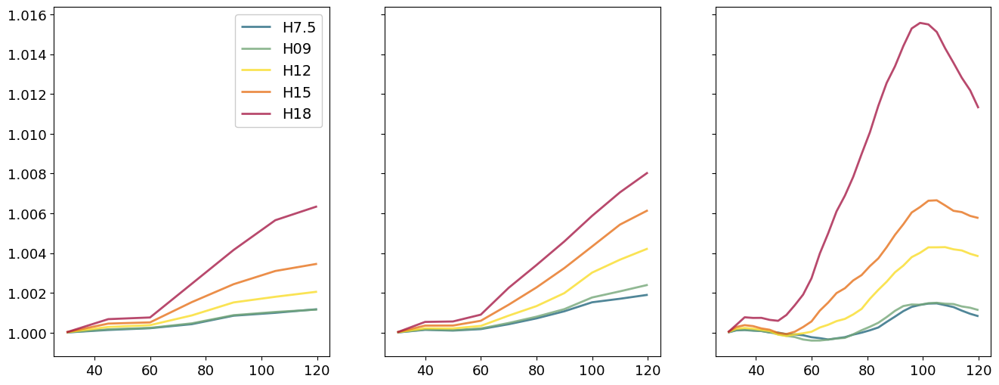

In [213]:
def plot_distribution(ax, var, **kwargs):
    hist, bins = np.histogram(var, bins=100)
    bins = (bins[1:]+bins[:-1])/2.0
    ax.semilogy(bins, hist ,**kwargs)


version='Full'
exps = [f'C03_H{h:02d}_V4' for h in [7,9,12,15,18]]



fig, axes = plt.subplots(1,3,figsize=(16, 6), sharex=True, sharey=True)


for ci, cint in enumerate([15, 10,3]):


    exps = [f'C{cint:02d}_H{h:02d}_V4' for h in [7,9,12,15,18]]
    colors=cmaps.pride(np.linspace(.2, .8, len(exps)))
    for i, exp in enumerate(exps):
        print(exp)
    
    
        files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp}/Inflation*'))
        # time=[]
        # dist=[]
        # mean=[]
        # for f in files:
        #     time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
        #     inf = xr.open_dataset(f)
        #     dist.extend(inf.inflation.values.flatten())
        #     mean.append(inf.inflation.mean().values)
        #     inf.close()
    
        ds = xr.open_mfdataset(files,combine="nested",concat_dim="time", preprocess=lambda ds: preprocess(ds, ds.encoding["source"]))
    
        #plot_distribution(axes[1], ds.inflation.values.flatten(), label=rename(exp, version=version), color=colors[i], lw=2, alpha=0.8)
        inf = ds.inflation.values
        inf[inf==1.0] = np.nan
        axes[ci].plot(ds.time, np.nanmean(inf, axis=(1,2,3)), label=rename(exp, version='H').split('-')[-1], color=colors[i], lw=2, alpha=0.8)
    
    
        # if (exp == 'C03_H18_V4') | (exp == 'C03_H09_V4'):
    
        #     print(exp[:-2]+"V6")
        #     files = sorted(glob.glob(f'/work/jessica.mcdonald/CM1_LETKF_2025/experiments/{exp[:-2]+"V6"}/Inflation*'))
        #     time=[]
        #     dist=[]
        #     mean=[]
        #     for f in files:
        #         time.append((dt.datetime.strptime(f.split('Inflation_')[1], '%Y-%m-%d_%H:%M:%S.nc') - dt.datetime(2024,5,8,19,30)).seconds)
        #         inf = xr.open_dataset(f)
        #         dist.extend(inf.inflation.values.flatten())
        #         mean.append(inf.inflation.mean().values)
        #         inf.close()
        
        #     plot_distribution(axes[1], dist, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
        #     axes[0].plot(np.array(time)/60, mean, label=rename(exp[:-2]+"V6", version=version), color=colors[i], lw=2, alpha=0.8, ls='--')
            

# axes[0].set_xlabel('Time (minutes)', fontsize=16)
# axes[0].set_ylabel('Mean Inflation', fontsize=16)
# axes[0].set_title('a) Domain Mean Inflation Timeseries', weight='bold', fontsize=18, y=1.01)
# axes[0].legend(fontsize=14, loc=2)

# axes[1].yaxis.set_major_formatter(ticker.ScalarFormatter())
# axes[1].set_xlabel('Inflation Value', fontsize=16)
# axes[1].set_ylabel('Total Number of Grid Points', fontsize=16)
# axes[1].set_title('b) Full Domain Inflation Distribution For All DA Cycles', weight='bold', fontsize=18, y=1.01)
# axes[1].set_ylim(2, 100000)
# axes[1].axvline(0.5, color='k', lw=2, alpha=0.2)

# #axes[1].legend(fontsize=14)

# for ax in axes:ax.grid()

# plt.subplots_adjust(hspace=.35)

axes[0].legend(fontsize=14)


# FIGNAME = 'Inflation'
# plt.savefig(f'/work/jessica.mcdonald/PublicationFigures/FIG{FIGNAME}.png', dpi=300, bbox_inches='tight')

In [212]:
rename(exp, version='H').split('-')[-1]

'H18'